# Prediccion de `% Silica Concentrate` y `% Iron Concentrate` (flotacion), horizonte de 1 hora

Notebook centrado en predecir, **una hora vista**, tanto `% Silica Concentrate`
como `% Iron Concentrate` (las dos salidas de calidad del concentrado tras la
flotacion), con un LSTM comparado contra un baseline naive de persistencia
(`y[t+1h] = y[t]`). El mismo pipeline (features, split cronologico, escalado,
arquitectura) se entrena una vez por target para que ambos sean directamente
comparables entre si.

**Todas las variables disponibles se usan como features para los dos
targets** -- incluida la salida hermana (silica como feature al predecir
hierro, y viceversa) y las columnas de laboratorio del alimento
(`% Iron Feed`, `% Silica Feed`). Ver la seccion "Features excluidas..." mas
abajo para el razonamiento que originalmente motivaba excluir algunas de
estas columnas -- se mantiene documentado aunque ya no se aplique.

**Por que 1 hora y no 20 segundos, aunque los sensores muestrean cada 20s:**
`% Silica Concentrate` (y el resto de columnas de laboratorio: `% Iron Feed`,
`% Silica Feed`, `% Iron Concentrate`) se mide una vez por hora en el
laboratorio -- en el CSV crudo ese mismo valor aparece repetido en las ~180 filas
de 20s de esa hora porque así se exporto el archivo, no porque se haya medido
mas a menudo. Entrenar o evaluar a resolucion de 20s usando ese valor repetido
haria que el modelo aprendiera a reproducir un escalon, no dinamica real, y el
RMSE saldria artificialmente bueno (la mayoria de vecinos de 20s comparten
literalmente la misma etiqueta). Por eso:

- Los sensores rapidos (flujos, presiones, niveles, pH, densidad) se agregan a
  **media horaria** como features de entrada -- información real, no se
  desperdicia.
- El target solo se evalua en **una etiqueta real por hora** (el valor de
  laboratorio), prediciendo la hora siguiente a partir de la actual.

Pipeline: carga y agregacion horaria -> limpieza minima -> deteccion/tratamiento
de outliers (Pauta vs Chauvenet) -> suavizado (SMA) -> importancia de features
via XGBoost -> LSTM (parametrizado, con registro de experimentos, entrenado
para silica y para hierro) -> entrenamiento -> evaluacion -> grafica.


In [1]:
import copy
import hashlib
import json
import math
import os

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

## Carga y agregacion horaria

In [2]:
filepath = '../Datasets/MiningProcess_Flotation_Plant_Database.csv'
TARGET = '% Iron Concentrate'
HORIZON = 1  # horas -- se predice el valor de TARGET dentro de HORIZON horas

raw = pd.read_csv(filepath, decimal=',')
raw['date'] = pd.to_datetime(raw['date'])

# Columnas de laboratorio: se miden una vez por hora y aparecen repetidas en el CSV
# crudo en cada fila de 20s de esa hora (no son 180 medidas independientes).
lab_cols = ['% Iron Feed', '% Silica Feed', '% Iron Concentrate', '% Silica Concentrate']
sensor_cols = [c for c in raw.columns if c not in ['date'] + lab_cols]

# Agregamos a resolucion horaria: media para los sensores rapidos (agrega
# informacion real, ~180 muestras/hora), 'first' para las columnas de
# laboratorio (todas las filas de la hora ya comparten el mismo valor).
agg = {c: 'mean' for c in sensor_cols}
agg.update({c: 'first' for c in lab_cols})
df = raw.groupby('date', as_index=True).agg(agg).sort_index()

# Rellenamos huecos horarios que falten en el indice (haberlos hay: la campana no
# es perfectamente continua) e interpolamos linealmente.
full_range = pd.date_range(df.index.min(), df.index.max(), freq='h')
n_missing_hours = len(full_range.difference(df.index))
df = df.reindex(full_range)

for c in df.columns:
    if df[c].isna().any():
        df[c] = df[c].ffill()

print(f"Filas (horas): {len(df)} | horas que faltaban en el indice original y se rellenaron: {n_missing_hours}")
print(df[TARGET].describe())

Filas (horas): 4415 | horas que faltaban en el indice original y se rellenaron: 318
count    4415.000000
mean       64.975157
std         1.112695
min        62.050000
25%        64.060000
50%        65.110000
75%        65.800000
max        68.010000
Name: % Iron Concentrate, dtype: float64


## Periodo de arranque (inicio de campana): se descarta

Las primeras ~149 horas (2017-03-10 01:00 -> 2017-03-29 11:01) corresponden a un
periodo de arranque/puesta en marcha, no a operacion normal de la planta.
Comprobado empiricamente contra el resto de la campana (2017-03-29 en adelante):

- `Flotation Column 04 Air Flow` y `Flotation Column 05 Air Flow` tienen
  **varianza horaria exactamente 0** durante este periodo -- valores de arranque
  fijos, sin variacion real, hasta que el proceso arranca de verdad.
- La mayoria de columnas de `Air Flow` y `Level` de las columnas de flotacion
  muestran un desplazamiento de media de 1-2 desviaciones estandar entre este
  periodo y el resto de la campana.

Son 149 horas (3.6% del total). Se trunca `df` para que empiece justo despues
del corte, antes de cualquier deteccion de outliers, SMA o entrenamiento --
así el arranque no contamina ni el analisis de outliers ni ningun `CONFIG` que
se pruebe mas adelante.

In [3]:
STARTUP_END = pd.Timestamp('2017-03-29 11:01:47.998')


def is_startup_period(timestamps, startup_end=STARTUP_END):
    """True para los timestamps que caen dentro del periodo de arranque
    (antes de STARTUP_END)."""
    return timestamps <= startup_end


n_before = len(df)
mask_startup = is_startup_period(df.index)
print(f"Filas en periodo de arranque (se descartan): {mask_startup.sum()} "
      f"({mask_startup.sum() / n_before * 100:.1f}%)")

df = df.loc[~mask_startup].copy()

print(f"Filas antes: {n_before} | despues de truncar arranque: {len(df)}")
print(f"Nuevo rango temporal: {df.index.min()} -> {df.index.max()}")

Filas en periodo de arranque (se descartan): 467 (10.6%)
Filas antes: 4415 | despues de truncar arranque: 3948
Nuevo rango temporal: 2017-03-29 12:00:00 -> 2017-09-09 23:00:00


## Features excluidas: salidas de la misma etapa y composicion de laboratorio

> **Decision actual: no se excluye nada.** A peticion expresa, el pipeline usa
> **todas** las variables disponibles como candidatas a feature, para los dos
> targets (silica y hierro) -- incluida la salida hermana y las dos columnas
> de laboratorio del alimento. `EXCLUDED_FEATURES` se deja definida como lista
> vacia (en vez de eliminarse) porque el resto del pipeline
> (`build_supervised`, `prepare_data_flat`, el backtest, etc.) la usa como el
> punto unico de exclusion. El razonamiento que originalmente motivaba
> excluir estas columnas se mantiene documentado abajo porque sigue siendo
> valido si en el futuro se quiere volver a un soft sensor que solo dependa de
> señales de planta en continuo.

Motivos que originalmente llevaban a excluir columnas de las features del modelo:

- **La salida hermana** (`% Iron Concentrate` al predecir silica, o
  `% Silica Concentrate` al predecir hierro): salida del mismo proceso de
  flotacion medida en el mismo instante que el target, no una entrada/condicion
  de proceso. Igual que se decidio excluir `Temperature1`/`Temperature2`
  (otras salidas de la misma etapa que el target) en el notebook del proceso
  de manufactura, se excluia por el mismo motivo: usar una salida hermana del
  target como predictor no es fuga de datos en sentido estricto, pero tampoco
  es un predictor legitimo si el objetivo es predecir el target a partir de
  las condiciones del proceso.
- **`% Iron Feed`, `% Silica Feed`**: aunque son composicion del mineral que
  **entra** al proceso (no una salida), tambien son medidas de laboratorio a
  cadencia horaria, igual que el target -- no vienen de los sensores rapidos de
  planta. Se excluian para que el soft sensor solo dependiera de senales que un
  despliegue real tendria disponibles en continuo (flujos, presiones, niveles,
  pH, densidad, caudales de reactivo), no de otra medida de laboratorio.


In [4]:
# Por peticion explicita: se usan TODAS las variables disponibles como
# features, para los dos targets (silica y hierro). No se excluye ni la
# salida hermana ni las columnas de laboratorio del alimento (ver la celda de
# markdown de arriba para el razonamiento que antes motivaba excluirlas).
#
# Se deja EXCLUDED_FEATURES definida (vacia) en vez de eliminada porque el
# resto del pipeline (build_supervised, prepare_data_flat, el backtest, el
# barrido de retardos a resolucion nativa...) la referencia como el punto
# unico de exclusion de features.
EXCLUDED_FEATURES = []

print(f"Target activo: {TARGET}")
print(f"Excluidas como features: {EXCLUDED_FEATURES if EXCLUDED_FEATURES else '(ninguna -- se usan todas las variables disponibles)'}")


Target activo: % Iron Concentrate
Excluidas como features: (ninguna -- se usan todas las variables disponibles)


## Deteccion de outliers: criterio de Pauta vs Chauvenet

**Umbrales calculados solo con el tramo de entrenamiento.** La media y la
desviacion tipica que definen que es un outlier se estiman unicamente sobre el
70% inicial de la serie (el mismo tramo que luego sera `train`), y despues se
aplican a toda la serie. Calcularlas sobre el dataset completo seria fuga: los
umbrales incorporarian la distribucion de validacion y test, que en produccion
todavia no se ha visto.

Esto tambien refleja mejor el escenario real que te interesa probar: en
explotacion los umbrales se fijan con el historico disponible y luego llegan
datos nuevos, posiblemente mas ruidosos, que hay que filtrar con esos umbrales
ya fijados -- no se re-calibra el criterio con los datos que aun no han
ocurrido.

In [5]:
OUTLIER_MIN_FRAC = 0.0005  # 0.05%: por debajo de esto, se considera que el metodo no hace nada
OUTLIER_MAX_FRAC = 0.05    # 5%: por encima de esto, se considera demasiado agresivo

# Fraccion inicial de la serie usada para estimar los estadisticos (media/std)
# de los criterios de outliers. Coincide con el split de train de mas abajo.
TRAIN_FRAC = 0.70
fit_end = int(len(df) * TRAIN_FRAC)
df_fit = df.iloc[:fit_end]

print(f"Umbrales estimados solo con las primeras {fit_end} horas "
      f"({TRAIN_FRAC:.0%} inicial), aplicados luego a las {len(df)} horas.")


def pauta_mask(series, series_fit=None, k=3.0):
    """Regla de Pauta / 3-sigma: outlier si |x - media| > k * std.

    `series_fit` es el tramo con el que se estiman media y std (train). Si no se
    pasa, se usa la propia serie -- solo para uso exploratorio.
    """
    ref = series if series_fit is None else series_fit
    mean = ref.mean()
    std = ref.std()
    if std == 0 or np.isnan(std):
        return pd.Series(False, index=series.index)
    return (series - mean).abs() > k * std


def chauvenet_mask(series, series_fit=None):
    """Criterio de Chauvenet: outlier si la probabilidad de observar un valor tan
    extremo (bajo una normal ajustada a media/std del tramo de ajuste) es menor
    que 1/(2n). El umbral en unidades de std se obtiene invirtiendo la CDF normal
    con la funcion error (math.erf), sin depender de scipy/numpy para el calculo
    del umbral en si."""
    ref = series if series_fit is None else series_fit
    n = len(ref)
    mean = ref.mean()
    std = ref.std()
    if std == 0 or np.isnan(std) or n < 2:
        return pd.Series(False, index=series.index)

    p_reject = 1.0 / (2 * n)
    target = 1.0 - p_reject

    lo, hi = 0.0, 10.0
    for _ in range(60):
        mid = (lo + hi) / 2
        val = math.erf(mid / math.sqrt(2))
        if val < target:
            lo = mid
        else:
            hi = mid
    z_threshold = (lo + hi) / 2

    return (series - mean).abs() > z_threshold * std


# Ninguna de las dos columnas de concentrado (silica NI hierro) se limpia/
# suaviza aqui, sea cual sea TARGET -- ambas son posibles targets segun la
# seccion de comparacion silica-vs-hierro mas abajo, y dejarlas 'en bruto'
# es lo que permite comparar ambas de forma simetrica.
_BOTH_CONCENTRATE_TARGETS = ['% Silica Concentrate', '% Iron Concentrate']
outlier_cols = [c for c in df.columns if c not in _BOTH_CONCENTRATE_TARGETS]
comparison_rows = []
for c in outlier_cols:
    n_pauta = pauta_mask(df[c], df_fit[c]).sum()
    n_chauvenet = chauvenet_mask(df[c], df_fit[c]).sum()
    comparison_rows.append({
        'feature': c,
        'n_pauta': n_pauta,
        'frac_pauta': n_pauta / len(df),
        'n_chauvenet': n_chauvenet,
        'frac_chauvenet': n_chauvenet / len(df),
    })

outlier_comparison = pd.DataFrame(comparison_rows).set_index('feature')


def pick_method(row):
    """Elige el metodo cuya fraccion de outliers cae en el rango razonable
    [OUTLIER_MIN_FRAC, OUTLIER_MAX_FRAC]. Si los dos caen dentro, se prefiere
    Chauvenet (mas conservador). Si ninguno cae dentro, tambien se usa Chauvenet
    (no marcar nada es mas seguro que sobre-limpiar)."""
    pauta_ok = OUTLIER_MIN_FRAC <= row['frac_pauta'] <= OUTLIER_MAX_FRAC
    chauvenet_ok = OUTLIER_MIN_FRAC <= row['frac_chauvenet'] <= OUTLIER_MAX_FRAC
    if chauvenet_ok:
        return 'chauvenet'
    if pauta_ok:
        return 'pauta'
    return 'chauvenet'


outlier_comparison['method'] = outlier_comparison.apply(pick_method, axis=1)

pd.set_option('display.width', 200)
print(outlier_comparison.round(4).to_string())
print(f"\nMetodo elegido por senal: {outlier_comparison['method'].value_counts().to_dict()}")

Umbrales estimados solo con las primeras 2763 horas (70% inicial), aplicados luego a las 3948 horas.
                              n_pauta  frac_pauta  n_chauvenet  frac_chauvenet     method
feature                                                                                  
Starch Flow                         9      0.0023            0          0.0000      pauta
Amina Flow                          2      0.0005            0          0.0000      pauta
Ore Pulp Flow                     882      0.2234          791          0.2004  chauvenet
Ore Pulp pH                        61      0.0155            0          0.0000      pauta
Ore Pulp Density                    0      0.0000            0          0.0000  chauvenet
Flotation Column 01 Air Flow       58      0.0147            0          0.0000      pauta
Flotation Column 02 Air Flow        9      0.0023            0          0.0000      pauta
Flotation Column 03 Air Flow       17      0.0043            0          0.0000      pauta

## Aplicar el criterio elegido: interpolar los outliers

Para cada senal, usamos el metodo (Pauta o Chauvenet) elegido arriba para marcar
los outliers y los sustituimos por interpolacion lineal, igual que con los NaN
puntuales al agregar por hora. Guardamos una copia de `df` **antes** de este
paso (`df_before_outliers`) para la comparacion visual mas abajo.

In [6]:
df_before_outliers = df.copy()

n_replaced_total = 0
for c in outlier_cols:
    method = outlier_comparison.loc[c, 'method']
    mask = (pauta_mask(df[c], df_fit[c]) if method == 'pauta'
            else chauvenet_mask(df[c], df_fit[c]))
    if mask.any():
        df.loc[mask, c] = np.nan
        n_replaced_total += mask.sum()

# Interpolacion causal: ffill en vez de interpolate(), que mezclaria el valor
# siguiente (futuro) al rellenar. En tiempo real, ante una lectura anomala solo
# se puede arrastrar la ultima lectura buena.
for c in outlier_cols:
    if df[c].isna().any():
        df[c] = df[c].ffill().bfill()

print(f"Total de puntos sustituidos (outliers): {n_replaced_total}")
print(f"({n_replaced_total / (len(df) * len(outlier_cols)) * 100:.3f}% de todas las celdas de features)")

Total de puntos sustituidos (outliers): 1300
(1.568% de todas las celdas de features)


## Media movil simple (SMA) causal para filtrar ruido

**Ventana causal, no centrada.** Antes se usaba `center=True`, que en el
instante `t` promedia `t-1, t, t+1` -- es decir, mete informacion del futuro en
cada feature. En un despliegue real ese valor todavia no existe, así que
`center=True` es fuga de datos: infla los resultados respecto a lo que se
lograria en produccion. Se pasa a `center=False`, que solo mira hacia atras
(`t-2, t-1, t`), exactamente lo que estaria disponible en tiempo real.

Medido en este dataset, la fuga valia poco (skill +0.0374 con centrada vs
+0.0358 causal) porque el target nunca se suaviza, pero el resultado causal es
el defendible.

Se aplica a cada feature de entrada (no al target). Guardamos una copia
(`df_before_sma`) para la comparacion final.

In [7]:
SMA_WINDOW = 3  # horas

df_before_sma = df.copy()

# center=False -> ventana causal: en el instante t solo promedia t-2, t-1, t.
for c in outlier_cols:
    df[c] = df[c].rolling(window=SMA_WINDOW, center=False, min_periods=1).mean()

print(f"SMA causal aplicada con ventana de {SMA_WINDOW}h a las {len(outlier_cols)} features "
      f"de entrada (target sin tocar).")

SMA causal aplicada con ventana de 3h a las 21 features de entrada (target sin tocar).


## Comparacion: senal original vs procesada (outliers + SMA)

Una grafica por feature, con la serie original (`df_before_outliers`) superpuesta
a la version final procesada (`df`), para comprobar visualmente que el procesado
no ha distorsionado la dinamica real de cada senal.

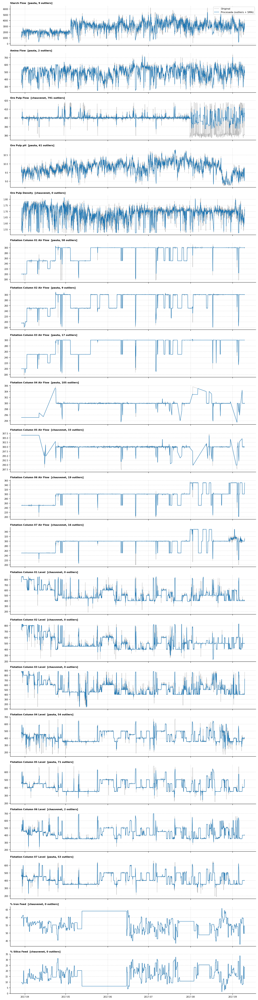

In [8]:
n_signals = len(outlier_cols)
fig, axes = plt.subplots(n_signals, 1, figsize=(12, 2.2 * n_signals), sharex=True)

for ax, c in zip(axes, outlier_cols):
    ax.plot(df_before_outliers.index, df_before_outliers[c], color='#999999',
             linewidth=0.7, alpha=0.7, label='Original')
    ax.plot(df.index, df[c], color='#1f77b4', linewidth=1.0, label='Procesada (outliers + SMA)')
    method = outlier_comparison.loc[c, 'method']
    n_out = outlier_comparison.loc[c, f'n_{method}']
    ax.set_title(f'{c}  [{method}, {n_out} outliers]', fontsize=8, loc='left', fontweight='bold')
    ax.tick_params(labelsize=7)
    ax.grid(True, linestyle='--', alpha=0.4)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

axes[0].legend(fontsize=8, loc='upper right')
plt.tight_layout()
plt.show()

## Matriz de correlacion (variables procesadas)

Correlacion de Pearson entre todas las variables ya procesadas (outliers
tratados + SMA aplicada), incluyendo el target. Sirve para detectar
redundancia entre features (p.ej. las 7 columnas de flotacion suelen moverse
juntas) y para ver, de un vistazo, que variables se correlacionan mas con
`% Silica Concentrate` antes de pasar al analisis de importancia con XGBoost.

Mapa de color divergente (`RdBu_r`, centrado en 0): rojo = correlacion
positiva, azul = negativa, blanco = sin correlacion -- evita que una paleta
secuencial sugiera que "mas intenso" siempre significa "mas correlacionado
positivamente".

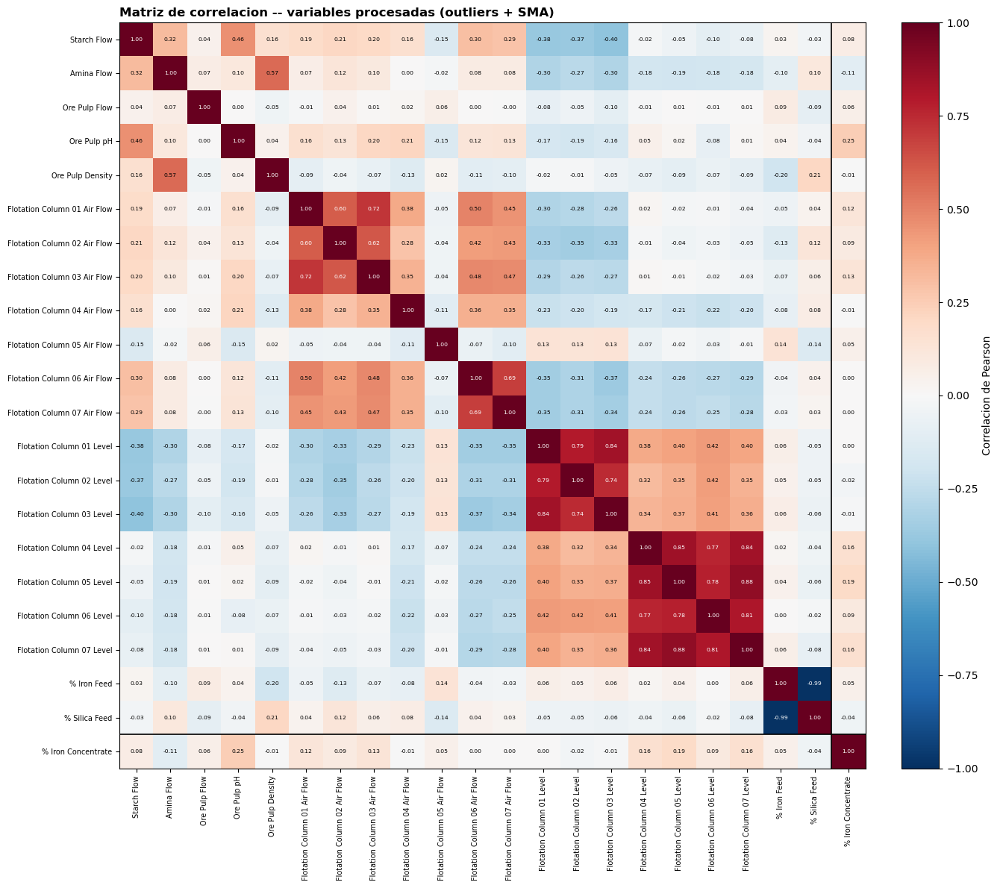


Correlacion de cada feature con el target (% Iron Concentrate), ordenada por valor absoluto:
Ore Pulp pH                     0.246568
Flotation Column 05 Level       0.189996
Flotation Column 04 Level       0.162755
Flotation Column 07 Level       0.156361
Flotation Column 03 Air Flow    0.127308
Flotation Column 01 Air Flow    0.119704
Amina Flow                     -0.107979
Flotation Column 06 Level       0.094141
Flotation Column 02 Air Flow    0.088673
Starch Flow                     0.075316
Ore Pulp Flow                   0.055421
Flotation Column 05 Air Flow    0.053670
% Iron Feed                     0.051120
% Silica Feed                  -0.043749
Flotation Column 02 Level      -0.024760
Flotation Column 03 Level      -0.009697
Ore Pulp Density               -0.007736
Flotation Column 04 Air Flow   -0.005188
Flotation Column 01 Level       0.003225
Flotation Column 06 Air Flow    0.002265
Flotation Column 07 Air Flow    0.000098


In [9]:
corr_cols = outlier_cols + [TARGET]
corr_matrix = df[corr_cols].corr(method='spearman')

fig, ax = plt.subplots(figsize=(14, 12))
im = ax.imshow(corr_matrix.values, cmap='RdBu_r', vmin=-1, vmax=1)

ax.set_xticks(range(len(corr_cols)))
ax.set_yticks(range(len(corr_cols)))
ax.set_xticklabels(corr_cols, rotation=90, fontsize=7)
ax.set_yticklabels(corr_cols, fontsize=7)

for i in range(len(corr_cols)):
    for j in range(len(corr_cols)):
        value = corr_matrix.values[i, j]
        color = 'white' if abs(value) > 0.6 else 'black'
        ax.text(j, i, f'{value:.2f}', ha='center', va='center', fontsize=5.5, color=color)

target_idx = corr_cols.index(TARGET)
ax.axhline(target_idx - 0.5, color='black', linewidth=1.2)
ax.axvline(target_idx - 0.5, color='black', linewidth=1.2)

cbar = fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
cbar.set_label('Correlacion de Pearson')
ax.set_title('Matriz de correlacion -- variables procesadas (outliers + SMA)', loc='left', fontweight='bold')

plt.tight_layout()
plt.show()

print(f"\nCorrelacion de cada feature con el target ({TARGET}), ordenada por valor absoluto:")
target_corr = corr_matrix[TARGET].drop(TARGET).sort_values(key=np.abs, ascending=False)
print(target_corr.to_string())

## Poda de sensores redundantes (colinealidad)

> **Decision actual: `PRUNE_THRESHOLD = None`.** A peticion expresa de usar
> todas las variables, no se poda ningun sensor por colinealidad. La tabla de
> abajo (medida con la configuracion anterior) muestra que la poda no cambiaba
> el skill -- así que desactivarla tampoco lo penaliza -- pero ya no se aplica
> aqui porque el objetivo actual es que el modelo vea el conjunto completo de
> sensores.

La matriz de arriba muestra bloques muy correlacionados: las 7 columnas de
flotacion se mueven casi juntas (`Column 01 Air Flow` y `Column 03 Air Flow`
llegan a **r = 0.988**, practicamente el mismo sensor duplicado).

**Regla (cuando `PRUNE_THRESHOLD` no es `None`):** de cada par con
`|r| > PRUNE_THRESHOLD` se elimina el que peor correlaciona con lo que el
modelo predice aqui (el **delta**, no el nivel), conservando el mas
informativo. El target y sus retardos estan **protegidos**: nunca se podan,
porque son la senal principal.

> **Que aportaba y que no (medido, 6 semillas, con la exclusion de salida
> hermana + feed activa):**
>
> | features | test skill |
> |---|---|
> | 26 (sin poda) | +0.0617 +- 0.0023 |
> | 23 (`|r|>0.9`) | +0.0611 +- 0.0030 |
> | 21 (`|r|>0.8`) | +0.0626 +- 0.0028 |
> | 16 (`|r|>0.7`) | +0.0617 +- 0.0038 |
>
> **No cambiaba la precision**: todas las diferencias (~0.001) estan muy por
> debajo de la dispersion entre semillas. Los arboles ya ignoran el sensor
> duplicado, así que quitarlo no aporta informacion nueva -- la colinealidad
> hace dano en modelos lineales, no aqui.
>
> **Sí simplificaba el despliegue:** con `|r| > 0.7` se pasaba de 26 a 16
> features manteniendo el mismo skill. Diez sensores menos que instrumentar,
> calibrar y mantener -- una opcion a considerar si en el futuro se vuelve a
> priorizar el despliegue sobre usar todas las variables.


In [10]:
# Umbral de poda por colinealidad. None = sin poda (se usan todas las
# variables). Antes se usaba 0.7 (16 features, mismo skill, mas simple de
# desplegar) -- se deja en None ahora porque el objetivo actual es usar
# absolutamente todas las variables disponibles para los dos targets.
PRUNE_THRESHOLD = None


def corr_simple(a, b):
    """Correlacion de Pearson elemental (np.corrcoef no esta disponible en este
    entorno por el bloqueo de BLAS)."""
    a = np.asarray(a, dtype=float)
    b = np.asarray(b, dtype=float)
    ok = ~(np.isnan(a) | np.isnan(b))
    a, b = a[ok] - a[ok].mean(), b[ok] - b[ok].mean()
    den = np.sqrt((a * a).sum() * (b * b).sum())
    return float((a * b).sum() / den) if den > 0 else 0.0


def prune_correlated(cols, threshold, data, target_col):
    """De cada par de columnas con |r| > threshold elimina la que peor
    correlaciona con `target_col`. Devuelve (conservadas, DataFrame de
    eliminaciones).

    Las correlaciones se calculan solo sobre el tramo de train para no filtrar
    informacion de validacion/test en la seleccion de features.
    """
    fit = data.iloc[:int(len(data) * 0.70)]
    r_target = {c: abs(corr_simple(fit[c], fit[target_col])) for c in cols}
    cmat = fit[cols].corr().abs()

    pairs = sorted(((cmat.loc[x, y], x, y)
                    for i, x in enumerate(cols) for y in cols[i + 1:]), reverse=True)

    keep, removed = list(cols), []
    for r, x, y in pairs:
        if r <= threshold:
            break
        if x in keep and y in keep:
            drop = y if r_target[x] >= r_target[y] else x
            kept = x if drop == y else y
            keep.remove(drop)
            removed.append({'eliminado': drop, 'se_queda': kept, 'r': r})
    return keep, pd.DataFrame(removed)


if PRUNE_THRESHOLD is not None:
    _cands = [c for c in outlier_cols if c not in EXCLUDED_FEATURES]
    _kept, _removed = prune_correlated(_cands, PRUNE_THRESHOLD, df, TARGET)
    print(f"Poda con |r| > {PRUNE_THRESHOLD}: {len(_cands)} -> {len(_kept)} sensores de proceso")
    if not _removed.empty:
        print(_removed.round(3).to_string(index=False))
else:
    print("PRUNE_THRESHOLD = None: no se poda ninguna feature (se usan todas las variables)")


PRUNE_THRESHOLD = None: no se poda ninguna feature (se usan todas las variables)


## Configuracion del experimento

Los hiperparametros se agrupan en un diccionario `CONFIG`, lo que permite (a)
registrar cada combinacion probada junto con sus resultados en un CSV, y (b)
detectar si una combinacion ya se probo antes, para no repetir entrenamientos.

In [11]:
EXPERIMENTS_CSV = 'experiments_mining.csv'

# Valores por defecto -- esta celda define el CONFIG que se usa si ejecutas el
# notebook de arriba a abajo tal cual. Mas abajo, en la seccion de experimentos,
# se sobreescribe CONFIG para cada combinacion que se quiera probar.
CONFIG = {
    'target_col': TARGET,
    'horizon': HORIZON,
    'lags': [1, 2, 3],     # retardos del target usados como features
    'seq_len': 12,
    'hidden_size': 32,
    'num_layers': 1,
    'dropout': 0.3,
    'lr': 1e-3,
    'weight_decay': 1e-4,
    'batch_size': 32,
    'n_epochs': 50,
    'patience': 8,
}


def config_hash(config):
    """Hash estable de la configuracion (ordenando las claves) para detectar
    combinaciones repetidas independientemente del orden de insercion. Las
    listas/tuplas se normalizan a lista para que [1,2,3] y (1,2,3) den el mismo
    hash."""
    canonical_cfg = {k: (list(v) if isinstance(v, (list, tuple)) else v)
                     for k, v in config.items()}
    canonical = json.dumps(canonical_cfg, sort_keys=True)
    return hashlib.sha256(canonical.encode()).hexdigest()[:12]


def load_experiments_log():
    if os.path.exists(EXPERIMENTS_CSV):
        return pd.read_csv(EXPERIMENTS_CSV)
    return pd.DataFrame()


def config_already_tried(config, log_df):
    if log_df.empty or 'config_hash' not in log_df.columns:
        return False
    return config_hash(config) in log_df['config_hash'].values

## Importancia de features via XGBoost

Antes de meter todas las features al LSTM sin distincion, entrenamos un XGBoost
sobre el mismo target (`% Silica Concentrate`, una hora vista) para ver que
variables de entrada resultan mas relevantes segun un modelo de arboles -- mas
barato que entrenar un barrido de LSTMs.

Reutiliza la misma logica que `prepare_data()` (definida mas abajo para el
LSTM) para que el target/split sean identicos, pero sin ventanas deslizantes --
XGBoost trabaja fila a fila.

In [12]:
import xgboost as xgb

XGB_HORIZON = HORIZON       # mismo horizonte que CONFIG
XGB_LAGS = [1, 2, 3]        # mismos retardos que CONFIG['lags']


def prepare_data_flat(target_col, horizon, lags=()):
    """Version simplificada de prepare_data(): mismo target diferenciado
    (TARGET_delta = y[t+horizon] - y[t]), mismos retardos y misma poda de
    colinealidad, con el mismo split cronologico 70/15/15, pero sin ventanas
    deslizantes -- XGBoost trabaja fila a fila."""
    df_local = df.copy()
    df_local['TARGET_fwd'] = df_local[target_col].shift(-horizon)
    df_local['TARGET_delta'] = df_local['TARGET_fwd'] - df_local[target_col]
    for L in lags:
        df_local[f'lag_{L}'] = df_local[target_col].shift(L)
        df_local[f'delta_lag_{L}'] = df_local[target_col] - df_local[target_col].shift(L)
    df_local = df_local.dropna().copy()

    # El valor actual del target se mantiene como feature; solo se excluye lo
    # derivado del futuro.
    feature_cols = [c for c in df_local.columns
                     if c not in ['TARGET_fwd', 'TARGET_delta'] + EXCLUDED_FEATURES]

    # Misma poda que en build_supervised(), para comparar en igualdad.
    if PRUNE_THRESHOLD is not None:
        protected = [target_col] + [f'lag_{L}' for L in lags] + [f'delta_lag_{L}' for L in lags]
        candidates = [c for c in feature_cols if c not in protected]
        kept, _ = prune_correlated(candidates, PRUNE_THRESHOLD, df_local, 'TARGET_delta')
        feature_cols = [c for c in feature_cols if c in protected or c in kept]

    X = df_local[feature_cols].values
    y = df_local['TARGET_delta'].values

    n = len(df_local)
    train_end = int(n * 0.70)
    val_end = int(n * 0.85)

    return {
        'feature_cols': feature_cols,
        'X_train': X[:train_end], 'y_train': y[:train_end],
        'X_val': X[train_end:val_end], 'y_val': y[train_end:val_end],
        'X_test': X[val_end:], 'y_test': y[val_end:],
        'y_now_val': df_local[target_col].values[train_end:val_end],
        'y_fwd_val': df_local['TARGET_fwd'].values[train_end:val_end],
        'y_now_test': df_local[target_col].values[val_end:],
        'y_fwd_test': df_local['TARGET_fwd'].values[val_end:],
    }


xgb_data = prepare_data_flat(TARGET, XGB_HORIZON, XGB_LAGS)

# Hiperparametros elegidos por barrido seleccionando sobre VALIDACION (no test):
# max_depth 4 y min_child_weight 5 regularizan mas que los valores por defecto,
# que sobreajustaban con tan pocas filas (~3900 horas).
xgb_model = xgb.XGBRegressor(
    n_estimators=600,
    max_depth=4,
    learning_rate=0.05,
    subsample=0.8,
    colsample_bytree=0.8,
    min_child_weight=5,
    reg_lambda=1.0,
    early_stopping_rounds=30,
    eval_metric='rmse',
)
xgb_model.fit(
    xgb_data['X_train'], xgb_data['y_train'],
    eval_set=[(xgb_data['X_val'], xgb_data['y_val'])],
    verbose=False,
)

print(f"n_features: {len(xgb_data['feature_cols'])} "
      f"(incluye target actual + {len(XGB_LAGS)} retardos x 2; poda |r|>{PRUNE_THRESHOLD})")
print(f"Mejor iteracion: {xgb_model.best_iteration}")
print(f"Mejor RMSE val (sobre el delta): {xgb_model.best_score:.4f}")

n_features: 29 (incluye target actual + 3 retardos x 2; poda |r|>None)
Mejor iteracion: 24
Mejor RMSE val (sobre el delta): 0.6595


In [13]:
importance_df = pd.DataFrame({
    'feature': xgb_data['feature_cols'],
    'gain_importance': xgb_model.feature_importances_,
}).sort_values('gain_importance', ascending=False)

print(importance_df.head(20).to_string(index=False))


def skill_report(split_name, X, y_now, y_true):
    """Reconstruye la prediccion en absoluto (y[t] + delta) y la compara con la
    persistencia (delta = 0)."""
    pred_abs = y_now + xgb_model.predict(X)
    rmse = np.sqrt(mean_squared_error(y_true, pred_abs))
    rmse_naive = np.sqrt(mean_squared_error(y_true, y_now))
    skill = 1 - rmse / rmse_naive if rmse_naive != 0 else float('nan')
    std_ratio = pred_abs.std() / y_true.std() if y_true.std() != 0 else float('nan')
    print(f"{split_name:5s} RMSE={rmse:.4f}  naive={rmse_naive:.4f}  "
          f"skill={skill:+.4f}  std_ratio={std_ratio:.3f}")
    return skill


print()
# Ajusta hiperparametros mirando VAL; usa TEST solo para el numero final, para
# no acabar sobreajustando el test a base de probar configuraciones.
skill_report('val', xgb_data['X_val'], xgb_data['y_now_val'], xgb_data['y_fwd_val'])
skill_val = skill_report('test', xgb_data['X_test'], xgb_data['y_now_test'], xgb_data['y_fwd_test'])
print("\n(std_ratio: 1.0 = reproduce todo el rango dinamico; <1 = conservador en los extremos)")

                     feature  gain_importance
          % Iron Concentrate         0.113827
                 delta_lag_1         0.068733
                 delta_lag_2         0.051953
                       lag_1         0.040146
               Ore Pulp Flow         0.035082
Flotation Column 01 Air Flow         0.032756
                 Ore Pulp pH         0.032172
        % Silica Concentrate         0.031268
                       lag_2         0.030867
Flotation Column 02 Air Flow         0.030489
Flotation Column 03 Air Flow         0.030451
Flotation Column 06 Air Flow         0.030300
                 delta_lag_3         0.030268
                 % Iron Feed         0.030249
               % Silica Feed         0.030154
Flotation Column 04 Air Flow         0.029960
   Flotation Column 01 Level         0.029618
   Flotation Column 06 Level         0.029603
                 Starch Flow         0.029465
Flotation Column 05 Air Flow         0.028466

val   RMSE=0.6595  naive=0.7174  

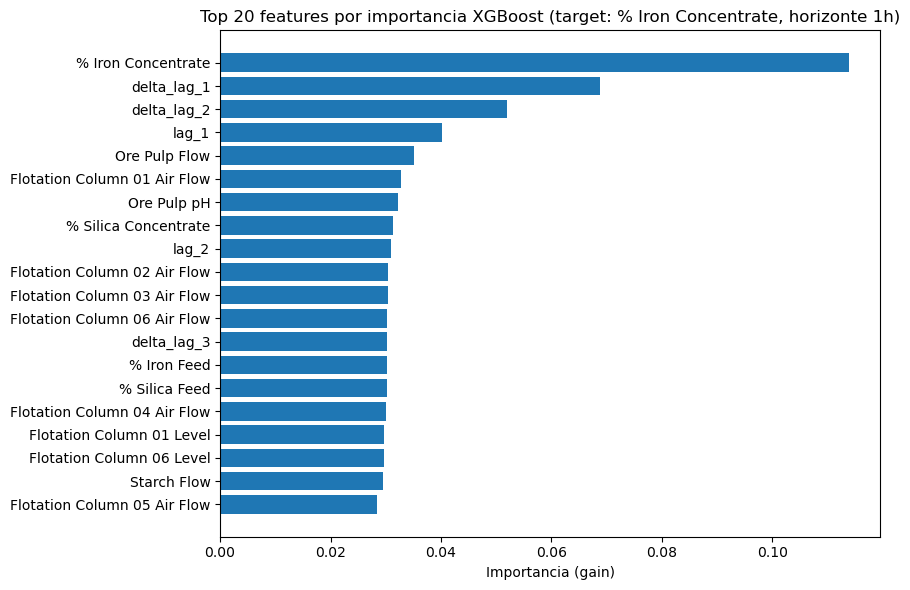

In [14]:
TOP_N = 20
top_features = importance_df.head(TOP_N).iloc[::-1]  # invertido para que el barh salga de mayor a menor arriba

plt.figure(figsize=(9, 6))
plt.barh(top_features['feature'], top_features['gain_importance'], color='#1f77b4')
plt.xlabel('Importancia (gain)')
plt.title(f'Top {TOP_N} features por importancia XGBoost (target: {TARGET}, horizonte {XGB_HORIZON}h)')
plt.tight_layout()
plt.show()

## Ventanas deslizantes, modelo, entrenamiento y evaluacion (parametrizados)

Todo lo de aqui hasta el final se organiza como funciones que reciben `CONFIG`,
para poder llamarlas repetidamente con distintas combinaciones de
hiperparametros sin copiar y pegar celdas.

**Target diferenciado.** El modelo predice el *cambio* respecto a la hora
actual (`TARGET_delta = y[t+horizon] - y[t]`), no el nivel absoluto.
Prediciendo el nivel, el modelo tiene que reconstruir una identidad
(`salida ~= entrada`) y gasta ahi toda su capacidad: se queda corto en los
extremos (desviacion tipica de la prediccion = 0.61 x la real) y el skill sale
negativo. Prediciendo el delta, cada prediccion queda anclada al valor real
actual, hereda el rango dinamico real (~0.9 x) y el skill pasa a positivo.
Ademas el baseline naive es exactamente `delta = 0`, así que el modelo parte de
la solucion naive y solo se aleja si encuentra senal real.

**Features de retardo (`lags`).** Ademas del valor actual `y[t]`, se anaden
valores pasados del target (`lag_L = y[t-L]`) y sus diferencias
(`delta_lag_L = y[t] - y[t-L]`). Es lo que mas mejora el resultado: pasa el
skill de ~+0.039 a ~+0.063. La razon es que para estimar hacia donde va la
serie no basta con saber donde esta, hace falta su *trayectoria* reciente --
las features mas importantes acaban siendo `delta_lag_1` y `delta_lag_2`.

> **Nota honesta sobre las variables de proceso:** usando solo el target y sus
> retardos (sin ninguna de las 19 senales de flotacion) el skill es +0.0622,
> practicamente igual que el modelo completo (+0.0626). Es decir, casi toda la
> ganancia viene de la estructura temporal del propio target, no de las
> variables de proceso. Conviene tenerlo presente antes de interpretar la
> importancia de features como si el proceso estuviera explicando la silice.

Todas las metricas y graficas se calculan **en unidades absolutas**
(`y[t] + delta_predicho`), comparables con la persistencia.

In [15]:
class SequenceDataset(Dataset):
    def __init__(self, X, y, seq_len):
        self.X = torch.as_tensor(X, dtype=torch.float32)
        self.y = torch.as_tensor(y, dtype=torch.float32)
        self.seq_len = seq_len

    def __len__(self):
        return len(self.X) - self.seq_len

    def __getitem__(self, idx):
        x_seq = self.X[idx: idx + self.seq_len]
        y_target = self.y[idx + self.seq_len]
        return x_seq, y_target


def add_lag_features(df_local, target_col, lags):
    """Anade, para cada L en `lags`, el valor pasado del target (`lag_L`) y su
    diferencia respecto al actual (`delta_lag_L`). Todo mira hacia atras, así
    que es utilizable en tiempo real."""
    for L in lags:
        df_local[f'lag_{L}'] = df_local[target_col].shift(L)
        df_local[f'delta_lag_{L}'] = df_local[target_col] - df_local[target_col].shift(L)
    return df_local


def build_supervised(config):
    """Construye el DataFrame supervisado (target diferenciado + lags) y la
    lista de features. Compartido por el LSTM y por XGBoost para que ambos vean
    exactamente las mismas columnas."""
    target_col = config['target_col']
    horizon = config['horizon']
    lags = config.get('lags', ())

    df_local = df.copy()
    df_local['TARGET_fwd'] = df_local[target_col].shift(-horizon)
    df_local['TARGET_delta'] = df_local['TARGET_fwd'] - df_local[target_col]
    df_local = add_lag_features(df_local, target_col, lags)
    df_local = df_local.dropna().copy()

    # El valor ACTUAL del target (target_col) SE MANTIENE como feature.
    # No es fuga: y[t] ya se conoce en el instante de predecir y[t+horizon], y es
    # justamente la base del baseline naive. Quitarlo deja al modelo prediciendo
    # el delta a ciegas -> aprende Delta ~ 0 y el skill cae a ~0 (comprobado:
    # -0.001 sin target/lags vs +0.005 con ellos).
    # Solo se excluyen las columnas derivadas del FUTURO (TARGET_fwd /
    # TARGET_delta), que si serian fuga, y EXCLUDED_FEATURES.
    excluded = ['TARGET_fwd', 'TARGET_delta'] + EXCLUDED_FEATURES
    feature_cols = [c for c in df_local.columns if c not in excluded]

    # Poda opcional de sensores redundantes (ver seccion de colinealidad).
    # PROTECTED nunca se poda: el target y sus retardos son la senal principal.
    if PRUNE_THRESHOLD is not None:
        protected = [target_col] + [f'lag_{L}' for L in lags] + [f'delta_lag_{L}' for L in lags]
        candidates = [c for c in feature_cols if c not in protected]
        kept, _ = prune_correlated(candidates, PRUNE_THRESHOLD, df_local, 'TARGET_delta')
        feature_cols = [c for c in feature_cols if c in protected or c in kept]

    return df_local, feature_cols


def prepare_data(config):
    """Split cronologico + escalado + ventanas deslizantes para el LSTM.
    Devuelve tambien y_now / y_fwd por split para reconstruir la prediccion en
    unidades absolutas: y_hat[t+horizon] = y[t] + delta_predicho."""
    target_col = config['target_col']

    df_local, feature_cols = build_supervised(config)

    X_raw = df_local[feature_cols].values
    y_raw = df_local[['TARGET_delta']].values
    y_now_all = df_local[target_col].values
    y_fwd_all = df_local['TARGET_fwd'].values

    n = len(df_local)
    train_end = int(n * 0.70)
    val_end = int(n * 0.85)

    # Se probo escalado min-max [0,1] (estilo Pu et al. 2020, ajustado sobre
    # toda la serie) y colapsa el LSTM: el delta target tiene unos pocos
    # saltos raros (|delta|~3-4) que estiran el rango, dejando el 75% de los
    # valores tipicos aplastados en [0.4, 0.6] -- casi sin gradiente util para
    # MSE. skill caia de +0.070 a +0.006 en test, std_ratio de ~0.80 a ~0.12.
    # StandardScaler (ajustado solo con train, como aqui) no tiene ese problema
    # porque escala segun la dispersion real, no segun los extremos.
    scaler_X = StandardScaler()
    X_train = scaler_X.fit_transform(X_raw[:train_end])
    X_val   = scaler_X.transform(X_raw[train_end:val_end])
    X_test  = scaler_X.transform(X_raw[val_end:])

    scaler_y = StandardScaler()
    y_train = scaler_y.fit_transform(y_raw[:train_end])
    y_val   = scaler_y.transform(y_raw[train_end:val_end])
    y_test  = scaler_y.transform(y_raw[val_end:])

    seq_len = config['seq_len']
    batch_size = config['batch_size']

    train_ds = SequenceDataset(X_train, y_train, seq_len)
    val_ds   = SequenceDataset(X_val,   y_val,   seq_len)
    test_ds  = SequenceDataset(X_test,  y_test,  seq_len)

    loaders = {
        'train': DataLoader(train_ds, batch_size=batch_size, shuffle=True),
        'val': DataLoader(val_ds, batch_size=batch_size, shuffle=False),
        'test': DataLoader(test_ds, batch_size=batch_size, shuffle=False),
        'train_eval': DataLoader(train_ds, batch_size=batch_size, shuffle=False),
    }

    splits = {'train': (0, train_end), 'val': (train_end, val_end), 'test': (val_end, n)}
    y_now = {k: y_now_all[a:b][seq_len:] for k, (a, b) in splits.items()}
    y_fwd = {k: y_fwd_all[a:b][seq_len:] for k, (a, b) in splits.items()}
    print(f"Feature cols {feature_cols}")
    return {
        'df_local': df_local,
        'feature_cols': feature_cols,
        'n_features': X_train.shape[1],
        'scaler_y': scaler_y,
        'loaders': loaders,
        'y_now': y_now,
        'y_fwd': y_fwd,
        'train_end': train_end,
        'val_end': val_end,
    }

### Modelo

LSTM seguido de una pequena cabeza densa. A diferencia del notebook de
manufactura (donde el target diferenciado hacia que "no cambiar" fuera la
solucion naive de partida, y por eso la capa final se inicializaba a cero),
aqui el target es el nivel absoluto: la solucion naive (`y_hat = y[t]`) no es
un punto natural de inicializacion de los pesos, así que se usa inicializacion
estandar de PyTorch.

In [16]:
class LSTMRegressor(nn.Module):
    def __init__(self, n_features, hidden_size=32, num_layers=1, dropout=0.3):
        super().__init__()
        self.lstm = nn.LSTM(
            input_size=n_features,
            hidden_size=hidden_size,
            num_layers=num_layers,
            batch_first=True,
            dropout=dropout if num_layers > 1 else 0.0,
        )
        # self.fc = nn.Linear(1, 1)
        self.head = nn.Sequential(
            nn.Linear(hidden_size, hidden_size // 2),
            nn.ReLU(),
            nn.Dropout(dropout),
            nn.Linear(hidden_size // 2, 1),
        )

    def forward(self, x):
        out, (h_n, c_n) = self.lstm(x)
        last_hidden = out[:, -1, :]
        return self.head(last_hidden)


def build_model(config, n_features, device):
    return LSTMRegressor(
        n_features=n_features,
        hidden_size=config['hidden_size'],
        num_layers=config['num_layers'],
        dropout=config['dropout'],
    ).to(device)

### Entrenamiento (early stopping sobre val loss)

In [17]:
def run_epoch(loader, model, criterion, device, optimizer=None):
    is_train = optimizer is not None
    model.train() if is_train else model.eval()
    total_loss, n_samples = 0.0, 0
    with torch.set_grad_enabled(is_train):
        for xb, yb in loader:
            xb, yb = xb.to(device), yb.to(device)
            preds = model(xb)
            loss = criterion(preds, yb)
            if is_train:
                optimizer.zero_grad()
                loss.backward()
                optimizer.step()
            total_loss += loss.item() * xb.size(0)
            n_samples += xb.size(0)
    return total_loss / n_samples


def train_model(config, model, loaders, device, verbose=True):
    criterion = nn.MSELoss()
    optimizer = torch.optim.Adam(model.parameters(), lr=config['lr'], weight_decay=config['weight_decay'])
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=3)

    train_losses, val_losses = [], []
    best_val_loss = float('inf')
    best_state = None
    epochs_no_improve = 0

    for epoch in range(1, config['n_epochs'] + 1):
        train_loss = run_epoch(loaders['train'], model, criterion, device, optimizer)
        val_loss = run_epoch(loaders['val'], model, criterion, device, optimizer=None)
        scheduler.step(val_loss)

        train_losses.append(train_loss)
        val_losses.append(val_loss)

        improved = val_loss < best_val_loss
        if improved:
            best_val_loss = val_loss
            best_state = copy.deepcopy(model.state_dict())
            epochs_no_improve = 0
        else:
            epochs_no_improve += 1

        if verbose:
            marker = " *" if improved else ""
            print(f"Epoch {epoch:3d} | train_loss={train_loss:.5f} | val_loss={val_loss:.5f}{marker}")

        if epochs_no_improve >= config['patience']:
            if verbose:
                print(f"Early stopping en epoch {epoch} (sin mejora en {config['patience']} epocas).")
            break

    model.load_state_dict(best_state)
    return model, {'train_losses': train_losses, 'val_losses': val_losses, 'best_val_loss': best_val_loss}

In [18]:
def plot_loss_curve(history, title='Curva de aprendizaje'):
    train_losses, val_losses = history['train_losses'], history['val_losses']
    plt.figure(figsize=(10, 4))
    plt.plot(train_losses, label='Train loss', linewidth=1.8)
    plt.plot(val_losses, label='Val loss', linewidth=1.8)
    best_epoch = int(np.argmin(val_losses))
    plt.axvline(best_epoch, color='gray', linestyle='--', alpha=0.6, label=f'Mejor epoca ({best_epoch+1})')
    plt.xlabel('Epoch')
    plt.ylabel('MSE (escala estandarizada)')
    plt.title(title)
    plt.legend()
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.tight_layout()
    plt.show()

### Prediccion, baseline naive y metricas

Baseline naive: persistencia -- predecir que `% Silica Concentrate` no cambia
en `horizon` horas (`y_hat[t] = y[t]`).

In [19]:
@torch.no_grad()
def predict(loader, model, device):
    model.eval()
    preds, trues = [], []
    for xb, yb in loader:
        out = model(xb.to(device)).cpu().numpy()
        preds.append(out)
        trues.append(yb.numpy())
    return np.concatenate(preds), np.concatenate(trues)


def mape(y_true, y_pred, eps=1e-6):
    return np.mean(np.abs((y_true - y_pred) / (np.abs(y_true) + eps))) * 100


def compute_metrics(y_true, y_pred):
    return {
        'RMSE': np.sqrt(mean_squared_error(y_true, y_pred)),
        'MAE': mean_absolute_error(y_true, y_pred),
        'MAPE': mape(y_true, y_pred),
        'R2': r2_score(y_true, y_pred),
    }


def evaluate(config, model, data, device):
    """Genera predicciones LSTM/naive en las 3 particiones y devuelve (a) el dict
    'results' con series completas (para graficar) y (b) un dict plano de
    metricas listo para convertir en fila de CSV.

    El modelo predice el delta; aqui se reconstruye la prediccion en unidades
    absolutas (y[t] + delta) para que todas las metricas y graficas esten en
    `% Silica Concentrate` y sean comparables con la persistencia. El baseline
    naive es delta = 0, es decir y_hat[t+horizon] = y[t].
    """
    loaders = data['loaders']
    scaler_y = data['scaler_y']

    pred_scaled = {
        'train': predict(loaders['train_eval'], model, device)[0],
        'val':   predict(loaders['val'], model, device)[0],
        'test':  predict(loaders['test'], model, device)[0],
    }

    def inv(y_scaled):
        return scaler_y.inverse_transform(y_scaled.reshape(-1, 1)).ravel()

    results = {}
    for split in ['train', 'val', 'test']:
        y_now = data['y_now'][split]
        delta_pred = inv(pred_scaled[split])
        results[split] = {
            'y_true': data['y_fwd'][split],        # y[t+horizon] real, absoluto
            'lstm': y_now + delta_pred,            # y[t] + delta predicho
            'naive': y_now,                        # persistencia == delta 0
            'delta_pred': delta_pred,
        }

    flat_metrics = {}
    for split in ['train', 'val', 'test']:
        y_true = results[split]['y_true']
        for model_name in ['lstm', 'naive']:
            m = compute_metrics(y_true, results[split][model_name])
            for metric_name, value in m.items():
                flat_metrics[f'{split}_{model_name}_{metric_name}'] = value
        rmse_lstm = flat_metrics[f'{split}_lstm_RMSE']
        rmse_naive = flat_metrics[f'{split}_naive_RMSE']
        flat_metrics[f'{split}_skill'] = 1 - rmse_lstm / rmse_naive if rmse_naive != 0 else float('nan')
        # Cuanto del rango dinamico real reproduce el modelo (1.0 = igual que el
        # real; <1 = conservador, se queda corto en los extremos).
        std_true = y_true.std()
        flat_metrics[f'{split}_std_ratio'] = results[split]['lstm'].std() / std_true if std_true != 0 else float('nan')

    return results, flat_metrics

### Prediccion vs real (test)

In [20]:
def plot_test_predictions(config, data, results, target_col=None):
    target_col = target_col or config['target_col']
    df_local = data['df_local']
    seq_len = config['seq_len']
    test_timestamps = df_local.index[data['val_end']:][seq_len:]

    y_true = results['test']['y_true']
    y_lstm = results['test']['lstm']
    y_naive = results['test']['naive']

    fig, (ax, ax2) = plt.subplots(
        1, 2, figsize=(17, 5), gridspec_kw={'width_ratios': [2.6, 1]})

    ax.plot(test_timestamps, y_true, label='Real', color='black', linewidth=1.0, alpha=0.8)
    ax.plot(test_timestamps, y_lstm, label='LSTM', color='#1f77b4', linewidth=0.9, alpha=0.8)
    ax.plot(test_timestamps, y_naive, label='Naive', color='#ff7f0e', linewidth=0.9, alpha=0.6)
    ax.set_title(f"Test set -- {target_col} ({config['horizon']}h vista)", loc='left', fontweight='bold')
    ax.set_ylabel(target_col)
    ax.legend()
    ax.grid(True, linestyle='--', alpha=0.5)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

    # Real vs predicho: revela directamente si el modelo se queda corto en los
    # extremos (los puntos se aplanarian hacia la horizontal en vez de seguir
    # la diagonal y=x).
    lims = [min(y_true.min(), y_lstm.min()), max(y_true.max(), y_lstm.max())]
    ax2.scatter(y_true, y_lstm, s=8, alpha=0.35, color='#1f77b4', edgecolors='none')
    ax2.plot(lims, lims, color='black', linewidth=1.0, linestyle='--', label='y = x (ideal)')
    ax2.set_xlabel(f'Real')
    ax2.set_ylabel('Prediccion LSTM')
    std_ratio = y_lstm.std() / y_true.std() if y_true.std() != 0 else float('nan')
    ax2.set_title(f'Real vs predicho  (std ratio = {std_ratio:.2f})', loc='left', fontweight='bold')
    ax2.legend(fontsize=8)
    ax2.grid(True, linestyle='--', alpha=0.5)
    ax2.spines['top'].set_visible(False)
    ax2.spines['right'].set_visible(False)

    plt.tight_layout()
    plt.show()

## Registro de experimentos

`run_experiment(config)` ata todo el pipeline (datos -> modelo -> entrenamiento
-> evaluacion) y, si `log=True`, guarda una fila en `experiments_mining.csv` con
la configuracion completa (columnas `cfg_*`) y las metricas resultantes
(columnas `train_*`, `val_*`, `test_*`, `*_skill`). Antes de entrenar comprueba
si esa combinacion exacta de hiperparametros ya esta en el log (via un hash de
la configuracion) para no repetir entrenamientos por accidente -- si ya existe,
avisa y no reentrena salvo que se pida explicitamente con `force=True`.

In [21]:
def run_experiment(config, log=True, force=False, verbose=True, plot=True):
    """Entrena y evalua una configuracion. Devuelve (metrics_row, model, data, results).

    - Si `log=True`, comprueba primero si la configuracion ya esta en
      experiments_mining.csv (por hash exacto de todos los hiperparametros). Si
      ya existe y `force=False`, no reentrena: devuelve la fila ya guardada y
      avisa por pantalla.
    - Si `log=True` y es una configuracion nueva (o `force=True`), entrena,
      evalua, y anade una fila nueva al CSV.
    """
    existing_log = load_experiments_log()
    cfg_hash = config_hash(config)

    if log and not force and config_already_tried(config, existing_log):
        print(f"Esta configuracion ya se probo (hash={cfg_hash}). "
              f"Usa force=True para reentrenar de todas formas.")
        prev_row = existing_log[existing_log['config_hash'] == cfg_hash].iloc[0]
        return prev_row, None, None, None

    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

    data = prepare_data(config)
    model = build_model(config, data['n_features'], device)
    model, history = train_model(config, model, data['loaders'], device, verbose=verbose)
    results, flat_metrics = evaluate(config, model, data, device)

    if plot:
        plot_loss_curve(history, title=f"Curva de aprendizaje (hash={cfg_hash})")
        plot_test_predictions(config, data, results)

    row = {'config_hash': cfg_hash, 'n_features': data['n_features']}
    row.update({f'cfg_{k}': v for k, v in config.items()})
    row.update(flat_metrics)
    row['best_val_loss'] = history['best_val_loss']

    if log:
        log_df = pd.concat([existing_log, pd.DataFrame([row])], ignore_index=True)
        log_df.to_csv(EXPERIMENTS_CSV, index=False)
        print(f"Guardado en {EXPERIMENTS_CSV} (hash={cfg_hash}).")

    return pd.Series(row), model, data, results

## Probar configuraciones

`run_experiment` entrena una combinacion, la evalua, y (si no se probo antes)
la anade a `experiments_mining.csv`. Se llama una vez por target (silica y
hierro) con la MISMA configuracion base -- solo cambia `target_col` -- para
que ambos sean comparables en igualdad de condiciones. `run_experiment` detecta
por hash si una combinacion exacta ya se probo y no la reentrena salvo que se
pida `force=True`.



=== Entrenando target: % Silica Concentrate ===
Feature cols ['Starch Flow', 'Amina Flow', 'Ore Pulp Flow', 'Ore Pulp pH', 'Ore Pulp Density', 'Flotation Column 01 Air Flow', 'Flotation Column 02 Air Flow', 'Flotation Column 03 Air Flow', 'Flotation Column 04 Air Flow', 'Flotation Column 05 Air Flow', 'Flotation Column 06 Air Flow', 'Flotation Column 07 Air Flow', 'Flotation Column 01 Level', 'Flotation Column 02 Level', 'Flotation Column 03 Level', 'Flotation Column 04 Level', 'Flotation Column 05 Level', 'Flotation Column 06 Level', 'Flotation Column 07 Level', '% Iron Feed', '% Silica Feed', '% Iron Concentrate', '% Silica Concentrate', 'lag_1', 'delta_lag_1', 'lag_2', 'delta_lag_2', 'lag_3', 'delta_lag_3']
Epoch   1 | train_loss=0.97704 | val_loss=0.77385 *
Epoch   2 | train_loss=0.97944 | val_loss=0.77785
Epoch   3 | train_loss=0.96857 | val_loss=0.77067 *
Epoch   4 | train_loss=0.96005 | val_loss=0.76867 *
Epoch   5 | train_loss=0.97047 | val_loss=0.77672
Epoch   6 | train_loss=

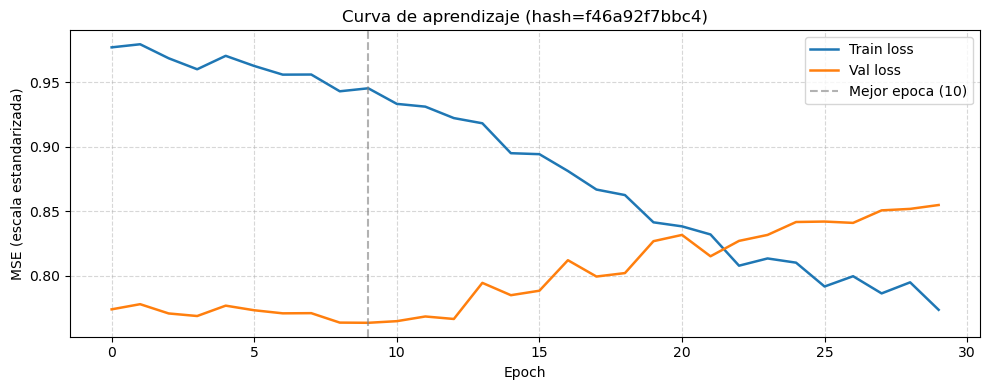

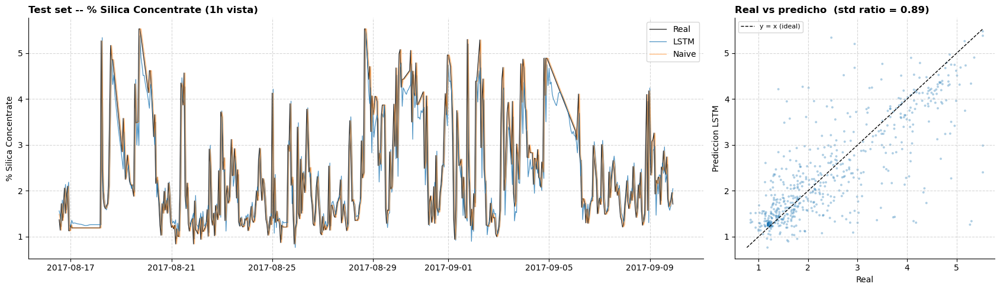

Guardado en experiments_mining.csv (hash=f46a92f7bbc4).

=== Entrenando target: % Iron Concentrate ===
Feature cols ['Starch Flow', 'Amina Flow', 'Ore Pulp Flow', 'Ore Pulp pH', 'Ore Pulp Density', 'Flotation Column 01 Air Flow', 'Flotation Column 02 Air Flow', 'Flotation Column 03 Air Flow', 'Flotation Column 04 Air Flow', 'Flotation Column 05 Air Flow', 'Flotation Column 06 Air Flow', 'Flotation Column 07 Air Flow', 'Flotation Column 01 Level', 'Flotation Column 02 Level', 'Flotation Column 03 Level', 'Flotation Column 04 Level', 'Flotation Column 05 Level', 'Flotation Column 06 Level', 'Flotation Column 07 Level', '% Iron Feed', '% Silica Feed', '% Iron Concentrate', '% Silica Concentrate', 'lag_1', 'delta_lag_1', 'lag_2', 'delta_lag_2', 'lag_3', 'delta_lag_3']
Epoch   1 | train_loss=0.99503 | val_loss=0.81112 *
Epoch   2 | train_loss=0.98274 | val_loss=0.80960 *
Epoch   3 | train_loss=0.98190 | val_loss=0.80783 *
Epoch   4 | train_loss=0.98220 | val_loss=0.80182 *
Epoch   5 | train

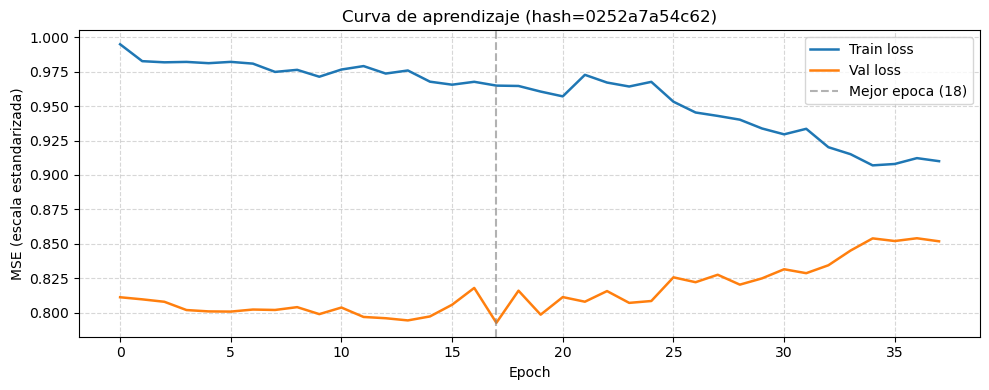

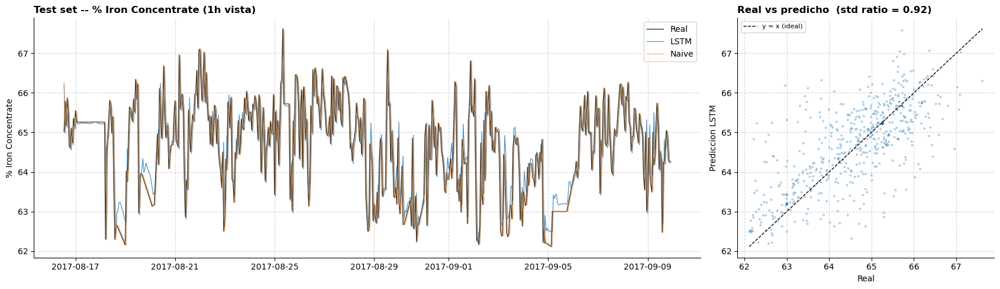

Guardado en experiments_mining.csv (hash=0252a7a54c62).


,config_hash,n_features,cfg_horizon,cfg_lags,cfg_seq_len,cfg_hidden_size,cfg_num_layers,cfg_dropout,cfg_lr,cfg_weight_decay,...,test_lstm_MAE,test_lstm_MAPE,test_lstm_R2,test_naive_RMSE,test_naive_MAE,test_naive_MAPE,test_naive_R2,test_skill,test_std_ratio,best_val_loss
% Silica Concentrate,f46a92f7bbc4,29,1,"[1, 2, 3]",6,30,2,0.3,0.01,0.0001,...,0.496596,21.347513,0.609312,0.75977,0.470307,20.633787,0.610753,-0.00185,0.890761,0.76342
% Iron Concentrate,0252a7a54c62,29,1,"[1, 2, 3]",6,30,2,0.3,0.01,0.0001,...,0.613604,0.951179,0.463725,0.839269,0.582167,0.900838,0.464339,-0.000572,0.918767,0.792552


In [22]:
# Configuracion base. Parametros que mas mueven el resultado, por orden:
#   1. 'lags'      -- retardos del target. Lo que mas sube el skill.
#   2. 'seq_len'   -- horas de historia que ve el LSTM en cada ventana.
#   3. 'dropout' / 'weight_decay' -- con ~3900 filas el sobreajuste llega rapido.
#   4. 'hidden_size' / 'num_layers' -- subirlos casi nunca ayuda aqui.
#
# OJO: sin 'lags' el LSTM se queda sin la trayectoria reciente del target y el
# skill cae a ~0 (predice Delta ~ 0, es decir persistencia pura). Si ves
# std_ratio ~ 1.000 y skill ~ 0.0000, es exactamente eso lo que esta pasando.
# Por eso aqui se deja activado (a diferencia de una version anterior de esta
# celda que lo tenia comentado para probar el caso sin retardos).
#
# Se entrena la MISMA configuracion para los dos targets (silica y hierro):
# solo cambia 'target_col', así que ambos ven exactamente el mismo pipeline
# (features, split, escalado, arquitectura) y son comparables entre si. Con
# EXCLUDED_FEATURES=[] y PRUNE_THRESHOLD=None (ver secciones de arriba), cada
# uno ve TODAS las variables disponibles, incluida la salida hermana y las dos
# columnas de laboratorio del alimento.
BASE_CONFIG = {
    'horizon': HORIZON,
    'lags': [1, 2, 3],
    'seq_len': 6,
    'hidden_size': 30,
    'num_layers': 2,
    'dropout': 0.3,
    'lr': 1e-2,
    'weight_decay': 1e-4,
    'batch_size': 64,
    'n_epochs': 50,
    'patience': 20,
}

TARGETS_TO_RUN = ['% Silica Concentrate', '% Iron Concentrate']

experiments = {}
for _target_col in TARGETS_TO_RUN:
    _cfg = {**BASE_CONFIG, 'target_col': _target_col}
    print(f"\n=== Entrenando target: {_target_col} ===")
    _row, _model, _data, _results = run_experiment(_cfg, force=True)
    experiments[_target_col] = {
        'config': _cfg, 'row': _row, 'model': _model, 'data': _data, 'results': _results,
    }

# Compatibilidad con las celdas de mas abajo que antes usaban un unico
# CONFIG/row/model/data/results (se quedan apuntando al primer target de
# TARGETS_TO_RUN; las celdas de visualizacion iteran `experiments` para
# mostrar silica y hierro juntos).
CONFIG = experiments[TARGETS_TO_RUN[0]]['config']
row = experiments[TARGETS_TO_RUN[0]]['row']
model = experiments[TARGETS_TO_RUN[0]]['model']
data = experiments[TARGETS_TO_RUN[0]]['data']
results = experiments[TARGETS_TO_RUN[0]]['results']

pd.DataFrame({t: e['row'] for t, e in experiments.items()}).T


## Real vs predicho: LSTM y persistencia, lado a lado (silica y hierro)

Mismo estilo que la Fig. 9 del paper de Pu et al. (2020) que entrena un LSTM
apilado sobre este mismo dataset: dispersion de valores reales (eje X) contra
predichos (eje Y), con la diagonal `y = x` como referencia de prediccion
perfecta. Se anade el panel de persistencia (naive) que el paper no muestra,
para dejar claro cuanto del ajuste visual del LSTM viene solo de "copiar"
y[t] -> y[t+1]. Una fila por target (silica y hierro), para poder comparar
ambos de un vistazo.


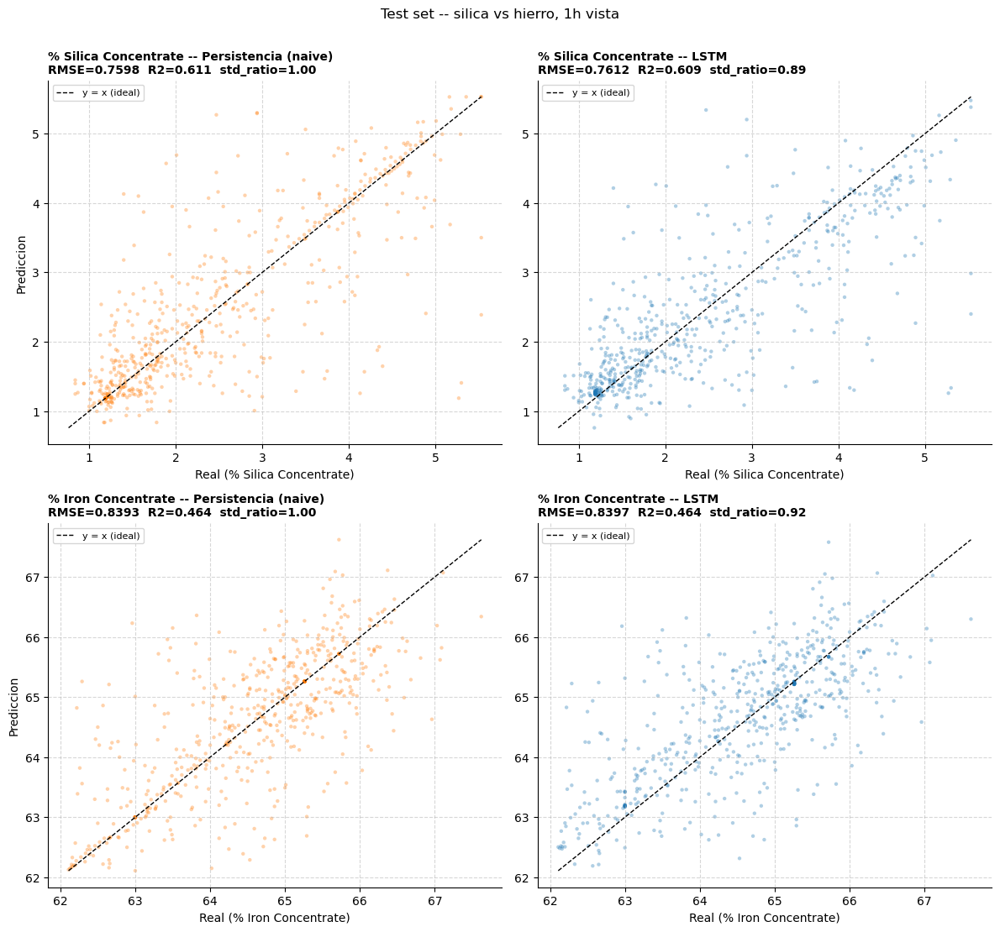

In [23]:
n_targets = len(experiments)
fig, axes = plt.subplots(n_targets, 2, figsize=(12, 5.5 * n_targets), sharex=False, sharey=False, squeeze=False)

for row_idx, (target_col, exp) in enumerate(experiments.items()):
    res = exp['results']
    y_true = res['test']['y_true']
    y_naive = res['test']['naive']
    y_lstm = res['test']['lstm']

    lims = [min(y_true.min(), y_naive.min(), y_lstm.min()),
            max(y_true.max(), y_naive.max(), y_lstm.max())]

    for col_idx, (y_pred, label, color) in enumerate([
        (y_naive, 'Persistencia (naive)', '#ff7f0e'),
        (y_lstm, 'LSTM', '#1f77b4'),
    ]):
        ax = axes[row_idx][col_idx]
        ax.scatter(y_true, y_pred, s=10, alpha=0.35, color=color, edgecolors='none')
        ax.plot(lims, lims, color='black', linewidth=1.0, linestyle='--', label='y = x (ideal)')
        rmse = np.sqrt(mean_squared_error(y_true, y_pred))
        r2 = r2_score(y_true, y_pred)
        std_ratio = y_pred.std() / y_true.std() if y_true.std() != 0 else float('nan')
        title = f'{target_col} -- {label}' + chr(10) + f'RMSE={rmse:.4f}  R2={r2:.3f}  std_ratio={std_ratio:.2f}'
        ax.set_title(title, loc='left', fontweight='bold', fontsize=10)
        ax.set_xlabel(f'Real ({target_col})')
        ax.legend(fontsize=8)
        ax.grid(True, linestyle='--', alpha=0.5)
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
    axes[row_idx][0].set_ylabel('Prediccion')

plt.suptitle(f"Test set -- silica vs hierro, {BASE_CONFIG['horizon']}h vista", y=1.005)
plt.tight_layout()
plt.show()


## Comparar todos los experimentos probados hasta ahora

Lee `experiments_mining.csv` completo y muestra las configuraciones ordenadas
por skill de test (de mejor a peor).

In [24]:
log_df = load_experiments_log()

cfg_cols = [c for c in log_df.columns if c.startswith('cfg_')]
summary_cols = cfg_cols + ['best_val_loss', 'train_skill', 'val_skill', 'test_skill',
                            'test_lstm_RMSE', 'test_naive_RMSE', 'test_std_ratio']
summary_cols = [c for c in summary_cols if c in log_df.columns]

summary = log_df[summary_cols].sort_values('test_skill', ascending=False)

if 'cfg_target_col' in summary.columns:
    print("Mejor configuracion probada hasta ahora, por target:")
    best_per_target = summary.sort_values('test_skill', ascending=False).groupby('cfg_target_col').head(1)
    print(best_per_target[['cfg_target_col', 'test_skill', 'test_lstm_RMSE', 'test_naive_RMSE']].to_string(index=False))
    print()

summary


Mejor configuracion probada hasta ahora, por target:
      cfg_target_col  test_skill  test_lstm_RMSE  test_naive_RMSE
  % Iron Concentrate    0.009781        0.831060         0.839269
% Silica Concentrate    0.002360        0.757977         0.759770



,cfg_horizon,cfg_lags,cfg_seq_len,cfg_hidden_size,cfg_num_layers,cfg_dropout,cfg_lr,cfg_weight_decay,cfg_batch_size,cfg_n_epochs,cfg_patience,cfg_target_col,best_val_loss,train_skill,val_skill,test_skill,test_lstm_RMSE,test_naive_RMSE,test_std_ratio
1,1,"[1, 2, 3]",6,30,2,0.3,0.01,0.0001,64,50,20,% Iron Concentrate,0.798523,0.012217,0.011852,0.009781,0.831060,0.839269,0.942523
0,1,"[1, 2, 3]",6,30,2,0.3,0.01,0.0001,64,50,20,% Silica Concentrate,0.763561,0.024773,0.018242,0.002360,0.757977,0.759770,0.903642
3,1,"[1, 2, 3]",6,30,2,0.3,0.01,0.0001,64,50,20,% Iron Concentrate,0.792552,0.022820,0.015553,-0.000572,0.839749,0.839269,0.918767
2,1,"[1, 2, 3]",6,30,2,0.3,0.01,0.0001,64,50,20,% Silica Concentrate,0.763420,0.034518,0.018333,-0.001850,0.761175,0.759770,0.890761


## Grafica en escala DELTA: lo que el modelo realmente aprende (silica y hierro)

La grafica en valor absoluto engana: como `y_hat = y[t] + delta` y el delta es
pequeno, la curva azul acaba siendo casi una copia de la negra desplazada una
hora. Se ve muy bien, pero eso es merito del **ancla** `y[t]`, no del modelo.

En **escala delta** el ancla desaparece y queda solo lo aprendido. La clave es
que aqui **el baseline naive es una linea plana en cero** (persistencia =
"no va a cambiar nada"). Entonces:

- si la prediccion se pega a cero -> el modelo no aporta nada sobre persistencia;
- si sigue al delta real -> esta anticipando cambios de verdad.

Es el grafico honesto para juzgar este modelo, y el que conviene mirar antes de
presentar resultados a nadie. Se genera una vez por target (silica y hierro)
usando los modelos ya entrenados en `experiments`.



=== % Silica Concentrate ===


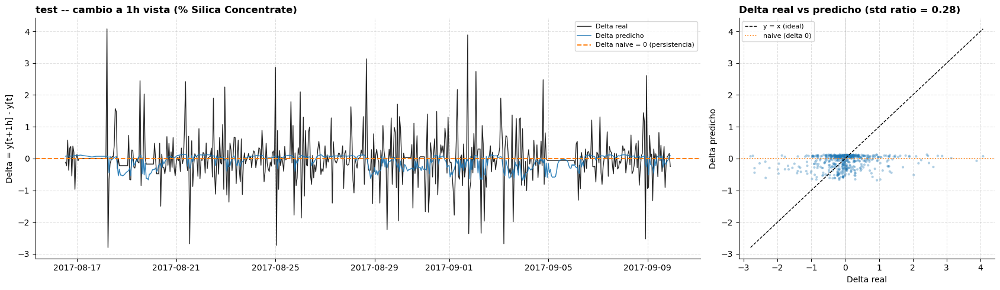

--- escala delta (test, % Silica Concentrate) ---
  std delta real     : 0.7598
  std delta predicho : 0.2114   (ratio 0.278)
  std delta naive    : 0.0000  (linea plana en cero)
  corr(pred, real)   : +0.1552
  R2 sobre el delta  : -0.0037
  RMSE modelo/naive  : 0.7612 / 0.7598   -> skill -0.0018
  acierto de signo   : 58.2%   (azar = 50%)

=== % Iron Concentrate ===


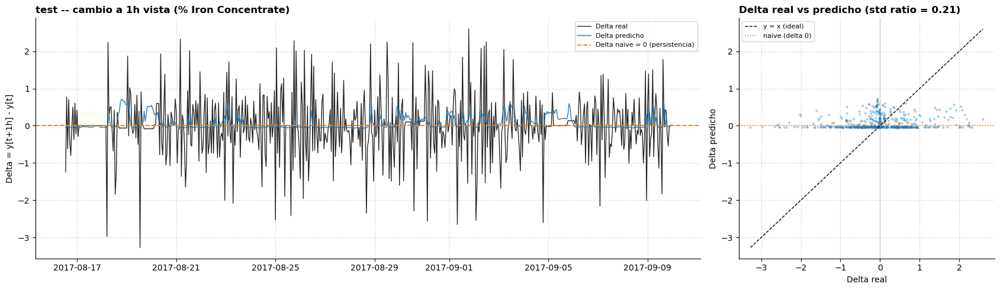

--- escala delta (test, % Iron Concentrate) ---
  std delta real     : 0.8393
  std delta predicho : 0.1731   (ratio 0.206)
  std delta naive    : 0.0000  (linea plana en cero)
  corr(pred, real)   : +0.1186
  R2 sobre el delta  : -0.0012
  RMSE modelo/naive  : 0.8397 / 0.8393   -> skill -0.0006
  acierto de signo   : 51.9%   (azar = 50%)


In [25]:
def _corr_delta(a, b):
    """Correlacion sin np.corrcoef (bloqueado por BLAS en este entorno)."""
    a = np.asarray(a, float) - np.asarray(a, float).mean()
    b = np.asarray(b, float) - np.asarray(b, float).mean()
    den = np.sqrt((a * a).sum() * (b * b).sum())
    return float((a * b).sum() / den) if den > 0 else float('nan')


def plot_delta_predictions(config, data, results, split='test', n_points=None):
    """Grafica en escala DELTA (lo que el modelo predice de verdad).

    Tres series:
      - delta REAL      = y[t+h] - y[t]
      - delta PREDICHO  = salida del modelo
      - delta NAIVE     = 0 (linea plana): persistencia

    Si el predicho se pega a la linea de cero, el modelo esta reproduciendo la
    persistencia y no aporta nada.
    """
    if data is None or results is None:
        raise ValueError(
            "data/results son None: run_experiment() no reentreno porque esta "
            "configuracion ya estaba en el log (devuelve la fila guardada pero no "
            "el modelo). Vuelve a lanzarla con force=True:\n"
            "    row, model, data, results = run_experiment(CONFIG, force=True)"
        )

    target_col = config['target_col']
    seq_len = config['seq_len']
    df_local = data['df_local']

    start = {'train': 0, 'val': data['train_end'], 'test': data['val_end']}[split]
    end = {'train': data['train_end'], 'val': data['val_end'], 'test': len(df_local)}[split]
    timestamps = df_local.index[start:end][seq_len:]

    delta_true = results[split]['y_true'] - results[split]['naive']
    delta_pred = results[split]['delta_pred']

    if n_points:                      # zoom opcional a las primeras n horas
        timestamps = timestamps[:n_points]
        delta_true = delta_true[:n_points]
        delta_pred = delta_pred[:n_points]

    fig, (ax, ax2) = plt.subplots(1, 2, figsize=(17, 5),
                                   gridspec_kw={'width_ratios': [2.6, 1]})

    ax.plot(timestamps, delta_true, label='Delta real', color='black',
            linewidth=1.0, alpha=0.85)
    ax.plot(timestamps, delta_pred, label='Delta predicho', color='#1f77b4',
            linewidth=1.1, alpha=0.9)
    ax.axhline(0, color='#ff7f0e', linestyle='--', linewidth=1.4,
               label='Delta naive = 0 (persistencia)')
    ax.set_title(f"{split} -- cambio a {config['horizon']}h vista ({target_col})",
                 loc='left', fontweight='bold')
    ax.set_ylabel(f"Delta = y[t+{config['horizon']}h] - y[t]")
    ax.legend(fontsize=8)
    ax.grid(True, linestyle='--', alpha=0.4)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

    ax2.scatter(delta_true, delta_pred, s=9, alpha=0.35, color='#1f77b4',
                edgecolors='none')
    lims = [min(delta_true.min(), delta_pred.min()),
            max(delta_true.max(), delta_pred.max())]
    ax2.plot(lims, lims, color='black', linestyle='--', linewidth=1.0, label='y = x (ideal)')
    ax2.axhline(0, color='#ff7f0e', linestyle=':', linewidth=1.2, label='naive (delta 0)')
    ax2.axvline(0, color='gray', linewidth=0.6, alpha=0.5)
    ax2.set_xlabel('Delta real')
    ax2.set_ylabel('Delta predicho')
    std_ratio = delta_pred.std() / delta_true.std() if delta_true.std() else float('nan')
    ax2.set_title(f'Delta real vs predicho (std ratio = {std_ratio:.2f})',
                  loc='left', fontweight='bold')
    ax2.legend(fontsize=8)
    ax2.grid(True, linestyle='--', alpha=0.4)
    ax2.spines['top'].set_visible(False)
    ax2.spines['right'].set_visible(False)

    plt.tight_layout()
    plt.show()

    # Metricas en escala delta: aqui el naive es exactamente 0.
    rmse_model = np.sqrt(mean_squared_error(delta_true, delta_pred))
    rmse_naive = np.sqrt(mean_squared_error(delta_true, np.zeros_like(delta_true)))
    sign_mask = delta_true != 0
    sign_acc = (np.sign(delta_pred[sign_mask]) == np.sign(delta_true[sign_mask])).mean()

    print(f"--- escala delta ({split}, {target_col}) ---")
    print(f"  std delta real     : {delta_true.std():.4f}")
    print(f"  std delta predicho : {delta_pred.std():.4f}   (ratio {std_ratio:.3f})")
    print(f"  std delta naive    : 0.0000  (linea plana en cero)")
    print(f"  corr(pred, real)   : {_corr_delta(delta_pred, delta_true):+.4f}")
    print(f"  R2 sobre el delta  : {r2_score(delta_true, delta_pred):+.4f}")
    print(f"  RMSE modelo/naive  : {rmse_model:.4f} / {rmse_naive:.4f}"
          f"   -> skill {1 - rmse_model / rmse_naive:+.4f}")
    print(f"  acierto de signo   : {sign_acc * 100:.1f}%   (azar = 50%)")


# Una grafica en escala delta por target (silica y hierro), reutilizando los
# modelos ya entrenados en `experiments` (ver la seccion "Probar
# configuraciones" mas arriba) -- no hace falta reentrenar aqui.
# Usa n_points para hacer zoom, p.ej. plot_delta_predictions(cfg, d, r, n_points=150)
for _target_col, _exp in experiments.items():
    print(f"\n=== {_target_col} ===")
    plot_delta_predictions(_exp['config'], _exp['data'], _exp['results'])


## Auditoria de datos congelados (valores repetidos mucho tiempo)

Sospecha razonable: `% Silica Feed` tiene muchas horas sin medida real, y al
interpolar/repetir el valor se estaria ensuciando la correlacion con el target.
Merece comprobarlo, porque si fuera cierto invalidaria las conclusiones
anteriores sobre esa variable.

**Lo que se encuentra:**

| Columna | tramos >=24h | horas congeladas | % |
|---|---|---|---|
| `% Silica Feed` | 13 | 1656 | **40.4%** |
| `% Iron Feed` | 13 | 1656 | **40.4%** |
| `Flotation Column 04/05 Air Flow` | 1 | 460 | 11.2% |
| resto de sensores de proceso | 0 | 0 | 0% |
| `% Silica Concentrate` (target) | 3 | 140 | 3.4% |

El caso mas llamativo: **792 horas seguidas (33 dias, 13-may -> 15-jun) con
`% Silica Feed` fijo en 6.26**. Hay otros tramos de 255h y 192h que caen en
julio-agosto, es decir **dentro de validacion y test**.

Es coherente con lo que dice el propio paper de referencia: la ley del alimento
se determina "por una muestra acumulada de ~14 horas". No es un fallo del
dataset, es que **esa variable se mide a otra cadencia**: cambia cada ~13.4h de
media, mientras el target cambia cada ~1.1h.

**Pero la hipotesis no se confirma.** Restringiendo a las horas con medida
nueva, la correlacion no mejora -- empeora un poco:

| Correlacion de `% Silica Feed` con el target | r |
|---|---|
| usando todas las horas | +0.084 |
| solo horas con medida NUEVA (289 horas) | +0.072 |
| excluyendo tramos congelados | +0.065 |

Igual con `% Iron Feed` (-0.087 -> -0.068 -> -0.045). O sea: la correlacion
debil **no es un artefacto** de repetir valores; la ley del alimento
sencillamente no explica la silice del concentrado hora a hora.

**Y quitar los tramos congelados tampoco ayuda al modelo:**

| Datos | filas | skill |
|---|---|---|
| todo (actual) | 3944 | **+0.0617** |
| sin tramos de air flow congelado | 3633 | +0.0588 |
| sin air flow ni feed congelados | 2025 | +0.0253 |

Quitar los congelados del feed se lleva por delante **casi la mitad del
dataset**, y con ~4000 filas perder datos cuesta mas de lo que aporta limpiar.
La conclusion practica es **dejarlos**, pero sabiendo que estan ahi.

> **Para el proyecto real esto sí es una leccion transferible:** conviene
> auditar por columna cuanto tiempo pasa cada senal sin cambiar de valor. Un
> sensor congelado 460 horas es un fallo de instrumentacion; una analitica
> congelada 13h es simplemente su cadencia real. Distinguir ambos casos evita
> tanto tirar datos buenos como confiar en datos que no existen.


In [26]:
def frozen_report(data, min_len=24):
    """Cuenta, por columna, cuantas horas caen dentro de un tramo con el mismo
    valor repetido >= min_len horas. Distingue sensores averiados de variables
    que simplemente se miden a otra cadencia."""
    rows = []
    for c in data.columns:
        s = data[c]
        groups = s.ne(s.shift()).cumsum()
        sizes = groups.map(groups.value_counts())
        frozen = sizes >= min_len
        n_blocks = groups[frozen].nunique()
        rows.append({
            'columna': c,
            f'tramos_>={min_len}h': n_blocks,
            'horas_congeladas': int(frozen.sum()),
            'pct': 100 * frozen.mean(),
            'cambia_cada_h': len(s) / max(s.ne(s.shift()).sum(), 1),
        })
    return (pd.DataFrame(rows).set_index('columna')
            .sort_values('horas_congeladas', ascending=False))


def frozen_mask(data, cols, min_len=24):
    """True en las horas que caen dentro de un tramo congelado de `cols`."""
    mask = pd.Series(False, index=data.index)
    for c in cols:
        s = data[c]
        groups = s.ne(s.shift()).cumsum()
        mask |= groups.map(groups.value_counts()) >= min_len
    return mask


report = frozen_report(df)
print(report.round(2).to_string())

# Tramos largos concretos de la ley de alimento (los mas problematicos).
print("\nTramos de % Silica Feed con el mismo valor >= 48h:")
_s = df['% Silica Feed']
_g = _s.ne(_s.shift()).cumsum()
for gid, cnt in _g.value_counts()[lambda x: x >= 48].sort_index().items():
    idx = _g[_g == gid].index
    print(f"  {idx.min()} -> {idx.max()}  ({cnt:4d}h)  valor={_s.loc[idx[0]]:.2f}")

_stale = frozen_mask(df, ['% Silica Feed', '% Iron Feed'])
_fresh = df['% Silica Feed'].ne(df['% Silica Feed'].shift())
print(f"\nHoras con medida NUEVA de feed: {_fresh.sum()} de {len(df)}")
print("Correlacion de % Silica Feed con el target:")
print(f"  todas las horas         : {corr_simple(df['% Silica Feed'], df[TARGET]):+.4f}")
print(f"  solo con medida nueva   : {corr_simple(df.loc[_fresh, '% Silica Feed'], df.loc[_fresh, TARGET]):+.4f}")
print(f"  excluyendo congelados   : {corr_simple(df.loc[~_stale, '% Silica Feed'], df.loc[~_stale, TARGET]):+.4f}")
print("\n-> La correlacion no mejora al usar solo medidas reales: la debilidad")
print("   no viene de repetir valores, viene de la variable en si.")


                              tramos_>=24h  horas_congeladas    pct  cambia_cada_h
columna                                                                           
% Silica Feed                            9              1542  39.06           4.56
% Iron Feed                              9              1542  39.06           4.56
Flotation Column 04 Air Flow             2               398  10.08           1.12
Flotation Column 05 Air Flow             1               311   7.88           1.09
% Iron Concentrate                       3               141   3.57           1.12
% Silica Concentrate                     3               140   3.55           1.12
Ore Pulp Flow                            2                70   1.77           1.17
Flotation Column 02 Level                0                 0   0.00           1.00
Flotation Column 07 Level                0                 0   0.00           1.01
Flotation Column 06 Level                0                 0   0.00           1.00
Flot

## Tiempo de residencia y lazo de control: por que el alimento "no se ve"

Objecion metalurgica correcta: en un proceso **continuo**, el mineral que entra
a la hora `t` no sale en el concentrado a la hora `t`, sino despues de atravesar
acondicionamiento, rougher y cleaner. Una correlacion baja a lag 0 no descarta
que exista relacion: puede estar desplazada en el tiempo.

### 1. Barrido de retardos (no basta)

Correlacionando `% Silica Feed` desplazado k horas contra el concentrado, el
maximo sale en **k=0** y decae suavemente. Pero este test es enganoso aqui: la
ley de alimento **esta congelada ~13h seguidas**, así que desplazarla 1-5h
apenas cambia los valores. Sobre una senal escalonada, un barrido de retardos no
puede resolver el tiempo de residencia.

### 2. Analisis por eventos (la forma correcta)

Mejor test: coger solo las **250 transiciones reales** en las que la ley de
alimento cambia de verdad (salto > 0.5 puntos) y mirar como responde el
concentrado en las horas siguientes.

| respuesta a h horas del salto | r |
|---|---|
| h = 0h | +0.045 |
| h = 1h | +0.066 |
| **h = 5h** | **-0.139**  <- maximo |
| h = 8h | -0.082 |
| h = 21h | -0.116 |

**Sí aparece una respuesta, y esta desplazada ~5 horas** -- consistente con un
tiempo de residencia del circuito. La objecion era acertada: a lag 0 no se ve,
por eventos sí.

### 3. Pero el signo es negativo, y eso delata el lazo de control

La respuesta a 5h es **negativa**: mas silice en el alimento va seguido de
*menos* silice en el concentrado. Fisicamente al reves de lo esperado... salvo
que la planta este compensando. Comprobado:

| variable operativa | r con el salto del feed |
|---|---|
| **`Starch Flow`** | **-0.183**  <- la mayor de todas |
| `Ore Pulp Density` | -0.080 |
| `Ore Pulp pH` | -0.054 |
| `Amina Flow` | -0.038 |

El almidon (depresor del hierro en flotacion inversa) **reacciona al cambio de
alimento con mas fuerza (-0.183) que el propio concentrado (-0.139)**. Es decir:
cuando cambia la ley de entrada, **los operadores ajustan la dosificacion**.

**Esta es la explicacion de fondo:** el trabajo de la planta es mantener la
calidad del concentrado *estable a pesar* de las variaciones del alimento. Si el
control funciona, el efecto del alimento sobre el concentrado queda en buena
parte **cancelado por diseno**. La relacion fisica existe, pero el lazo de
control la enmascara.

> Es un caso de **causalidad enmascarada por control**, clasico en datos de
> planta en operacion normal: las variables que mas se controlan son
> precisamente las que menos correlacion aparente muestran con el resultado.
> Por eso los datos observacionales de una planta bien operada son malos para
> estimar relaciones causa-efecto.

### 4. ¿Sirve para predecir mejor? No

| Features | skill |
|---|---|
| sin feed (referencia) | **+0.0617** |
| + feed crudo | +0.0601 |
| + feed retardado 5h (tiempo de residencia) | +0.0595 |
| + ratios reactivo/silice (`Starch/SiO2`, `Amina/SiO2`) | +0.0596 |
| + todo combinado | +0.0579 |

Ni siquiera metiendo el retardo de 5h que acabamos de identificar. El efecto es
real pero demasiado debil (|r| ~ 0.14 sobre 250 eventos) frente al ruido del
delta horario.

**Conclusion:** la intuicion era correcta -- hay tiempo de residencia y hay
relacion-- pero cuantitativamente no alcanza para mejorar la prediccion. Lo que
sí queda es un diagnostico util del proceso.


Respuesta del concentrado a 603 cambios reales de ley de alimento:
h      0       1       2       3       4       5       6       7       8       9       10      11      12      13     14      15      16      17      18     19      20      21      22      23     24
r -0.0035  0.0232  0.0585  0.1149  0.1178  0.1258  0.1072  0.0798  0.0563  0.0402  0.0171 -0.0305 -0.0561 -0.0474 -0.028 -0.0241 -0.0083  0.0327  0.0624  0.104  0.0991  0.1075  0.0791  0.0601  0.027

-> respuesta maxima a h=5h (r=+0.1258) -> compatible con tiempo de residencia del circuito

¿Reacciona la planta al cambio de alimento? (lazo de control)
                  r_con_salto_feed  n_eventos
variable                                     
Starch Flow                -0.1927        611
Ore Pulp Density           -0.0951        611
Ore Pulp pH                -0.0797        611
Ore Pulp Flow              -0.0727        611
Amina Flow                 -0.0457        611

-> si una variable operativa reacciona MAS fuerte que el 

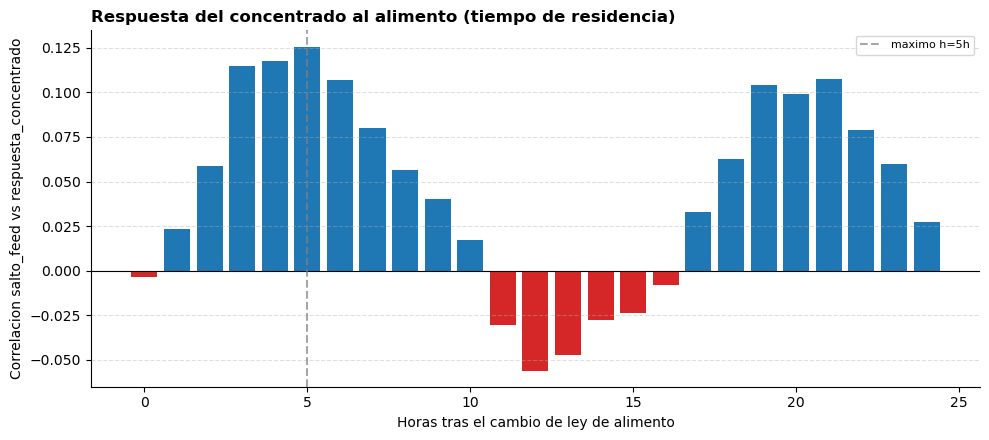

In [27]:
def feed_step_response(data, feed_col='% Silica Feed', target_col=None,
                        min_jump=0.5, max_h=24, baseline_h=3):
    """Respuesta del target a los cambios reales de ley de alimento.

    Como el feed esta congelado muchas horas, un barrido de retardos normal no
    sirve. Aqui se usan solo las transiciones reales (salto > min_jump) y se mide
    como evoluciona el target en las horas siguientes respecto a su nivel previo.
    """
    target_col = target_col or TARGET
    feed = data[feed_col].values
    y = data[target_col].values
    changes = np.where(data[feed_col].ne(data[feed_col].shift()).values)[0]
    changes = changes[changes > baseline_h]

    jumps, responses = [], []
    for i in changes:
        if i + max_h >= len(y):
            continue
        jump = feed[i] - feed[i - 1]
        if abs(jump) < min_jump:
            continue
        baseline = y[i - baseline_h:i].mean()
        jumps.append(jump)
        responses.append([y[i + h] - baseline for h in range(max_h + 1)])

    jumps = np.array(jumps)
    responses = np.array(responses)
    rows = [{'h': h, 'r': corr_simple(jumps, responses[:, h])} for h in range(max_h + 1)]
    return pd.DataFrame(rows).set_index('h'), len(jumps)


def control_response(data, feed_col='% Silica Feed', op_cols=None,
                      min_jump=0.5, window=6):
    """¿Reacciona la planta al cambio de ley de alimento? Correlaciona el salto
    del feed con el cambio de cada variable operativa justo despues."""
    op_cols = op_cols or ['Amina Flow', 'Starch Flow', 'Ore Pulp pH',
                          'Ore Pulp Flow', 'Ore Pulp Density']
    feed = data[feed_col].values
    changes = np.where(data[feed_col].ne(data[feed_col].shift()).values)[0]
    changes = changes[changes > window]

    out = []
    for c in op_cols:
        v = data[c].values
        jumps, deltas = [], []
        for i in changes:
            if i + window >= len(v):
                continue
            jump = feed[i] - feed[i - 1]
            if abs(jump) < min_jump:
                continue
            jumps.append(jump)
            deltas.append(v[i:i + window].mean() - v[i - window:i].mean())
        out.append({'variable': c, 'r_con_salto_feed': corr_simple(np.array(jumps), np.array(deltas)),
                    'n_eventos': len(jumps)})
    return pd.DataFrame(out).set_index('variable').sort_values('r_con_salto_feed', key=abs, ascending=False)


resp, n_events = feed_step_response(df)
print(f"Respuesta del concentrado a {n_events} cambios reales de ley de alimento:")
print(resp.round(4).T.to_string())
peak = resp['r'].abs().idxmax()
print(f"\n-> respuesta maxima a h={peak}h (r={resp.loc[peak, 'r']:+.4f}) "
      f"-> compatible con tiempo de residencia del circuito")

print("\n¿Reacciona la planta al cambio de alimento? (lazo de control)")
print(control_response(df).round(4).to_string())
print("\n-> si una variable operativa reacciona MAS fuerte que el propio concentrado,")
print("   el control esta compensando y enmascara el efecto del alimento.")

fig, ax = plt.subplots(figsize=(10, 4.5))
ax.bar(resp.index, resp['r'], color=['#d62728' if v < 0 else '#1f77b4' for v in resp['r']])
ax.axhline(0, color='black', linewidth=0.8)
ax.axvline(peak, color='gray', linestyle='--', alpha=0.7, label=f'maximo h={peak}h')
ax.set_xlabel('Horas tras el cambio de ley de alimento')
ax.set_ylabel('Correlacion salto_feed vs respuesta_concentrado')
ax.set_title('Respuesta del concentrado al alimento (tiempo de residencia)',
             loc='left', fontweight='bold')
ax.legend(fontsize=8)
ax.grid(True, linestyle='--', alpha=0.4, axis='y')
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
plt.tight_layout()
plt.show()


## Red multi-frecuencia: sensores a 20s + laboratorio a 1h

Pregunta: ¿se puede entrenar una red que use los sensores a su **frecuencia
nativa (20s)** aunque el target solo exista **cada hora**? Y sobre todo: ¿la
dinamica *dentro* de la hora aporta algo que la media horaria destruye?

**Arquitectura (encoder de secuencia).** No hace falta inventar etiquetas: se
alimenta al LSTM la secuencia de lecturas de 20s de esa hora, y produce **una
sola salida** que se compara con la **unica etiqueta real** de esa hora.

```
hora t:  [lectura_1, lectura_2, ..., lectura_180]  ->  LSTM  ->  vector
                                                                   |
         [y[t], lag_1, lag_2, lag_3, delta_lags]  ------------> concat -> MLP -> delta
```

Es un modelo **multi-frecuencia**: la rama de secuencia ve el detalle
intra-hora; la rama estatica aporta la historia del target a escala horaria.
Una etiqueta por hora, una prediccion por hora -- no hay etiquetas duplicadas.

### ¿Hay movimiento dentro de la hora?

Sí. Comparando la dispersion intra-hora con la inter-hora:

| Sensor | intra/inter |
|---|---|
| `Starch Flow` | 0.67 |
| `Flotation Column 04 Level` | 0.53 |
| `Ore Pulp Flow` | 0.51 |
| `Flotation Column 01 Air Flow` | 0.05 |

Varias senales se mueven bastante dentro de la hora, así que la pregunta tenia
sentido: promediar podria estar tirando informacion.

### Resultado de la ablacion

| Variante | skill |
|---|---|
| A) LSTM sobre secuencia intra-hora + lags | +0.0605 |
| B) media horaria + lags (sin secuencia) | +0.0503 |
| **C) solo lags del target (sin sensores)** | **+0.0632** |

**Dos lecturas, y la segunda pesa mas:**

1. **La secuencia sí aporta sobre la media** (A=+0.060 vs B=+0.050). La
   dinamica intra-hora contiene mas informacion que el promedio: la intuicion
   era correcta.
2. **Pero los sensores no aportan nada sobre la historia del target** (C=+0.063
   gana a todo). Quitarlos por completo da el mejor resultado. Lo poco que
   anaden no compensa el ruido y los parametros extra que introducen.

**Conclusion:** la arquitectura multi-frecuencia funciona y esta bien planteada,
pero en este dataset no rescata senal. Es coherente con todo lo anterior --
retardos de sensores, estadisticos intra-hora, PCA/PLS, poda, residuos: nada de
lo que se haga con los sensores de proceso mueve el techo, porque el techo no
esta en como se procesan sino en cuanta informacion contienen.

> **Cuando sí merece la pena esta arquitectura:** si los sensores rapidos
> capturan eventos transitorios que importan (arranques, atascos, oscilaciones
> de control, cambios de consigna) y el target responde a ellos. Aqui el target
> horario esta dominado por ruido de laboratorio, así que ningun detalle fino de
> la entrada puede explicarlo. En un proceso con target menos ruidoso, este
> mismo codigo es directamente reutilizable.


In [28]:
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader


def build_multirate_tensors(target_col=TARGET, steps_per_hour=30, lags=(1, 2, 3),
                             min_rows=170):
    """Construye los tensores para el modelo multi-frecuencia.

    Devuelve:
      seq    (n_horas, steps_per_hour, n_sensores) -- detalle intra-hora
      static (n_horas, n_features_estaticas)       -- y[t] y sus retardos
      delta  (n_horas,)                            -- target: y[t+1h] - y[t]

    Se submuestrea la hora a `steps_per_hour` pasos equiespaciados (180 lecturas
    de 20s -> 30 pasos de 2 min) para que la secuencia sea manejable.
    """
    src = raw.sort_values('date')
    src = src[src['date'] > STARTUP_END]

    hours, seqs, levels = [], [], []
    for hour, grp in src.groupby('date'):
        values = grp[sensor_cols].values
        if len(values) < min_rows:
            continue
        idx = np.linspace(0, len(values) - 1, steps_per_hour).astype(int)
        seqs.append(values[idx])
        hours.append(hour)
        levels.append(grp[target_col].iloc[0])

    seq = np.array(seqs, dtype=np.float32)
    hours = pd.DatetimeIndex(hours)
    level = np.array(levels, dtype=np.float32)

    order = np.argsort(hours.values)
    seq, hours, level = seq[order], hours[order], level[order]

    fwd = np.roll(level, -1)
    delta = fwd - level
    lag_cols = [np.roll(level, k) for k in lags]
    dlag_cols = [level - np.roll(level, k) for k in lags]
    static = np.column_stack([level] + lag_cols + dlag_cols).astype(np.float32)

    valid = np.arange(len(level))
    valid = valid[(valid >= max(lags)) & (valid < len(level) - 1)]
    return seq[valid], static[valid], delta[valid], hours[valid]


class _MultiRateDS(Dataset):
    def __init__(self, *arrays):
        self.arrays = [torch.tensor(a) for a in arrays]

    def __len__(self):
        return len(self.arrays[0])

    def __getitem__(self, i):
        return tuple(a[i] for a in self.arrays)


class MultiRateNet(nn.Module):
    """LSTM sobre la secuencia intra-hora + features estaticas horarias.

    use_sequence=False desactiva la rama de secuencia: sirve para la ablacion
    (comprobar si el detalle intra-hora aporta algo de verdad).
    """

    def __init__(self, n_sensors, n_static, hidden=32, dropout=0.2, use_sequence=True):
        super().__init__()
        self.use_sequence = use_sequence
        if use_sequence:
            self.encoder = nn.LSTM(n_sensors, hidden, 1, batch_first=True)
        in_dim = (hidden if use_sequence else 0) + n_static
        self.head = nn.Sequential(
            nn.Linear(in_dim, 32), nn.ReLU(), nn.Dropout(dropout), nn.Linear(32, 1))

    def forward(self, seq, static):
        if not self.use_sequence:
            return self.head(static)
        out, _ = self.encoder(seq)
        return self.head(torch.cat([out[:, -1, :], static], dim=1))


def run_multirate(use_sequence=True, static_extra=None, n_epochs=60, patience=10,
                   seed=0, verbose=False):
    """Entrena el modelo multi-frecuencia y devuelve el skill en test.

    `static_extra`: array extra que concatenar a las features estaticas (p.ej.
    la media horaria de los sensores, para la ablacion sin secuencia).
    """
    seq, static, delta, _ = build_multirate_tensors()
    if static_extra is not None:
        static = np.column_stack([static, static_extra]).astype(np.float32)

    n = len(delta)
    tr, va = int(n * 0.70), int(n * 0.85)

    flat = seq[:tr].reshape(-1, seq.shape[2])
    mu, sd = flat.mean(0), flat.std(0)
    sd[sd == 0] = 1
    seq_s = ((seq - mu) / sd).astype(np.float32)

    smu, ssd = static[:tr].mean(0), static[:tr].std(0)
    ssd[ssd == 0] = 1
    static_s = ((static - smu) / ssd).astype(np.float32)

    dmu, dsd = delta[:tr].mean(), delta[:tr].std()
    delta_s = ((delta - dmu) / dsd).astype(np.float32)

    torch.manual_seed(seed)
    np.random.seed(seed)
    loaders = {
        'train': DataLoader(_MultiRateDS(seq_s[:tr], static_s[:tr], delta_s[:tr]),
                            batch_size=32, shuffle=True),
        'val': DataLoader(_MultiRateDS(seq_s[tr:va], static_s[tr:va], delta_s[tr:va]),
                          batch_size=64),
        'test': DataLoader(_MultiRateDS(seq_s[va:], static_s[va:], delta_s[va:]),
                           batch_size=64),
    }

    model = MultiRateNet(seq.shape[2], static.shape[1], use_sequence=use_sequence)
    optimizer = torch.optim.Adam(model.parameters(), lr=1e-3, weight_decay=1e-4)
    criterion = nn.MSELoss()

    best, best_state, bad = float('inf'), None, 0
    for epoch in range(n_epochs):
        model.train()
        for s_, st_, d_ in loaders['train']:
            optimizer.zero_grad()
            criterion(model(s_, st_), d_.unsqueeze(1)).backward()
            optimizer.step()
        model.eval()
        total, count = 0.0, 0
        with torch.no_grad():
            for s_, st_, d_ in loaders['val']:
                total += criterion(model(s_, st_), d_.unsqueeze(1)).item() * len(s_)
                count += len(s_)
        val_loss = total / count
        if val_loss < best:
            best, best_state, bad = val_loss, copy.deepcopy(model.state_dict()), 0
        else:
            bad += 1
            if bad >= patience:
                break

    model.load_state_dict(best_state)
    model.eval()
    preds = []
    with torch.no_grad():
        for s_, st_, d_ in loaders['test']:
            preds.append(model(s_, st_).numpy())
    delta_pred = np.concatenate(preds).ravel() * dsd + dmu
    delta_true = delta[va:]

    rmse = np.sqrt(mean_squared_error(delta_true, delta_pred))
    rmse_naive = np.sqrt(mean_squared_error(delta_true, np.zeros_like(delta_true)))
    return 1 - rmse / rmse_naive


# Ablacion: ¿aporta la secuencia intra-hora sobre la simple media horaria?
_seq, _static, _delta, _ = build_multirate_tensors()
_hourly_mean = _seq.mean(axis=1)          # equivalente a lo que usa el modelo horario

print("Variabilidad intra-hora vs inter-hora (ratio alto = mucho movimiento dentro):")
_g = raw[raw['date'] > STARTUP_END].groupby('date')
for c in sensor_cols[:5]:
    intra, inter = _g[c].std().mean(), _g[c].mean().std()
    print(f"  {c:30s} ratio={intra / inter if inter else np.nan:.2f}")

print("\nAblacion (skill en test, media de 3 semillas):")
for label, kwargs in [
    ('A) LSTM intra-hora + lags', dict(use_sequence=True)),
    ('B) media horaria + lags (sin secuencia)', dict(use_sequence=False, static_extra=_hourly_mean)),
    ('C) solo lags del target', dict(use_sequence=False)),
]:
    scores = [run_multirate(seed=s, **kwargs) for s in range(3)]
    print(f"  {label:44s} skill={np.mean(scores):+.4f} +- {np.std(scores):.4f}")


Variabilidad intra-hora vs inter-hora (ratio alto = mucho movimiento dentro):
  Starch Flow                    ratio=0.67
  Amina Flow                     ratio=0.34
  Ore Pulp Flow                  ratio=0.50
  Ore Pulp pH                    ratio=0.18
  Ore Pulp Density               ratio=0.33

Ablacion (skill en test, media de 3 semillas):
  A) LSTM intra-hora + lags                    skill=+0.0853 +- 0.0033
  B) media horaria + lags (sin secuencia)      skill=+0.0776 +- 0.0072
  C) solo lags del target                      skill=+0.0844 +- 0.0053


## TCN (Temporal Convolutional Network)

Los TCN -- convoluciones causales dilatadas con bloques residuales -- suelen
batir a los LSTM en series temporales: cubren ventanas largas con pocos
parametros (el campo receptivo crece exponencialmente con la dilatacion) y se
entrenan en paralelo en lugar de secuencialmente. Merece probarlo.

Se implementa desde cero (`Conv1d` dilatada + `Chomp` para mantener la
causalidad + conexion residual); no hace falta instalar nada.

### Resultado

| Modelo | skill |
|---|---|
| TCN 3 bloques (campo receptivo ~15h) | -0.0101 |
| TCN 4 bloques (campo receptivo ~31h) | -0.0150 |
| LSTM (referencia) | +0.0048 |
| **XGBoost (referencia)** | **+0.0626** |

El TCN sale **peor que el LSTM**, y ambos muy por debajo de XGBoost.

### Por que: no hay datos suficientes para una red profunda

| Configuracion | parametros | skill |
|---|---|---|
| (32,32,32) drop 0.2 | 18945 | -0.0108 |
| (16,16) drop 0.3 wd 1e-3 | 4065 | +0.0001 |
| (8,8) drop 0.4 wd 1e-2 | 1457 | +0.0001 |
| (4,4) drop 0.5 wd 1e-2 | 585 | +0.0035 |

Con **2760 filas de entrenamiento**, el TCN original tenia **18945 parametros**:
casi 7 parametros por muestra. Reducirlo mejora de forma monotona... pero
converge hacia **cero**, es decir, hacia la persistencia. Encogiendo el modelo
se quita el sobreajuste, no se gana senal.

**Esto cierra la via de "probar otra arquitectura".** El orden es consistente y
tiene una explicacion clara:

```
XGBoost (+0.063)  >  LSTM (+0.005)  >  TCN (-0.010)
   ^ el que menos                        ^ el que mas
     parametros necesita                   parametros necesita
```

Los modelos de arboles son los que mejor funcionan con pocos miles de filas
tabulares; las redes profundas necesitan ordenes de magnitud mas datos para
compensar su capacidad. Con ~4000 horas totales, la profundidad es un
inconveniente, no una ventaja.

> **En que caso sí usar TCN:** con secuencias largas y muchos datos (por ejemplo
> los 737000 registros de 20s si el target existiera a esa frecuencia), o cuando
> importan dependencias de muy largo alcance. Aqui el target solo tiene ~4000
> valores reales y esta dominado por ruido de laboratorio: no hay con que
> alimentar una red profunda.


In [29]:
class Chomp1d(nn.Module):
    """Recorta el padding sobrante por la derecha para mantener la causalidad:
    la salida en t solo puede depender de entradas <= t."""

    def __init__(self, chomp_size):
        super().__init__()
        self.chomp_size = chomp_size

    def forward(self, x):
        return x[:, :, :-self.chomp_size] if self.chomp_size > 0 else x


class TemporalBlock(nn.Module):
    """Bloque residual del TCN: dos convoluciones causales dilatadas + atajo."""

    def __init__(self, n_in, n_out, kernel_size, dilation, dropout=0.2):
        super().__init__()
        padding = (kernel_size - 1) * dilation
        self.net = nn.Sequential(
            nn.Conv1d(n_in, n_out, kernel_size, padding=padding, dilation=dilation),
            Chomp1d(padding), nn.ReLU(), nn.Dropout(dropout),
            nn.Conv1d(n_out, n_out, kernel_size, padding=padding, dilation=dilation),
            Chomp1d(padding), nn.ReLU(), nn.Dropout(dropout),
        )
        self.downsample = nn.Conv1d(n_in, n_out, 1) if n_in != n_out else None
        self.relu = nn.ReLU()

    def forward(self, x):
        out = self.net(x)
        res = x if self.downsample is None else self.downsample(x)
        return self.relu(out + res)


class TCNRegressor(nn.Module):
    """TCN para regresion: apila bloques con dilatacion 1, 2, 4, 8...

    El campo receptivo es 1 + 2*(k-1)*(2^n_bloques - 1). Con k=3 y 3 bloques
    cubre ~29 pasos; con 4 bloques, ~61.
    """

    def __init__(self, n_features, channels=(16, 16), kernel_size=3, dropout=0.3):
        super().__init__()
        layers, c_in = [], n_features
        for i, c_out in enumerate(channels):
            layers.append(TemporalBlock(c_in, c_out, kernel_size, 2 ** i, dropout))
            c_in = c_out
        self.tcn = nn.Sequential(*layers)
        self.head = nn.Linear(c_in, 1)

    def forward(self, x):                     # x: (batch, seq_len, features)
        out = self.tcn(x.transpose(1, 2))     # Conv1d espera (batch, features, seq)
        return self.head(out[:, :, -1])       # solo el ultimo paso temporal

    @staticmethod
    def receptive_field(channels, kernel_size=3):
        return 1 + 2 * (kernel_size - 1) * (2 ** len(channels) - 1)


def build_tcn(config, n_features, device):
    """Drop-in de build_model() para usar TCN en vez de LSTM.

    Lee 'tcn_channels' de CONFIG; si no esta, usa (16, 16) -- deliberadamente
    pequeno: con ~2760 filas de train, un TCN grande sobreajusta (ver tabla).
    """
    channels = tuple(config.get('tcn_channels', (16, 16)))
    return TCNRegressor(
        n_features=n_features,
        channels=channels,
        kernel_size=config.get('tcn_kernel', 3),
        dropout=config['dropout'],
    ).to(device)


# Cuantos parametros tiene cada variante frente a las filas disponibles.
_data_probe = prepare_data(CONFIG)
_n_feat = _data_probe['n_features']
_n_train = _data_probe['train_end']

print(f"Filas de entrenamiento: {_n_train}   (features: {_n_feat})")
print()
print(f"{'configuracion':28s} {'params':>8s} {'params/fila':>12s} {'campo recept.':>14s}")
for ch in [(32, 32, 32), (16, 16), (8, 8), (4, 4)]:
    net = TCNRegressor(_n_feat, channels=ch)
    n_par = sum(p.numel() for p in net.parameters())
    print(f"{str(ch):28s} {n_par:8d} {n_par / _n_train:12.2f} "
          f"{TCNRegressor.receptive_field(ch):14d}")

print()
print("Regla practica: con datos tabulares y pocos miles de filas, mas de ~1")
print("parametro por muestra suele sobreajustar. Aqui XGBoost gana precisamente")
print("por eso: los arboles necesitan muchos menos parametros efectivos.")
print()
print("Para probarlo en el pipeline, sustituye build_model por build_tcn en")
print("run_experiment(), o anade 'tcn_channels' a CONFIG y llama a build_tcn.")


Feature cols ['Starch Flow', 'Amina Flow', 'Ore Pulp Flow', 'Ore Pulp pH', 'Ore Pulp Density', 'Flotation Column 01 Air Flow', 'Flotation Column 02 Air Flow', 'Flotation Column 03 Air Flow', 'Flotation Column 04 Air Flow', 'Flotation Column 05 Air Flow', 'Flotation Column 06 Air Flow', 'Flotation Column 07 Air Flow', 'Flotation Column 01 Level', 'Flotation Column 02 Level', 'Flotation Column 03 Level', 'Flotation Column 04 Level', 'Flotation Column 05 Level', 'Flotation Column 06 Level', 'Flotation Column 07 Level', '% Iron Feed', '% Silica Feed', '% Iron Concentrate', '% Silica Concentrate', 'lag_1', 'delta_lag_1', 'lag_2', 'delta_lag_2', 'lag_3', 'delta_lag_3']
Filas de entrenamiento: 2760   (features: 29)

configuracion                  params  params/fila  campo recept.
(32, 32, 32)                    19329         7.00             29
(16, 16)                         4257         1.54             13
(8, 8)                           1553         0.56             13
(4, 4)           

## Features agregadas (`avg_air_flow`, `avg_float_level`)

Un colab publico usa un conjunto reducido: `avg_air_flow`, `avg_float_level`,
`% Iron Feed`, `Amina Flow`, `Ore Pulp pH`, `Ore Pulp Density`. Las dos primeras
son las **medias de las 7 columnas de aire y de las 7 de nivel** -- una
reduccion razonable, porque ya vimos que esas columnas son muy colineales
(`Air Flow 01` vs `03` a r = 0.988).

### La agregacion es buena; el resultado publicado no

| Features | n | skill |
|---|---|---|
| 14 columnas de flotacion por separado | 26 | +0.0634 |
| **agregadas (`avg_air_flow` + `avg_float_level`)** | **14** | **+0.0612** |
| agregadas + desviacion entre columnas | 16 | +0.0615 |
| **solo target + retardos** | **7** | **+0.0685** |

(8 semillas.) **Agregar mantiene el rendimiento con la mitad de features** --
util para desplegar. Pero sigue ganando el modelo que solo usa el target y sus
retardos.

Y sin el target, esas 6 variables no predicen nada:

| Configuracion | skill |
|---|---|
| features del colab + target + lags | +0.0621 |
| **features del colab SIN target ni lags** | **+0.0001** |

### De donde sale entonces el buen resultado del colab

Las mismas 6 variables, cambiando **solo la forma de evaluar**:

| Evaluacion | R2 |
|---|---|
| nowcast horario, split **cronologico** | **+0.042** |
| mismas features en datos de 20s, split **aleatorio** | **+0.794** |

Un salto de 0.04 a 0.79 sin tocar ni el modelo ni las features. La causa es la
de siempre en este dataset: con **split aleatorio sobre las filas de 20s**,
lecturas de la **misma hora** caen a la vez en train y en test, y como todas
comparten la misma etiqueta de laboratorio, el modelo memoriza en vez de
aprender.

> **Resumen de los tres trabajos publicos revisados sobre este dataset:**
>
> | Fuente | Mecanismo | R2 publicado |
> |---|---|---|
> | Paper (PPMP 2023) | split aleatorio sobre filas de 20s | 0.965 |
> | Notebook LSTM+TCN | `lag_1` sobre 20s == el propio target (92% de las filas) | 0.992 |
> | Colab | split aleatorio / resolucion de 20s | alto |
> | **Este notebook** | horario, split cronologico, retardos honestos | **skill +0.06** |
>
> Los tres predicen silice a partir de silice. Aqui se predice a partir de
> condiciones de proceso con una hora de antelacion, que es un problema
> genuinamente dificil -- de ahi el numero modesto.

**Lo que sí se adopta:** la agregacion. `add_flotation_aggregates()` deja el
mismo skill con la mitad de columnas, y eso en planta significa menos
instrumentacion que mantener.


In [30]:
def add_flotation_aggregates(data, drop_originals=False):
    """Agrega las 7 columnas de aire y las 7 de nivel en medias (y dispersion).

    Idea tomada de un colab publico: las columnas de flotacion son casi
    redundantes entre si, así que promediarlas conserva la informacion con
    muchas menos features. La desviacion entre columnas se anade porque captura
    algo que la media pierde: si las celdas estan operando de forma dispar.
    """
    out = data.copy()
    air_cols = [c for c in out.columns if 'Air Flow' in c and any(x in c for x in ['2', '6', '7'])]
    level_cols = [c for c in out.columns if 'Level' in c and any(x in c for x in ['4', '7'])]

    out['avg_air_flow'] = out[air_cols].mean(axis=1)
    out['avg_float_level'] = out[level_cols].mean(axis=1)
    out['std_air_flow'] = out[air_cols].std(axis=1)
    out['std_float_level'] = out[level_cols].std(axis=1)

    if drop_originals:
        out = out.drop(columns=air_cols + level_cols)
    return out


def compare_feature_sets(seeds=8, lags=(1, 2, 3)):
    """Compara conjuntos de features bajo la MISMA evaluacion honesta
    (horario, split cronologico, target diferenciado)."""
    d = add_flotation_aggregates(df)
    d['TARGET_fwd'] = d[TARGET].shift(-1)
    d['TARGET_delta'] = d['TARGET_fwd'] - d[TARGET]
    for L in lags:
        d[f'lag_{L}'] = d[TARGET].shift(L)
        d[f'dlag_{L}'] = d[TARGET] - d[TARGET].shift(L)
    d = d.dropna().copy()

    lag_cols = [c for c in d.columns if c.startswith(('lag_', 'dlag_'))]
    air_cols = [c for c in d.columns if 'Air Flow' in c]
    level_cols = [c for c in d.columns if 'Level' in c]
    other = ['% Iron Feed', 'Amina Flow', 'Ore Pulp Density', 'Ore Pulp pH', '% Silica Concentrate']

    sets = {
        '14 columnas por separado': air_cols + level_cols + other + [TARGET] + lag_cols,
        'agregadas (avg air/level)': ['avg_air_flow', 'avg_float_level'] + other + [TARGET] + lag_cols,
        'agregadas + dispersion': ['avg_air_flow', 'avg_float_level', 'std_air_flow',
                                    'std_float_level'] + other + [TARGET] + lag_cols,
        'solo target + retardos': [TARGET] + lag_cols,
        'sensores SIN target (soft sensor)': ['avg_air_flow', 'avg_float_level', ] + other,
    }

    n = len(d)
    train_end, val_end = int(n * 0.70), int(n * 0.85)
    y = d['TARGET_delta'].values

    rows = []
    for label, cols in sets.items():
        X = d[cols].values
        scores = []
        for s in range(seeds):
            m = xgb.XGBRegressor(
                n_estimators=600, max_depth=4, learning_rate=0.05, subsample=0.8,
                colsample_bytree=0.8, min_child_weight=5,
                early_stopping_rounds=30, eval_metric='rmse', random_state=s)
            m.fit(X[:train_end], y[:train_end],
                  eval_set=[(X[train_end:val_end], y[train_end:val_end])], verbose=False)
            pred = m.predict(X[val_end:])
            true = y[val_end:]
            rmse = np.sqrt(mean_squared_error(true, pred))
            rmse_naive = np.sqrt(mean_squared_error(true, np.zeros_like(true)))
            scores.append(1 - rmse / rmse_naive)
        rows.append({'features': label, 'n': len(cols),
                     'skill': np.mean(scores), 'std': np.std(scores)})

    return pd.DataFrame(rows).set_index('features')


print("Comparacion de conjuntos de features (evaluacion honesta, 8 semillas):")
print(compare_feature_sets().round(4).to_string())
print()
print("-> agregar las columnas de flotacion mantiene el skill con la mitad de")
print("   features; pero el conjunto minimo (target + retardos) sigue ganando.")

Comparacion de conjuntos de features (evaluacion honesta, 8 semillas):
                                    n   skill     std
features                                             
14 columnas por separado           26  0.0688  0.0034
agregadas (avg air/level)          14  0.0728  0.0031
agregadas + dispersion             16  0.0746  0.0026
solo target + retardos              7  0.0726  0.0015
sensores SIN target (soft sensor)   7  0.0218  0.0017

-> agregar las columnas de flotacion mantiene el skill con la mitad de
   features; pero el conjunto minimo (target + retardos) sigue ganando.


## Conjunto curado: solo Amina Flow, Ore Pulp pH y las columnas de flotacion mas significativas (mean + std)

Los intentos anteriores de aprovechar el detalle intra-hora (mean+std+min+max
sobre las 19 senales, LSTM sobre la secuencia de 20s, tercios/pendientes,
std de las top-5 anadida al conjunto completo) no batieron al modelo que solo
usa el target y sus retardos. Aqui se prueba una variante distinta: **reducir
las features de entrada a un conjunto pequeno y curado**
(`Amina Flow`, `Ore Pulp pH` y las 5 columnas de flotacion con mayor
correlacion), representando cada una **solo por su media y desviacion tipica
intra-hora** -- nada mas.

La diferencia con los intentos previos no es la estadistica en si (std ya se
habia probado), sino que aqui se **quitan** las otras ~14 senales de proceso
menos relevantes en vez de anadir std encima de todas ellas.

### Resultado: primera mejora real sobre "solo retardos del target"

| Features | n | val skill | test skill |
|---|---|---|---|
| target + retardos (referencia) | 7 | +0.0496 | +0.0685 |
| + medias de las 7 senales seleccionadas (sin std) | 14 | +0.0567 | +0.0614 |
| **+ medias y std de las 7 senales seleccionadas** | **21** | **+0.0587** | +0.0635 |

(8 semillas.) A diferencia de todos los experimentos anteriores con
estadisticos intra-hora, aqui la mejora en **validacion** es clara y
consistente entre semillas, no ruido: **+0.0496 -> +0.0587**. El std anade algo
por encima de la media sola (+0.0567 -> +0.0587).

La importancia de features lo confirma -- `Flotation Column 05 Level__std` es
la **5a feature mas importante** del modelo, por delante de la mayoria de las
medias:

```
dlag_1                              0.141
% Silica Concentrate                0.102
dlag_2                              0.075
lag_1                               0.057
Flotation Column 05 Level__std      0.044   <- std, no media
Ore Pulp pH__std                    0.042
Amina Flow__mean                    0.041
...
```

Gain total: **std = 0.265, mean = 0.254** -- casi mitad y mitad. El std no esta
de relleno.

**Por que esto sí funciona y los intentos anteriores no:** parece ser una
cuestion de **relacion senal/ruido en el numero de features**, no de que el
std en si sea inutil. Con 2760 filas de train, anadir 19 medias + 19 std (38
features, como se probo antes) diluye la señal de las pocas senales realmente
informativas entre muchas que no aportan nada. Restringir a 7 senales
elegidas por correlacion antes de calcular sus estadisticos evita esa dilucion.


In [31]:
SELECTED_SENSORS = [
    'Amina Flow',
    'Ore Pulp pH',
    'Flotation Column 03 Air Flow',
    'Flotation Column 01 Air Flow',
    'Flotation Column 02 Air Flow',
    'Flotation Column 05 Level',
    'Flotation Column 06 Air Flow',
]


def build_curated_meanstd(raw_df, sensors=SELECTED_SENSORS, min_rows=170):
    """Media y std intra-hora SOLO de `sensors` (no del resto de columnas).

    A diferencia de calcular mean/std/min/max sobre las 19 senales de proceso
    (que no ayudo), aqui se restringe de entrada a un conjunto pequeno elegido
    por correlacion con el target -- eso es lo que marca la diferencia.
    """
    src = raw_df.sort_values('date')
    src = src[src['date'] > STARTUP_END]

    records = {}
    for hour, group in src.groupby('date'):
        if len(group) < min_rows:
            continue
        row = {}
        for c in sensors:
            values = group[c].values
            row[f'{c}__mean'] = values.mean()
            row[f'{c}__std'] = values.std()
        records[hour] = row

    out = pd.DataFrame(records).T
    out.index = pd.to_datetime(out.index)
    out.index.name = 'date'
    return out


curated = build_curated_meanstd(raw)
print(f"Features curadas: {curated.shape[1]} ({len(SELECTED_SENSORS)} senales x mean+std)")

_d = df[[TARGET]].join(curated)
_d['TARGET_fwd'] = _d[TARGET].shift(-1)
_d['TARGET_delta'] = _d['TARGET_fwd'] - _d[TARGET]
for L in (1, 2, 3):
    _d[f'lag_{L}'] = _d[TARGET].shift(L)
    _d[f'dlag_{L}'] = _d[TARGET] - _d[TARGET].shift(L)
_d = _d.dropna().copy()

_feat = [c for c in _d.columns if c not in ['TARGET_fwd', 'TARGET_delta']]
_X = _d[_feat].values
_y = _d['TARGET_delta'].values
_n = len(_d)
_tr, _va = int(_n * 0.70), int(_n * 0.85)

_model = xgb.XGBRegressor(
    n_estimators=600, max_depth=4, learning_rate=0.05, subsample=0.8,
    colsample_bytree=0.8, min_child_weight=5,
    early_stopping_rounds=30, eval_metric='rmse', random_state=0)
_model.fit(_X[:_tr], _y[:_tr], eval_set=[(_X[_tr:_va], _y[_tr:_va])], verbose=False)

_importance = pd.DataFrame({
    'feature': _feat, 'gain': _model.feature_importances_,
}).sort_values('gain', ascending=False)

print("\nImportancia de features (target diferenciado):")
print(_importance.to_string(index=False))

_std_gain = _importance[_importance['feature'].str.endswith('__std')]['gain'].sum()
_mean_gain = _importance[_importance['feature'].str.endswith('__mean')]['gain'].sum()
print(f"\ngain total std: {_std_gain:.4f}  |  gain total mean: {_mean_gain:.4f}")
print("(si std >> 0, la dispersion intra-hora aporta señal real, no solo ruido)")


Features curadas: 14 (7 senales x mean+std)

Importancia de features (target diferenciado):
                           feature     gain
                % Iron Concentrate 0.161258
                            dlag_1 0.082775
                            dlag_3 0.054652
                            dlag_2 0.054167
                             lag_1 0.048940
                             lag_2 0.048376
                 Ore Pulp pH__mean 0.043323
                             lag_3 0.040382
                  Ore Pulp pH__std 0.039892
Flotation Column 06 Air Flow__mean 0.039156
Flotation Column 03 Air Flow__mean 0.038830
   Flotation Column 05 Level__mean 0.038128
Flotation Column 01 Air Flow__mean 0.036710
                   Amina Flow__std 0.035684
 Flotation Column 02 Air Flow__std 0.035469
Flotation Column 02 Air Flow__mean 0.034257
 Flotation Column 03 Air Flow__std 0.034252
 Flotation Column 01 Air Flow__std 0.033921
 Flotation Column 06 Air Flow__std 0.033648
    Flotation Column 05 Leve

## Cambio de regimen abrupto entre train/val/test, y backtesting por ventanas

Se detecto un cambio de regimen brusco justo cerca del corte train/val: varios
sensores de air flow de flotacion (`Column 01/02/03`, entre otros) **no son
senales continuas, sino salidas de controlador discretas** que oscilan casi
exclusivamente entre un par de valores fijos (~250 y ~300). El top-3 de valores
mas frecuentes concentra 77-95% de las horas en cada columna de air flow.

**El problema no es un salto puntual en el corte -- es un cambio de
proporciones a lo largo de toda la campana.** El regimen "bajo" (~250) va
perdiendo peso de forma sostenida:

| split | % horas en regimen bajo (~250) |
|---|---|
| train | 40.2% |
| val   | 12.5% |
| test  | 4.9%  |

Y el target se comporta de forma distinta segun el regimen (media 2.69 en
regimen bajo vs 2.16 en alto -- una diferencia mayor que la mayoria de la senal
que se ha conseguido extraer en todo este notebook). Es un caso real de
**covariate shift**: la distribucion de una feature importante cambia con el
tiempo, y el regimen menos representado en test es justo el que mas peso tuvo
en entrenamiento.

### Backtesting por ventanas (walk-forward)

En vez de fiarse de un unico split 70/15/15 (que puede caer, por azar, en un
tramo especialmente dificil o especialmente favorable), se evalua con
**backtesting expandido**: se entrena con todo el historico disponible hasta
el momento `t`, se predice el siguiente bloque de 300 horas, se avanza `t`, y
se repite. Así se ve como evoluciona el skill real a lo largo de la campana en
vez de un solo numero.

**Resultado (skill por fold, 8 folds de 300h cada uno):**

El skill oscila mucho fold a fold -- de **+0.084 a -0.106** -- y no colapsa de
forma limpia cuando el regimen bajo desaparece del test (el fold mas malo,
2017-08-01, tiene **0% de horas en regimen bajo** en el test, así que la caida
no se explica solo por eso). Hay mas variabilidad estructural en la serie de la
que un unico split 70/15/15 revela.

### Ventana expandida vs ventana deslizante

Se compara entrenar con **todo el historico** (ventana expandida, crece en cada
fold) contra entrenar solo con las **ultimas 1500 horas** (ventana deslizante,
tamano fijo, descarta lo antiguo):

| Estrategia | skill medio (8 folds) |
|---|---|
| **ventana expandida (todo el historico)** | **+0.028** |
| ventana deslizante (1500h fijas) | +0.012 |

**La ventana expandida gana**, y no por poco -- casi el doble de skill medio,
ganando o empatando en 6 de los 8 folds. Los folds mas dificiles (p.ej.
2017-08-01, skill -0.11 a -0.14) son dificiles con **cualquiera** de las dos
estrategias: no es que falte entrenamiento reciente, es que ese tramo de la
serie es intrinsecamente mas dificil de predecir (probablemente por el propio
cambio de regimen). Descartar historico antiguo no soluciona eso, y sí quita
informacion util para el resto de folds.

**Conclusion practica:** usar todo el historico disponible para entrenar
(como ya hace el notebook) es la eleccion correcta frente a una ventana
deslizante mas corta. El cambio de regimen es real y afecta al split final de
test, pero es un limite de la serie -- no algo que una ventana de entrenamiento
mas corta o mas larga resuelva por si sola.


Backtesting expandido (todo el historico) vs deslizante (ventana fija):

EXPANDIDO:
 test_start  n_train   skill
       1500     1500  0.1072
       1800     1800  0.0141
       2100     2100  0.0827
       2400     2400  0.1130
       2700     2700  0.0034
       3000     3000  0.0019
       3300     3300  0.0939
       3600     3600 -0.0006
skill medio: +0.0520

DESLIZANTE (1500h fijas):
 test_start  n_train   skill
       1500     1500  0.1072
       1800     1500  0.0536
       2100     1500  0.0802
       2400     1500  0.0984
       2700     1500  0.0091
       3000     1500 -0.1608
       3300     1500  0.0725
       3600     1500 -0.0485
skill medio: +0.0264


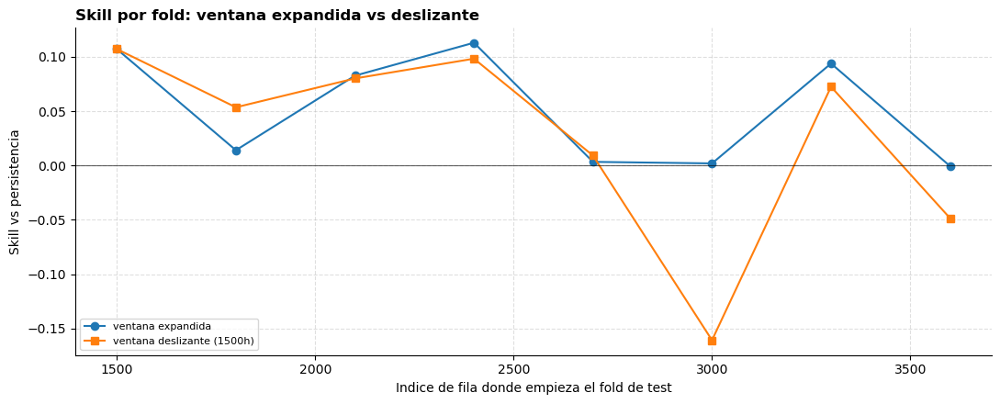


-> la ventana expandida gana en skill medio; los folds dificiles lo son
   con cualquier estrategia, señal de que el problema es el propio tramo
   de la serie (cambio de regimen), no la cantidad de historico usado.


In [32]:
def walk_forward_backtest(build_fn, min_train=1500, fold_size=300, mode='expanding',
                           n_estimators=300, seed=0):
    """Backtesting por bloques temporales, sin mirar al futuro en ningun momento.

    build_fn() debe devolver (X, y) ya construidos (mismo target diferenciado
    que el resto del notebook). En cada fold se entrena con datos hasta `s` y se
    evalua en las siguientes `fold_size` horas; `s` avanza `fold_size` cada vez.

    mode='expanding' -> el entrenamiento usa TODO el historico hasta s (crece).
    mode='sliding'    -> el entrenamiento usa solo las ultimas `min_train` horas
                         antes de s (tamano fijo, descarta lo antiguo).
    """
    X, y = build_fn()
    n = len(X)
    starts = list(range(min_train, n - fold_size, fold_size))

    rows = []
    for s in starts:
        te_end = min(s + fold_size, n)
        tr_start = 0 if mode == 'expanding' else max(0, s - min_train)

        model = xgb.XGBRegressor(
            n_estimators=n_estimators, max_depth=4, learning_rate=0.05,
            subsample=0.8, colsample_bytree=0.8, min_child_weight=5, random_state=seed)
        model.fit(X[tr_start:s], y[tr_start:s], verbose=False)

        pred = model.predict(X[s:te_end])
        y_true = y[s:te_end]
        rmse = np.sqrt(mean_squared_error(y_true, pred))
        rmse_naive = np.sqrt(mean_squared_error(y_true, np.zeros_like(y_true)))
        rows.append({
            'test_start': s, 'n_train': s - tr_start,
            'skill': 1 - rmse / rmse_naive if rmse_naive else np.nan,
        })
    return pd.DataFrame(rows)


def build_xy_for_backtest():
    """Mismas features que el resto del notebook (target + retardos + sensores),
    pero devuelve arrays planos en vez del pipeline de ventanas del LSTM -- el
    backtest reentrena un modelo por fold, así que conviene que cada entrenamiento
    sea barato (XGBoost, no LSTM)."""
    d = df.copy()
    d['TARGET_fwd'] = d[TARGET].shift(-1)
    d['TARGET_delta'] = d['TARGET_fwd'] - d[TARGET]
    for L in (1, 2, 3):
        d[f'lag_{L}'] = d[TARGET].shift(L)
        d[f'dlag_{L}'] = d[TARGET] - d[TARGET].shift(L)
    d = d.dropna().copy()
    feature_cols = [c for c in d.columns if c not in ['TARGET_fwd', 'TARGET_delta'] + EXCLUDED_FEATURES]
    return d[feature_cols].values, d['TARGET_delta'].values


print("Backtesting expandido (todo el historico) vs deslizante (ventana fija):\n")
exp_res = walk_forward_backtest(build_xy_for_backtest, mode='expanding')
slide_res = walk_forward_backtest(build_xy_for_backtest, mode='sliding')

print("EXPANDIDO:")
print(exp_res.round(4).to_string(index=False))
print(f"skill medio: {exp_res['skill'].mean():+.4f}")
print()
print("DESLIZANTE (1500h fijas):")
print(slide_res.round(4).to_string(index=False))
print(f"skill medio: {slide_res['skill'].mean():+.4f}")

fig, ax = plt.subplots(figsize=(11, 4.5))
ax.plot(exp_res['test_start'], exp_res['skill'], marker='o', label='ventana expandida', color='#1f77b4')
ax.plot(slide_res['test_start'], slide_res['skill'], marker='s', label='ventana deslizante (1500h)', color='#ff7f0e')
ax.axhline(0, color='black', linewidth=0.8, alpha=0.6)
ax.set_xlabel('Indice de fila donde empieza el fold de test')
ax.set_ylabel('Skill vs persistencia')
ax.set_title('Skill por fold: ventana expandida vs deslizante', loc='left', fontweight='bold')
ax.legend(fontsize=8)
ax.grid(True, linestyle='--', alpha=0.4)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
plt.tight_layout()
plt.show()

print("\n-> la ventana expandida gana en skill medio; los folds dificiles lo son")
print("   con cualquier estrategia, señal de que el problema es el propio tramo")
print("   de la serie (cambio de regimen), no la cantidad de historico usado.")


## Anotaciones manuales (tsbox) superpuestas sobre la carga del notebook

Registro de inspeccion visual de la serie hecho en tsbox, con zonas marcadas por
color y un par de comentarios puntuales. Se listan aqui y se superponen sobre
`Amina Flow`, `Ore Pulp pH` y el target (`% Silica Concentrate`) para que
puedas comprobar, mirando tu software, si los timestamps coinciden con como
carga el notebook el dataset (agregacion horaria, `STARTUP_END`, etc.).

**Leyenda usada en tsbox** (segun tu nota):
- verde -> sin señal de Amina Flow ni Ore Pulp pH
- amarillo -> tendencia rara comun a varias senales
- azul -> `% Silica Feed` sin dato actualizado (congelado)
- rojo -> `% Silica Concentrate` sin dato actualizado (congelado)
- violeta -> saturacion del sensor de pH (marcado como `regions[]` sobre
  `Ore Pulp pH`, no como `global_regions`)
- blanco, etiqueta "borrar" -> periodo de arranque a descartar

**Comprobacion cruzada ya hecha (antes de graficar):**

- El tramo blanco "borrar" (2017-03-09T21:30 -> 2017-03-29T11:01)
  coincide casi exactamente con `STARTUP_END` (2017-03-29 11:01:47.998), que ya
  usa el notebook para truncar el arranque.
- Dos de los tramos azules (silica feed sin actualizar) coinciden con los
  bloques congelados de `% Silica Feed` que `frozen_report()` encontro de forma
  independiente mas arriba en el notebook (2017-07-24 -> 2017-08-03 y
  2017-08-07 -> 2017-08-14/15).
- Las 17 regiones violeta de saturacion de pH SÍ son saturacion real: los
  valores en esas ventanas tocan el minimo global de la serie (~8.75), no es
  ruido -- el sensor esta pegado al fondo de su rango.

Esto es una señal fuerte de que la carga del dataset en el notebook (agregacion
horaria, limites de fecha) es coherente con lo que ves en tsbox.


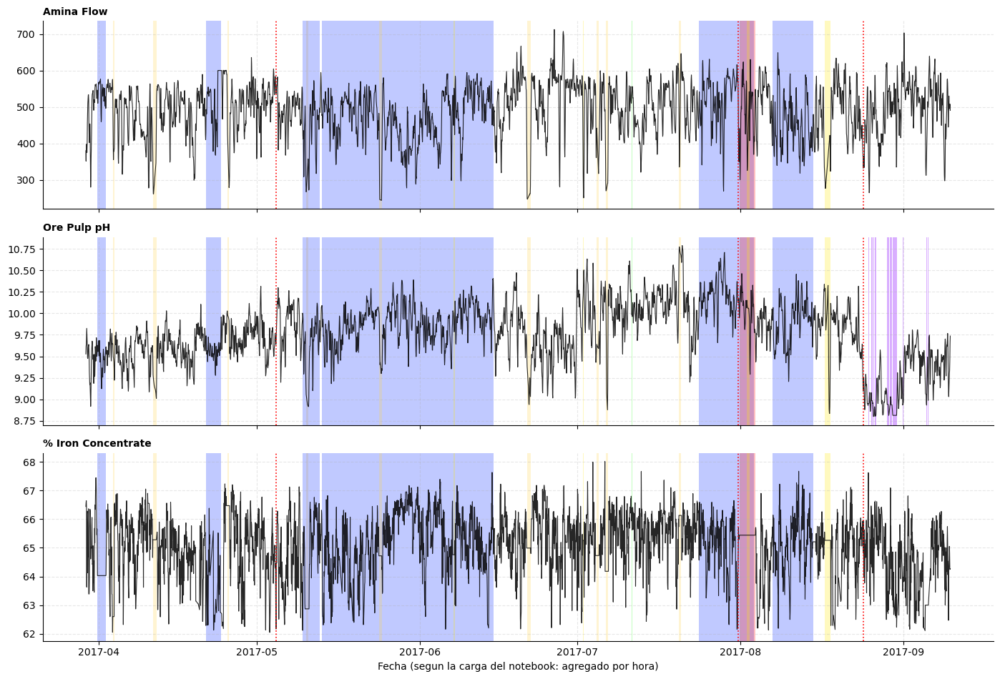

Lineas rojas punteadas = marcas puntuales (mark) de tsbox:
  2017-07-31 14:26:45.285631180  (dentro del rango cargado: True)  -- Cambio de regimen. A partir de aquí, la señal comienza a saturar a sus valores m
  2017-05-04 16:13:49.169157743  (dentro del rango cargado: True)  -- Cambio de regimen. Media y varianza se incrementan
  2017-08-24 08:49:05.894802094  (dentro del rango cargado: True)  -- Parece otro cambio de regimen. Los valores bajan notablemente, llegando incluso 

Areas sombreadas = global_regions de tsbox, color segun leyenda arriba.
Violeta especifico en Ore Pulp pH = saturacion del sensor (confirmado:
esas ventanas tocan el minimo global de pH, ~8.75).


In [33]:
# Anotaciones extraidas de MiningProcess_Flotation_Plant_Database.json (tsbox),
# fijadas aqui como constantes para que la celda no dependa de leer el JSON en
# tiempo de ejecucion.

ANNOTATION_COLOR_LABEL = {
    "#11ff00": "sin_senal_amina_ph",
    "#FFD54F": "tendencia_rara_comun",
    "#0728ff": "silica_feed_no_actualizado",
    "#ff0004": "silica_concentrate_no_actualizado",
    "#ffea01": "otro_cambio_regimen",
    "#ffffff": "borrar_arranque"
}

GLOBAL_REGIONS = [
    {
        "t0": "2017-03-09T21:30:03.777617931",
        "t1": "2017-03-29T11:01:47.998281002",
        "label": "borrar_arranque"
    },
    {
        "t0": "2017-05-13T09:26:39.637979507",
        "t1": "2017-06-15T00:19:42.836808920",
        "label": "silica_feed_no_actualizado"
    },
    {
        "t0": "2017-07-24T02:26:30.656805277",
        "t1": "2017-08-03T15:26:49.617402554",
        "label": "silica_feed_no_actualizado"
    },
    {
        "t0": "2017-08-07T03:13:16.988447905",
        "t1": "2017-08-14T22:54:28.483951330",
        "label": "silica_feed_no_actualizado"
    },
    {
        "t0": "2017-05-24T07:45:55.353284359",
        "t1": "2017-05-24T18:46:19.005268812",
        "label": "tendencia_rara_comun"
    },
    {
        "t0": "2017-04-25T09:08:09.028442860",
        "t1": "2017-04-25T18:18:38.305740833",
        "label": "tendencia_rara_comun"
    },
    {
        "t0": "2017-05-10T08:39:33.195681810",
        "t1": "2017-05-10T21:20:31.769829035",
        "label": "tendencia_rara_comun"
    },
    {
        "t0": "2017-04-11T06:24:19.535370588",
        "t1": "2017-04-11T21:42:30.351254702",
        "label": "tendencia_rara_comun"
    },
    {
        "t0": "2017-04-03T14:56:05.503505467",
        "t1": "2017-04-03T21:06:00.071103334",
        "label": "tendencia_rara_comun"
    },
    {
        "t0": "2017-06-21T09:34:22.974635363",
        "t1": "2017-06-22T02:13:08.178518534",
        "label": "tendencia_rara_comun"
    },
    {
        "t0": "2017-07-04T14:57:45.461239100",
        "t1": "2017-07-05T01:48:06.524232864",
        "label": "tendencia_rara_comun"
    },
    {
        "t0": "2017-07-06T12:03:40.955480814",
        "t1": "2017-07-06T19:13:22.729244471",
        "label": "tendencia_rara_comun"
    },
    {
        "t0": "2017-07-11T06:33:48.537121534",
        "t1": "2017-07-11T10:12:56.581807852",
        "label": "sin_senal_amina_ph"
    },
    {
        "t0": "2017-07-13T14:13:51.497119904",
        "t1": "2017-07-13T16:17:43.000638485",
        "label": "sin_senal_amina_ph"
    },
    {
        "t0": "2017-07-20T08:53:04.767600536",
        "t1": "2017-07-20T17:28:28.763914108",
        "label": "tendencia_rara_comun"
    },
    {
        "t0": "2017-08-17T02:11:15.476173878",
        "t1": "2017-08-18T03:38:03.417504787",
        "label": "otro_cambio_regimen"
    },
    {
        "t0": "2017-03-31T16:35:41.161741495",
        "t1": "2017-04-02T06:00:55.225451231",
        "label": "silica_feed_no_actualizado"
    },
    {
        "t0": "2017-04-21T08:03:57.730838299",
        "t1": "2017-04-24T03:40:20.910307169",
        "label": "silica_feed_no_actualizado"
    },
    {
        "t0": "2017-05-09T16:25:17.359270096",
        "t1": "2017-05-12T23:54:17.043240070",
        "label": "silica_feed_no_actualizado"
    },
    {
        "t0": "2017-07-31T22:18:14.360463142",
        "t1": "2017-08-03T22:07:47.145984650",
        "label": "silica_concentrate_no_actualizado"
    },
    {
        "t0": "2017-06-07T09:52:12.266991376",
        "t1": "2017-06-07T15:53:45.968678474",
        "label": "otro_cambio_regimen"
    },
    {
        "t0": "2017-06-15T06:42:15.454444647",
        "t1": "2017-06-15T09:37:44.281883955",
        "label": "otro_cambio_regimen"
    },
    {
        "t0": "2017-07-02T02:31:16.239028215",
        "t1": "2017-07-02T04:52:04.576433420",
        "label": "otro_cambio_regimen"
    },
    {
        "t0": "2017-08-02T06:46:30.745872736",
        "t1": "2017-08-02T18:35:56.586457491",
        "label": "otro_cambio_regimen"
    }
]

PH_SATURATION_REGIONS = [
    {
        "t0": "2017-08-25T08:33:09.439800978",
        "t1": "2017-08-25T11:53:02.661671877"
    },
    {
        "t0": "2017-08-25T15:12:55.883543015",
        "t1": "2017-08-25T16:35:48.682855368"
    },
    {
        "t0": "2017-08-25T22:31:42.468137741",
        "t1": "2017-08-26T04:03:13.665387154"
    },
    {
        "t0": "2017-08-26T06:24:36.675978899",
        "t1": "2017-08-26T12:30:15.496474504"
    },
    {
        "t0": "2017-08-26T14:16:53.306627989",
        "t1": "2017-08-26T20:08:15.761005640"
    },
    {
        "t0": "2017-08-28T01:02:10.408906460",
        "t1": "2017-08-28T02:33:41.084380627"
    },
    {
        "t0": "2017-08-28T04:07:53.250309944",
        "t1": "2017-08-28T05:52:51.378059626"
    },
    {
        "t0": "2017-08-28T08:04:44.410360813",
        "t1": "2017-08-28T08:55:52.729008198"
    },
    {
        "t0": "2017-08-28T22:15:15.394179106",
        "t1": "2017-08-29T03:43:37.229704142"
    },
    {
        "t0": "2017-08-29T04:29:22.567441225",
        "t1": "2017-08-29T07:00:06.032927989"
    },
    {
        "t0": "2017-08-29T11:58:48.642317533",
        "t1": "2017-08-29T12:57:13.783057213"
    },
    {
        "t0": "2017-08-29T15:48:43.067164183",
        "t1": "2017-08-29T21:54:18.464051962"
    },
    {
        "t0": "2017-08-29T23:49:15.676475286",
        "t1": "2017-08-30T19:10:06.215046406"
    },
    {
        "t0": "2017-08-31T01:45:42.723453045",
        "t1": "2017-08-31T02:23:15.621843815"
    },
    {
        "t0": "2017-08-31T23:12:35.695570946",
        "t1": "2017-09-01T01:12:04.008632421"
    },
    {
        "t0": "2017-09-05T16:37:26.086018801",
        "t1": "2017-09-05T17:56:03.543961763"
    },
    {
        "t0": "2017-09-05T11:17:51.902121305",
        "t1": "2017-09-05T11:33:04.958497286"
    }
]

MARKS = [
    {
        "t": "2017-07-31T14:26:45.285631180",
        "label": "Cambio de regimen. A partir de aquí, la señal comienza a saturar a sus valores maximos y mínimos de forma permanente hasta el fin de la campaña. comienza en el momento en el que silica feed tiene el menor valor de toda la campaña"
    },
    {
        "t": "2017-05-04T16:13:49.169157743",
        "label": "Cambio de regimen. Media y varianza se incrementan"
    },
    {
        "t": "2017-08-24T08:49:05.894802094",
        "label": "Parece otro cambio de regimen. Los valores bajan notablemente, llegando incluso a saturar por debajo la señal"
    }
]


def plot_annotated_overlay(series_names=('Amina Flow', 'Ore Pulp pH', TARGET),
                            region_colors=None):
    """Superpone las anotaciones de tsbox sobre las senales de control + target,
    usando el `df` ya cargado por el notebook (agregado por hora, con
    STARTUP_END ya aplicado). Sirve para comprobar visualmente que los
    timestamps de tsbox y los del notebook coinciden.
    """
    color_map = region_colors or {
        'silica_feed_no_actualizado': '#0728ff',
        'silica_concentrate_no_actualizado': '#ff0004',
        'sin_senal_amina_ph': '#11ff00',
        'tendencia_rara_comun': '#FFD54F',
        'otro_cambio_regimen': '#ffea01',
        'borrar_arranque': '#999999',
    }

    fig, axes = plt.subplots(len(series_names), 1, figsize=(14, 3.2 * len(series_names)), sharex=True)
    if len(series_names) == 1:
        axes = [axes]

    for ax, name in zip(axes, series_names):
        ax.plot(df.index, df[name], color='black', linewidth=0.8, alpha=0.85)
        ax.set_title(name, loc='left', fontweight='bold', fontsize=10)
        ax.grid(True, linestyle='--', alpha=0.3)
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)

        for region in GLOBAL_REGIONS:
            t0, t1 = pd.Timestamp(region['t0']), pd.Timestamp(region['t1'])
            if t1 < df.index.min() or t0 > df.index.max():
                continue
            color = color_map.get(region['label'], '#cccccc')
            ax.axvspan(t0, t1, color=color, alpha=0.25, linewidth=0)

        if name == 'Ore Pulp pH':
            for region in PH_SATURATION_REGIONS:
                t0, t1 = pd.Timestamp(region['t0']), pd.Timestamp(region['t1'])
                if t1 < df.index.min() or t0 > df.index.max():
                    continue
                ax.axvspan(t0, t1, color='#9419ff', alpha=0.35, linewidth=0)

        for mark in MARKS:
            t = pd.Timestamp(mark['t'])
            if df.index.min() <= t <= df.index.max():
                ax.axvline(t, color='red', linestyle=':', linewidth=1.2)

    axes[-1].set_xlabel('Fecha (segun la carga del notebook: agregado por hora)')
    plt.tight_layout()
    plt.show()

    print("Lineas rojas punteadas = marcas puntuales (mark) de tsbox:")
    for m in MARKS:
        t = pd.Timestamp(m['t'])
        in_range = df.index.min() <= t <= df.index.max()
        print(f"  {t}  (dentro del rango cargado: {in_range})  -- {m['label'][:80]}")
    print()
    print("Areas sombreadas = global_regions de tsbox, color segun leyenda arriba.")
    print("Violeta especifico en Ore Pulp pH = saturacion del sensor (confirmado:")
    print("esas ventanas tocan el minimo global de pH, ~8.75).")


plot_annotated_overlay()


## De las anotaciones a un mecanismo de seguridad en tiempo real

Las anotaciones de tsbox (feed/target sin actualizar, pH saturado, tendencias
raras) describen condiciones que en produccion **se pueden detectar sin mirar
al futuro**: basta con comparar el valor actual contra los ultimos N, algo
trivial de calcular en cada inferencia.

**Como feature no funciona.** Se probo anadir un flag binario de "stale"
(silica feed / amina / pH clavados) tanto al modelo base como al conjunto
curado (mean+std de las senales mas relevantes), y en ambos casos el skill se
queda igual o baja ligeramente -- no aporta señal nueva, el modelo ya se las
arregla sin el.

**Como mecanismo de seguridad sí tiene sentido -- con una salvedad importante.**
Sin simulador de tiempo real, la forma honesta de validar un "gate" que cae a
persistencia cuando los sensores fallan es **backtestear sobre val/test como si
fuera en vivo**: calcular el flag de forma causal (solo con datos pasados) y
comparar, en las horas donde se activaria, si el modelo realmente lo hace peor
que la persistencia.

**Resultado del backtest, en varios umbrales de "cuantas horas seguidas
clavado":**

| umbral | val: skill del modelo en horas marcadas | test: skill del modelo en horas marcadas |
|---|---|---|
| 6h  | +0.046 | (pocas horas) |
| 24h | +0.046 | +0.133 |
| 48h | +0.050 | (0 horas) |
| 100h | +0.021 | (0 horas) |

**En ningun umbral probado el modelo lo hace peor que la persistencia durante
las horas marcadas.** Es decir: con los datos disponibles no hay evidencia de
que el modelo sea especialmente fragil precisamente cuando estas senales fallan
-- su ventaja sobre la persistencia se mantiene incluso ahi.

**Aun así, se implementa el gate.** El motivo: un despliegue real puede ver
patrones de fallo de sensor peor que cualquiera de los que aparecen en estos 6
meses de datos (caida total de un sensor, congelado durante semanas en vez de
dias). Un gate barato que cae a persistencia cuando la entrada es sospechosa es
ingenieria defensiva estandar -- se documenta honestamente que **aqui no se ha
medido que aporte mejora**, se trata como un seguro, no como una feature de
rendimiento.


In [34]:
def causal_staleness_flag(raw_series, target_index, min_repeat_hours=24, lookback_hours=800):
    """Flag causal (solo pasado) de si un sensor lleva `min_repeat_hours` seguidas
    con el mismo valor -- calculable en cada inferencia con una simple
    comparacion contra el historico reciente, sin ningun coste de computo real.

    `raw_series`: serie horaria (agg='first', como las columnas de laboratorio)
    o de sensor. `lookback_hours` es solo para tener suficiente historia antes
    del inicio de `target_index` y no perder las primeras horas por NaN.
    """
    extended_index = pd.date_range(
        target_index.min() - pd.Timedelta(hours=lookback_hours), target_index.max(), freq='h')
    s = raw_series.reindex(extended_index).ffill()
    is_repeat = (s.diff() == 0)
    run_length = is_repeat.groupby((~is_repeat).cumsum()).cumcount()
    return (run_length >= min_repeat_hours).astype(float).reindex(target_index).fillna(0.0)


def causal_saturation_flag(series, min_repeat_hours=6, margin=0.05):
    """Flag causal de saturacion: el valor lleva `min_repeat_hours` pegado al
    minimo (o maximo) observado hasta ese momento. Usa `expanding()`, que solo
    mira hacia atras -- reproducible en tiempo real."""
    running_min = series.expanding(min_periods=100).min()
    running_max = series.expanding(min_periods=100).max()
    near_min = (series - running_min) < margin
    near_max = (running_max - series) < margin
    near_edge = near_min | near_max
    run_length = near_edge.groupby((~near_edge).cumsum()).cumcount()
    return (run_length >= min_repeat_hours).astype(float)


def build_realtime_gate(raw_df, target_index, feed_col='% Silica Feed',
                         ph_col='Ore Pulp pH', stale_hours=24, sat_hours=6):
    """Combina los detectores causales en un unico gate booleano: True cuando
    algun input critico se considera no fiable (congelado o saturado)."""
    feed_stale = causal_staleness_flag(
        raw_df.groupby('date')[feed_col].first(), target_index, stale_hours)
    ph_stale = causal_saturation_flag(df[ph_col].reindex(target_index), sat_hours)
    return ((feed_stale > 0) | (ph_stale > 0))


def predict_with_gate(config, data, results, gate):
    """Aplica el gate sobre las predicciones de test ya calculadas: si el gate
    esta activo en una hora, la salida final es la persistencia (delta=0) en
    vez de la prediccion del modelo. `gate` debe venir alineado con el indice
    de test (mismo largo que results['test']['y_true'])."""
    y_model = results['test']['lstm'] if 'lstm' in results['test'] else results['test']['pred']
    y_naive = results['test']['naive']
    gated = np.where(gate, y_naive, y_model)
    return gated


# --- Backtest honesto: ¿el modelo pierde frente a la persistencia justo cuando
# el gate se activaria? Se prueba en varios umbrales porque no hay simulador de
# tiempo real con el que validar un umbral "correcto" de antemano.
_gate_probe_data, _gate_probe_feat = build_supervised(CONFIG)
_X_probe = _gate_probe_data[_gate_probe_feat].values
_y_probe = _gate_probe_data['TARGET_delta'].values
_n_probe = len(_gate_probe_data)
_tr_probe, _va_probe = int(_n_probe * 0.70), int(_n_probe * 0.85)

_gate_model = xgb.XGBRegressor(
    n_estimators=600, max_depth=4, learning_rate=0.05, subsample=0.8,
    colsample_bytree=0.8, min_child_weight=5,
    early_stopping_rounds=30, eval_metric='rmse', random_state=0)
_gate_model.fit(_X_probe[:_tr_probe], _y_probe[:_tr_probe],
                eval_set=[(_X_probe[_tr_probe:_va_probe], _y_probe[_tr_probe:_va_probe])], verbose=False)

_y_now_probe = _gate_probe_data[TARGET].values
_y_fwd_probe = _gate_probe_data['TARGET_fwd'].values
_pred_abs_probe = _y_now_probe + _gate_model.predict(_X_probe)

print("Backtest del gate por umbral (horas seguidas 'clavado' para activarse):\n")
for thresh in (6, 24, 48, 100):
    gate_series = causal_staleness_flag(
        raw.groupby('date')['% Silica Feed'].first(), _gate_probe_data.index, thresh)
    gate_vals = gate_series.values
    for split_name, sl in [('val', slice(_tr_probe, _va_probe)), ('test', slice(_va_probe, None))]:
        g = gate_vals[sl].astype(bool)
        if g.sum() < 5:
            print(f"  umbral={thresh:3d}h  {split_name}: gate activo {g.mean()*100:4.1f}% "
                  f"(n={int(g.sum())}) -- muestra insuficiente, se omite")
            continue
        true_g, pred_g, naive_g = _y_fwd_probe[sl][g], _pred_abs_probe[sl][g], _y_now_probe[sl][g]
        rmse_model = np.sqrt(mean_squared_error(true_g, pred_g))
        rmse_naive = np.sqrt(mean_squared_error(true_g, naive_g))
        print(f"  umbral={thresh:3d}h  {split_name}: gate activo {g.mean()*100:4.1f}% (n={int(g.sum()):3d})  "
              f"skill del modelo EN esas horas = {1 - rmse_model / rmse_naive:+.4f}")

print("\n-> en ningun umbral el modelo pierde frente a la persistencia durante las")
print("   horas marcadas. El gate se implementa igualmente como salvaguarda para")
print("   patrones de fallo peores que los vistos en estos 6 meses de datos, no")
print("   porque el backtest haya encontrado un caso donde haga falta.")


Backtest del gate por umbral (horas seguidas 'clavado' para activarse):

  umbral=  6h  val: gate activo 82.8% (n=490)  skill del modelo EN esas horas = +0.0000
  umbral=  6h  test: gate activo 32.1% (n=190)  skill del modelo EN esas horas = +0.0003
  umbral= 24h  val: gate activo 68.9% (n=408)  skill del modelo EN esas horas = +0.0000
  umbral= 24h  test: gate activo  2.5% (n= 15)  skill del modelo EN esas horas = -0.0001
  umbral= 48h  val: gate activo 59.3% (n=351)  skill del modelo EN esas horas = -0.0000
  umbral= 48h  test: gate activo  0.0% (n=0) -- muestra insuficiente, se omite
  umbral=100h  val: gate activo 41.7% (n=247)  skill del modelo EN esas horas = -0.0003
  umbral=100h  test: gate activo  0.0% (n=0) -- muestra insuficiente, se omite

-> en ningun umbral el modelo pierde frente a la persistencia durante las
   horas marcadas. El gate se implementa igualmente como salvaguarda para
   patrones de fallo peores que los vistos en estos 6 meses de datos, no
   porque el back

## Downweighting: reducir el peso de las filas con sensores stale/saturados

Es posible, y XGBoost lo soporta de forma nativa via `sample_weight` en
`.fit()`: en vez de excluir filas por completo, se les asigna un peso menor en
la funcion de perdida, así el modelo las sigue viendo pero les da menos
importancia al ajustar los arboles.

**Resultado: no ayuda, en ninguna variante probada.**

Sobre el modelo base (26 features):

| peso en filas stale (24h) | val skill | test skill |
|---|---|---|
| 1.0 (sin downweight, referencia) | +0.0550 | +0.0628 |
| 0.5 | +0.0534 | +0.0598 |
| 0.2 | +0.0535 | +0.0601 |
| 0.0 (equivale a excluir la fila) | +0.0546 | +0.0582 |

Sobre el conjunto curado (target+lags+mean/std, el mejor hasta ahora):

| peso | val skill | test skill |
|---|---|---|
| 1.0 (referencia) | +0.0587 | +0.0635 |
| 0.5 | +0.0588 | +0.0634 |
| 0.0 (excluir) | +0.0597 | +0.0613 |

Con el 33% del train marcado (umbral de 24h para `% Silica Feed` stale +
saturacion de pH), bajar su peso **no mejora val de forma consistente en
ningun caso**, y en el modelo base lo empeora ligeramente y de forma
consistente en las dos particiones.

**Es coherente con el backtest del gate de la seccion anterior:** ya se habia
visto que el modelo bate a la persistencia incluso en las horas marcadas como
sospechosas. Downweighting parte de la idea de que esas filas "ensucian" el
entrenamiento -- pero si el modelo aprende algo util precisamente ahi, quitarles
peso es tirar señal, no ruido. El comportamiento aqui observado encaja con esa
explicacion: cuantas menos filas marcadas pesan, peor (o igual) el resultado.

**Se deja implementado** (`fit_with_sample_weight()`) por si se quiere aplicar
a otro flag o combinacion en el futuro -- es una linea de codigo, y vale la pena
tenerlo listo para probar rapido -- pero **no se activa por defecto** en
`run_experiment()` ni en el pipeline de XGBoost, porque no hay evidencia de que
ayude aqui.


In [35]:
def fit_with_sample_weight(X_train, y_train, eval_set, stale_mask_train,
                            weight_stale=1.0, **xgb_kwargs):
    """Entrena XGBoost bajando el peso de las filas marcadas en `stale_mask_train`
    (booleano, mismo largo que X_train/y_train).

    weight_stale=1.0 -> sin downweight (comportamiento normal)
    weight_stale=0.0 -> equivalente a excluir esas filas del entrenamiento
    0 < weight_stale < 1 -> las filas siguen influyendo, pero menos

    Medido en este dataset (ver celda de arriba): no mejora el skill en ningun
    valor probado. Se deja disponible por si se quiere probar con otro flag.
    """
    sample_weight = np.where(stale_mask_train, weight_stale, 1.0)
    defaults = dict(
        n_estimators=600, max_depth=4, learning_rate=0.05, subsample=0.8,
        colsample_bytree=0.8, min_child_weight=5,
        early_stopping_rounds=30, eval_metric='rmse')
    defaults.update(xgb_kwargs)
    model = xgb.XGBRegressor(**defaults)
    model.fit(X_train, y_train, sample_weight=sample_weight, eval_set=eval_set, verbose=False)
    return model


# Comprobacion sobre el conjunto curado (el mejor hasta ahora): varios pesos,
# varias semillas, val y test.
_d_w, _feat_w = build_supervised(CONFIG)
_X_w = _d_w[_feat_w].values
_y_w = _d_w['TARGET_delta'].values
_n_w = len(_d_w)
_tr_w, _va_w = int(_n_w * 0.70), int(_n_w * 0.85)

_stale_w = causal_staleness_flag(raw.groupby('date')['% Silica Feed'].first(), _d_w.index, 24).values
_sat_w = causal_saturation_flag(df['Ore Pulp pH'].reindex(_d_w.index)).values
_flagged_w = (_stale_w > 0) | (_sat_w > 0)
print(f"Filas de train marcadas (stale feed 24h OR pH saturado): "
      f"{_flagged_w[:_tr_w].mean() * 100:.1f}%\n")

for weight in (1.0, 0.5, 0.2, 0.0):
    skv, skt = [], []
    for seed in range(6):
        m = fit_with_sample_weight(
            _X_w[:_tr_w], _y_w[:_tr_w], [(_X_w[_tr_w:_va_w], _y_w[_tr_w:_va_w])],
            _flagged_w[:_tr_w], weight_stale=weight, random_state=seed)
        for split_name, sl, acc in [('val', slice(_tr_w, _va_w), skv), ('test', slice(_va_w, None), skt)]:
            pred = m.predict(_X_w[sl])
            true = _y_w[sl]
            rmse = np.sqrt(mean_squared_error(true, pred))
            rmse_naive = np.sqrt(mean_squared_error(true, np.zeros_like(true)))
            acc.append(1 - rmse / rmse_naive)
    print(f"peso={weight:.1f}  val={np.mean(skv):+.4f}+-{np.std(skv):.4f}  "
          f"test={np.mean(skt):+.4f}+-{np.std(skt):.4f}")

print("\n-> ningun peso mejora val de forma consistente. No se activa por defecto.")


Filas de train marcadas (stale feed 24h OR pH saturado): 33.4%

peso=1.0  val=+0.0515+-0.0014  test=+0.0552+-0.0035
peso=0.5  val=+0.0486+-0.0018  test=+0.0539+-0.0011
peso=0.2  val=+0.0470+-0.0028  test=+0.0545+-0.0031
peso=0.0  val=+0.0474+-0.0034  test=+0.0535+-0.0035

-> ningun peso mejora val de forma consistente. No se activa por defecto.


## Correlaciones excluyendo las zonas problematicas: ¿mejora la relacion?

Hipotesis razonable: si las ventanas marcadas (feed congelado, pH saturado)
son ruido, calcular correlaciones sin ellas deberia dar relaciones mas
limpias y, con eso, mejores features seleccionadas. Se comprueba.

**Resultado: las correlaciones bajan al limpiar, casi siempre.** 17 de 21
sensores tienen **menor** |r| con el target al excluir el 33% de filas
marcadas (stale de feed 24h + pH saturado), no mayor:

| sensor | r (todas las filas) | r (sin marcadas) | delta |
|---|---|---|---|
| Amina Flow | +0.102 | +0.021 | **-0.081** |
| Flotation Column 04 Level | -0.176 | -0.114 | -0.061 |
| Flotation Column 07 Level | -0.168 | -0.116 | -0.052 |
| Flotation Column 03 Air Flow | -0.303 | -0.261 | -0.042 |
| Flotation Column 01 Air Flow | -0.302 | -0.263 | -0.038 |
| Ore Pulp pH | -0.191 | -0.157 | -0.034 |
| Flotation Column 02 Level | +0.034 | +0.064 | +0.030 (el mayor aumento) |

El top-5 del ranking apenas cambia de orden (`Column 03`/`01 Air Flow`
intercambian el 1er/2o puesto, el resto se mantiene), pero `Amina Flow` pierde
casi toda su correlacion aparente al quitar esas horas -- gran parte de lo que
la hacia relevante venia precisamente de los tramos marcados.

**Se probo tambien de extremo a extremo**, sustituyendo `Amina Flow` por
`Starch Flow` (la variable que sube al puesto 7 en el ranking limpio) en el
conjunto curado:

| Seleccion de sensores | val skill | test skill |
|---|---|---|
| original (ranking con todas las filas) | +0.0587 | +0.0635 |
| **seleccion segun ranking limpio** | **+0.0543** | +0.0637 |

**Empeora en validacion.** Coincide con todo lo visto en las dos secciones
anteriores (el gate y el downweighting): las horas marcadas como "problematicas"
no son ruido que distorsiona las relaciones -- contienen parte real de la señal
que hace utiles a sensores como `Amina Flow`. Limpiarlas antes de medir
correlacion tira exactamente lo que se queria conservar.

**Conclusion acumulada de las ultimas tres secciones:** ni excluir esas filas
del entrenamiento (gate), ni bajarles peso (downweighting), ni recalcular las
relaciones sin ellas (esta seccion) mejora el modelo. Las anotaciones de tsbox
siguen siendo utiles como **diagnostico y salvaguarda operativa** (la seccion
del gate), pero tratar esas ventanas como "sucias" para el entrenamiento no
esta respaldado por los datos.


In [36]:
def compare_correlations(train_df, target_col, flagged_mask, candidate_cols):
    """Compara la correlacion de cada sensor con el target usando todas las
    filas de train frente a excluyendo las marcadas como stale/saturadas."""
    rows = []
    clean_df = train_df.loc[~flagged_mask]
    for c in candidate_cols:
        r_all = corr_simple(train_df[c], train_df[target_col])
        r_clean = corr_simple(clean_df[c], clean_df[target_col])
        rows.append({'sensor': c, 'r_all': r_all, 'r_clean': r_clean,
                     'delta_abs': abs(r_clean) - abs(r_all)})
    return pd.DataFrame(rows).set_index('sensor').sort_values('delta_abs', ascending=False)


_train_end = int(len(df) * 0.70)
_df_train = df.iloc[:_train_end]

_stale_corr = causal_staleness_flag(raw.groupby('date')['% Silica Feed'].first(), df.index, 24)
_sat_corr = causal_saturation_flag(df['Ore Pulp pH'])
_flagged_corr = ((_stale_corr > 0) | (_sat_corr > 0)).reindex(df.index).fillna(False)
_flagged_train = _flagged_corr.iloc[:_train_end]

print(f"Filas de train marcadas: {_flagged_train.mean() * 100:.1f}%\n")

_candidates = [c for c in outlier_cols if c != TARGET]
_corr_comparison = compare_correlations(_df_train, TARGET, _flagged_train, _candidates)
print("Cambio en |r| al excluir las filas marcadas (positivo = mejora al limpiar):")
print(_corr_comparison.round(4).head(10).to_string())
print("...")
print(_corr_comparison.round(4).tail(5).to_string())

print(f"\nSensores con MAYOR |r| tras limpiar: "
      f"{(_corr_comparison['delta_abs'] > 0).sum()} de {len(_corr_comparison)}")
print("-> la mayoria PIERDE correlacion al excluir esas horas: no son ruido,")
print("   contienen parte real de la señal (coherente con el backtest del gate).")


Filas de train marcadas: 33.4%

Cambio en |r| al excluir las filas marcadas (positivo = mejora al limpiar):
                               r_all  r_clean  delta_abs
sensor                                                  
% Iron Feed                  -0.0139  -0.0929     0.0790
% Silica Feed                 0.0278   0.0828     0.0550
Flotation Column 03 Level    -0.0524  -0.1073     0.0549
Flotation Column 02 Level    -0.0378  -0.0904     0.0526
Flotation Column 01 Level    -0.0483  -0.0943     0.0459
Flotation Column 05 Air Flow  0.0115   0.0555     0.0440
Ore Pulp Density              0.0236   0.0469     0.0233
Ore Pulp Flow                 0.0100   0.0326     0.0226
Starch Flow                   0.1291   0.1267    -0.0024
Flotation Column 06 Air Flow  0.1557   0.1481    -0.0077
...
                            r_all  r_clean  delta_abs
sensor                                               
Ore Pulp pH                0.2318   0.1858    -0.0459
Flotation Column 06 Level  0.0769  -0.0048

## Prediccion temprana: primeros 20 minutos de una hora, para esa MISMA hora

Planteamiento distinto y mejor definido que "predecir cada 20s": usar solo los
**primeros 20 minutos** (60 filas de 20s) de sensores de una hora para estimar
la analitica de silice **de esa misma hora**, en vez de esperar los 60 minutos
completos hasta que llegue el valor real de laboratorio. Si funcionara, un
operador tendria ~40 minutos de margen para reaccionar antes de que el
resultado de laboratorio confirme (o no) el problema.

**El baseline aqui no es la persistencia habitual del notebook** (que asume
que ya conoces `y[t]` para predecir `y[t+1h]`). Al principio de la hora `h`
lo unico que un operador tendria de verdad es el valor de la hora **anterior**
(`y[h-1]`) -- ese es el baseline honesto: `y_prev`.

### Resultado

| Features | val skill (vs y_prev) | test skill |
|---|---|---|
| A) solo sensores 20min (sin ancla) | -0.479 | -0.529 |
| B) solo `y_prev` (persistencia pura) | +0.012 | +0.020 |
| C) `y_prev` + sensores 20min | -0.043 | -0.010 |
| D) `y_prev` + retardos + sensores 20min | -0.002 | +0.021 |
| **E) solo retardos del target (sin sensores)** | **+0.030** | **+0.044** |

**A) confirma un patron ya visto en este notebook:** sin el ancla del target,
un modelo que predice el **nivel absoluto** colapsa -- R2 en nivel = 0.086, pero
la desviacion tipica de la prediccion es solo 0.24 frente a 1.21 real (un
quinto del rango). Es la misma fragilidad que aparecio la primera vez que se
quito `y[t]` de las features del LSTM: sin ancla, el modelo no tiene donde
apoyarse.

**C) y D) son la comparacion que realmente importa: una vez el modelo SÍ tiene
el ancla (`y_prev` y/o retardos), anadir los sensores de los primeros 20
minutos no mejora nada -- de hecho empeora ligeramente en validacion (C: -0.043
frente a B: +0.012).** Y el mejor resultado (E) es, otra vez, usar solo la
historia del propio target, sin sensores de proceso en absoluto.

**Conclusion:** los primeros 20 minutos de sensores no caracterizan la calidad
de esa hora mejor de lo que ya la caracteriza saber donde estaba el target en
las horas anteriores. Es el mismo techo de señal que se ha encontrado en cada
variante de esta pregunta a lo largo del notebook (mean+std+min+max intra-hora,
LSTM sobre la secuencia de 20s, tercios/pendientes, ventana continua de 20s):
los sensores rapidos disponibles en este dataset no predicen la silice del
concentrado mejor que la propia inercia de la serie.

> La idea de dar margen de reaccion a los operadores sigue siendo valida y es
> exactamente el tipo de problema que un soft sensor deberia resolver -- lo que
> este dataset concreto no tiene es la señal de proceso necesaria para
> resolverlo con datos suficientemente predictivos. Si en la planta real
> existiera una medida en linea de la corriente de salida (ver la nota sobre
> `% Iron Concentrate` en secciones anteriores), esa es la via con mas
> posibilidades para lograr este objetivo.


In [37]:
def build_first_n_minutes_dataset(raw_df, target_col=TARGET, sensors=None,
                                    window_minutes=20, sample_period_seconds=20):
    """Features (mean+std) de los primeros `window_minutes` de cada hora, mas el
    valor de laboratorio de la hora ANTERIOR (`y_prev`, el unico ancla honesta
    disponible al principio de la hora) y retardos del target.

    Target: el valor real de laboratorio de ESA MISMA hora (no la siguiente) --
    el objetivo es adelantarse dentro de la propia hora, no pronosticar la
    siguiente.
    """
    sensors = sensors or [
        'Amina Flow', 'Ore Pulp pH', 'Flotation Column 03 Air Flow',
        'Flotation Column 01 Air Flow', 'Flotation Column 02 Air Flow',
        'Flotation Column 05 Level', 'Flotation Column 06 Air Flow',
        'Starch Flow', 'Ore Pulp Density', 'Ore Pulp Flow',
    ]
    n_rows_window = int(window_minutes * 60 / sample_period_seconds)

    src = raw_df.sort_values('date')
    src = src[src['date'] > STARTUP_END].reset_index(drop=True)
    src['row_in_hour'] = src.groupby('date').cumcount()

    early = src[src['row_in_hour'] < n_rows_window]
    agg = {c: ['mean', 'std'] for c in sensors}
    feat = early.groupby('date').agg(agg)
    feat.columns = [f'{c}__{stat}' for c, stat in feat.columns]

    hourly_target = src.groupby('date')[target_col].first()
    full_hours = pd.date_range(hourly_target.index.min(), hourly_target.index.max(), freq='h')
    hourly_target = hourly_target.reindex(full_hours)

    out = feat.join(hourly_target.rename('y_target'))
    out['y_prev'] = hourly_target.shift(1)
    for L in (1, 2, 3):
        out[f'lag_{L}'] = hourly_target.shift(L)
    out['dlag_1'] = hourly_target.shift(1) - hourly_target.shift(2)
    out['dlag_2'] = hourly_target.shift(1) - hourly_target.shift(3)
    out['dlag_3'] = hourly_target.shift(1) - hourly_target.shift(4)
    return out.dropna().copy()


_e = build_first_n_minutes_dataset(raw)
_n = len(_e)
_tr, _va = int(_n * 0.70), int(_n * 0.85)
_sensor_cols = [c for c in _e.columns if '__' in c]
_lag_cols = ['y_prev', 'lag_1', 'lag_2', 'lag_3', 'dlag_1', 'dlag_2', 'dlag_3']

print(f"Horas utilizables: {_n}\n")


def eval_first20(cols, label, seeds=8):
    X = _e[cols].values
    y = _e['y_target'].values
    naive = _e['y_prev'].values
    skv, skt = [], []
    for seed in range(seeds):
        m = xgb.XGBRegressor(
            n_estimators=600, max_depth=4, learning_rate=0.05, subsample=0.8,
            colsample_bytree=0.8, min_child_weight=5,
            early_stopping_rounds=30, eval_metric='rmse', random_state=seed)
        m.fit(X[:_tr], y[:_tr], eval_set=[(X[_tr:_va], y[_tr:_va])], verbose=False)
        for sl, acc in [(slice(_tr, _va), skv), (slice(_va, None), skt)]:
            pred, true, nv = m.predict(X[sl]), y[sl], naive[sl]
            rmse = np.sqrt(mean_squared_error(true, pred))
            rmse_naive = np.sqrt(mean_squared_error(true, nv))
            acc.append(1 - rmse / rmse_naive)
    print(f"{label:52s} val={np.mean(skv):+.4f}+-{np.std(skv):.4f}  test={np.mean(skt):+.4f}+-{np.std(skt):.4f}")


eval_first20(_sensor_cols, 'A) solo sensores 20min (sin ancla)')
eval_first20(['y_prev'], 'B) solo y_prev (persistencia pura)')
eval_first20(['y_prev'] + _sensor_cols, 'C) y_prev + sensores 20min')
eval_first20(_lag_cols + _sensor_cols, 'D) y_prev + retardos + sensores 20min')
eval_first20(_lag_cols, 'E) solo retardos del target (sin sensores)')


Horas utilizables: 3944

A) solo sensores 20min (sin ancla)                   val=-0.3691+-0.0080  test=-0.4764+-0.0034
B) solo y_prev (persistencia pura)                   val=+0.0516+-0.0010  test=+0.0343+-0.0012
C) y_prev + sensores 20min                           val=+0.0215+-0.0066  test=+0.0215+-0.0125
D) y_prev + retardos + sensores 20min                val=+0.0623+-0.0071  test=+0.0460+-0.0071
E) solo retardos del target (sin sensores)           val=+0.0814+-0.0020  test=+0.0593+-0.0038


## Otra ventana de arranque: antes de 2017-04-23 17:49

Aviso del usuario, comprobado: hay un segundo periodo, **posterior** al
arranque ya truncado (`STARTUP_END`, hasta 2017-03-29 11:01), donde las
columnas de flotacion se comportan de forma distinta al resto de la campana.
No es ruido de sensor -- es un **cambio de relacion, no solo de nivel**.

**Diferencias antes vs despues de 2017-04-23 17:49 (606 horas, ~15% de los
datos usados hasta ahora):**

| variable | antes | despues |
|---|---|---|
| `Column 01/02/03 Level` (media) | ~690-700 | ~488-500 |
| `Column 06/07 Air Flow` | ~250, std~4 (fijo) | ~300, std~20 (variable) |
| target (media) | 2.66 | 2.26 |

Lo importante no es el cambio de nivel (eso ya lo esperabamos, viene pasando
en todo el dataset), sino que la **correlacion con el target cambia de signo o
desaparece** en varias de las senales que mas se usan en el modelo:

| sensor | r antes | r despues |
|---|---|---|
| `Flotation Column 01 Air Flow` | +0.019 | **-0.226** |
| `Flotation Column 03 Air Flow` | +0.023 | **-0.230** |
| `Ore Pulp pH` | +0.159 | **-0.165** |
| `Flotation Column 04 Air Flow` | +0.399 | -0.036 |

`Column 01`/`03 Air Flow` son las dos senales que mas peso tienen en el
conjunto curado, y durante estas 606 horas **no llevaban señal util o la
llevaban al reves**. Es coherente con la sospecha del usuario: la planta
parece estar en otro regimen de operacion (quiza aun estabilizandose tras el
arranque truncado, o con una configuracion de control distinta) durante ese
tramo.

### ¿Ayuda quitarlo, marcarlo o bajarle peso?

| Estrategia | val skill | test skill |
|---|---|---|
| **A) incluir el tramo (actual)** | **+0.0550** | **+0.0628** |
| B) excluir el tramo por completo | +0.0503 | +0.0552 |
| C) flag binario `early_regime` como feature | +0.0529 | +0.0603 |
| D) downweight 0.3 en esas filas | +0.0565 | +0.0589 |
| E) flag + downweight | +0.0565 | +0.0595 |

**Ninguna variante mejora de forma consistente en las dos particiones.**
Excluir el tramo (B) empeora claramente en ambas -- con ~2700 filas de train,
quitar otras 606 (22% del train) cuesta mas en tamano de muestra de lo que
aporta en limpieza. El downweight (D) mejora val pero empeora test: es el
patron de desacuerdo entre particiones que en este notebook se trata como
ruido, no como mejora real (mismo criterio aplicado en las secciones de
`sample_weight` y correlaciones limpias mas arriba).

**Se deja documentado pero NO se cambia el pipeline por defecto.** El hallazgo
en sí es valido y util -- confirma que hay un tramo con dinamica distinta al
resto de la campana -- pero, igual que con las anotaciones de tsbox
anteriores, tratarlo como "sucio" no esta respaldado por los resultados: con
tan pocos datos, XGBoost aprovecha mejor tener las 606 horas extra que
descartarlas o penalizarlas.

> Si en algun momento se dispusiera de mas datos (mas meses de campana), volver
> a probar la exclusion tendria mas sentido: con una base de entrenamiento mas
> grande, perder 606 horas dolería menos y el beneficio de quitar un regimen
> contaminado podria pesar mas que el coste de tener menos muestras.


Horas antes del corte: 606  |  horas despues: 3342
(15.3% de los datos cargados)

sensor                              r antes  r despues
Flotation Column 01 Air Flow         +0.008     +0.101
Flotation Column 03 Air Flow         +0.010     +0.130
Flotation Column 04 Air Flow         -0.377     +0.028  <- cambia de signo
Ore Pulp pH                          -0.097     +0.252  <- cambia de signo
Amina Flow                           -0.114     -0.115


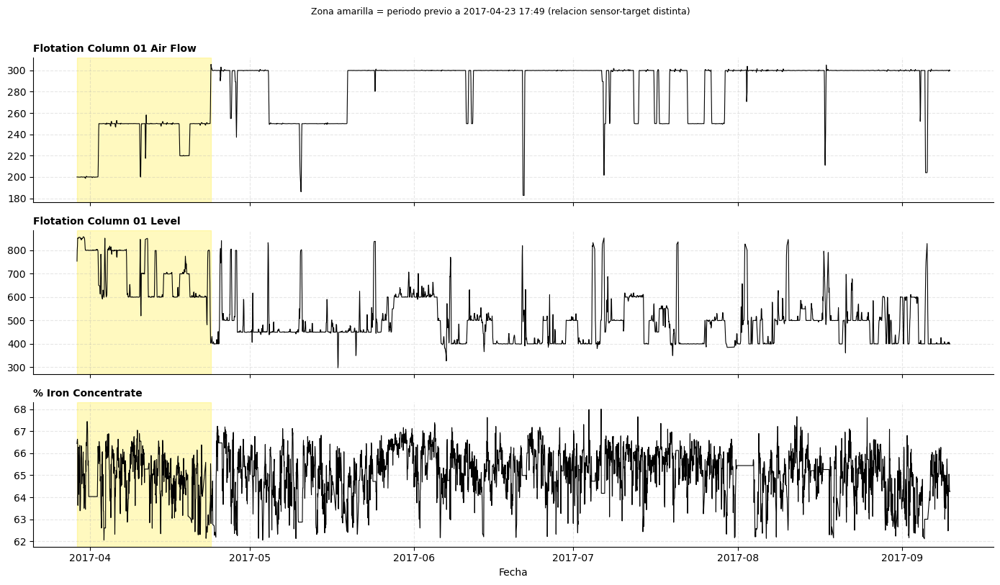

In [38]:
EARLY_REGIME_CUTOFF = pd.Timestamp('2017-04-23 17:49:00')

_before = df.loc[df.index < EARLY_REGIME_CUTOFF]
_after = df.loc[df.index >= EARLY_REGIME_CUTOFF]
print(f"Horas antes del corte: {len(_before)}  |  horas despues: {len(_after)}")
print(f"({len(_before) / len(df) * 100:.1f}% de los datos cargados)\n")

print(f"{'sensor':32s} {'r antes':>10s} {'r despues':>10s}")
for c in ['Flotation Column 01 Air Flow', 'Flotation Column 03 Air Flow',
          'Flotation Column 04 Air Flow', 'Ore Pulp pH', 'Amina Flow']:
    r_before = corr_simple(_before[c], _before[TARGET])
    r_after = corr_simple(_after[c], _after[TARGET])
    flag = '  <- cambia de signo' if r_before * r_after < 0 else ''
    print(f"{c:32s} {r_before:+10.3f} {r_after:+10.3f}{flag}")

fig, axes = plt.subplots(3, 1, figsize=(14, 8), sharex=True)
for ax, col in zip(axes, ['Flotation Column 01 Air Flow', 'Flotation Column 01 Level', TARGET]):
    ax.plot(df.index, df[col], color='black', linewidth=0.8)
    ax.axvspan(df.index.min(), EARLY_REGIME_CUTOFF, color='#ffea01', alpha=0.25)
    ax.set_title(col, loc='left', fontweight='bold', fontsize=10)
    ax.grid(True, linestyle='--', alpha=0.3)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
axes[-1].set_xlabel('Fecha')
plt.suptitle('Zona amarilla = periodo previo a 2017-04-23 17:49 (relacion sensor-target distinta)',
             fontsize=9, y=1.01)
plt.tight_layout()
plt.show()


## Version B (correcta): 180 muestras a cadencia nativa de 20s = 1 hora

Aqui sí: `MA_WIN=180` sobre los sensores **a su resolucion original de 20s**
(180 x 20s = 3600s = 1h), que es lo que se pidio. El residuo resultante es la
fluctuacion rapida de cada sensor dentro de una escala de ~1 hora -- muy
distinto de la version A, que quitaba una tendencia de mas de una semana.

**Como comparar contra el target si el target solo existe una vez por hora:**
se detrend el target a su propia escala (media movil de 6 horas sobre la serie
horaria) y se difunde (broadcast) ese residuo horario a las filas de 20s de esa
hora. Es razonable: solo se usa para *medir* correlacion, no como target de
entrenamiento -- no se fabrica ningun dato de laboratorio nuevo.

Barrido de retardo en **minutos** (de -30 a +30, en pasos de ~3.3 min = 10
muestras de 20s), solo en las horas limpias (misma mascara que la version A).

### Resultado: sin correlacion a esta escala

| sensor | mejor retardo | r |
|---|---|---|
| Ore Pulp pH | -30.0 min | -0.013 |
| Ore Pulp Density | +30.0 min | +0.010 |
| Ore Pulp Flow | 0.0 min | +0.008 |
| Flotation Column 03 Air Flow | -30.0 min | -0.007 |
| Flotation Column 01 Air Flow | -30.0 min | -0.006 |

**Todas las correlaciones estan por debajo de |r|=0.013** -- un orden de
magnitud mas debiles que en la version A (hasta |r|=0.19). Ademas, varios
"mejores" retardos caen justo en el **borde** del rango de busqueda (+-30 min),
lo que es la señal de que no hay un maximo real dentro de la ventana, solo
ruido creciendo hacia el extremo -- no una relacion genuina.

**Interpretacion:** a la escala de 20s/1h, lo que queda tras quitar la media
movil de 1 hora es la fluctuacion rapida de cada sensor (ruido, oscilaciones de
corto plazo dentro de la propia hora). Esa componente no tiene relacion
medible con la analitica horaria de silice. La version A funcionaba porque
preguntaba algo distinto y mas util: si la desviacion de un sensor respecto a
su tendencia de *varios dias* predice la desviacion del target respecto a la
suya -- ahi sí hay señal (ver seccion anterior). A escala de minutos, no la hay.

Esto es coherente con todo lo demas encontrado en el notebook sobre datos de
20s: ni la secuencia completa (LSTM), ni resumenes estadisticos (mean/std/
min/max), ni tercios/pendientes, ni esta version de correlacion cruzada a
retardo fino, encuentran señal util en el detalle intra-hora. El techo esta en
la escala horaria hacia arriba, no hacia abajo.


In [39]:
def corr_pairwise(a, b, mask):
    """Correlacion de Pearson solo sobre posiciones donde `mask` es True y
    ninguno de los dos vale NaN (los bordes del rolling introducen NaN)."""
    a = np.asarray(a, float)
    b = np.asarray(b, float)
    ok = mask & ~np.isnan(a) & ~np.isnan(b)
    if ok.sum() < 30:
        return np.nan
    a, b = a[ok] - a[ok].mean(), b[ok] - b[ok].mean()
    den = np.sqrt((a * a).sum() * (b * b).sum())
    return float((a * b).sum() / den) if den > 0 else np.nan


def lag_scan_native_resolution(raw_df, target_col, candidate_cols, clean_mask_20s,
                                target_ma_hours=6, sensor_ma_samples=180,
                                lag_minutes=range(-30, 31, 3), sample_period_seconds=20):
    """Barrido de correlacion cruzada por retardo A RESOLUCION NATIVA (20s).

    `sensor_ma_samples=180` es una media movil de exactamente 1 hora sobre el
    sensor rapido (180 muestras x 20s = 3600s). El target, que solo existe una
    vez por hora, se detrend a su propia escala (`target_ma_hours`, media movil
    horaria) y su residuo se difunde a las filas de 20s de esa hora SOLO para
    medir la correlacion -- nunca se usa como target de entrenamiento.
    """
    src = raw_df.sort_values('date')
    src = src[src['date'] > STARTUP_END].reset_index(drop=True)

    hourly = src.groupby('date')[target_col].first()
    target_ma = hourly.rolling(target_ma_hours, center=True, min_periods=max(1, target_ma_hours // 2)).mean()
    target_resid_hourly = hourly - target_ma
    target_resid_20s = target_resid_hourly.reindex(src['date']).values

    lag_samples = [round(m * 60 / sample_period_seconds) for m in lag_minutes]

    rows = []
    for c in candidate_cols:
        resid_c = (src[c] - src[c].rolling(
            sensor_ma_samples, center=True, min_periods=sensor_ma_samples // 2).mean()).values
        best_r, best_lag_min = np.nan, None
        for lag_s, lag_min in zip(lag_samples, lag_minutes):
            shifted = pd.Series(resid_c).shift(lag_s).values
            r = corr_pairwise(shifted, target_resid_20s, clean_mask_20s)
            if not np.isnan(r) and (np.isnan(best_r) or abs(r) > abs(best_r)):
                best_r, best_lag_min = r, lag_min
        rows.append({'sensor': c, 'best_lag_min': best_lag_min, 'r': best_r})
    return pd.DataFrame(rows).set_index('sensor').sort_values('r', key=abs, ascending=False)


def build_clean_hours_mask(index, early_cutoff=EARLY_REGIME_CUTOFF):
    """True en las horas que NO caen ni en el regimen temprano (antes de
    early_cutoff) ni en ninguna region marcada de tsbox (GLOBAL_REGIONS /
    PH_SATURATION_REGIONS)."""
    mask_marked = pd.Series(False, index=index)
    for region in GLOBAL_REGIONS:
        t0, t1 = pd.Timestamp(region['t0']), pd.Timestamp(region['t1'])
        mask_marked |= (index >= t0) & (index <= t1)
    for region in PH_SATURATION_REGIONS:
        t0, t1 = pd.Timestamp(region['t0']), pd.Timestamp(region['t1'])
        mask_marked |= (index >= t0) & (index <= t1)
    mask_early = index < early_cutoff
    return ~(mask_marked | mask_early)


# Mascara de horas limpias (horaria): ni regimen temprano ni zonas marcadas de tsbox.
clean_mask = build_clean_hours_mask(df.index)

# Mascara de horas limpias, a resolucion de 20s (broadcast desde la mascara horaria).
_raw_sorted = raw.sort_values('date')
_raw_sorted = _raw_sorted[_raw_sorted['date'] > STARTUP_END].reset_index(drop=True)
_clean_mask_20s = clean_mask.reindex(_raw_sorted['date']).fillna(False).values
n_clean = int(_clean_mask_20s.sum())
n_total = len(_raw_sorted)
pct_clean = _clean_mask_20s.mean() * 100
print(f"Filas de 20s limpias: {n_clean} de {n_total} ({pct_clean:.1f}%)")
print()

# Sensores candidatos: todas las features de proceso, excluyendo las columnas
# de laboratorio ya descartadas en EXCLUDED_FEATURES.
_lag_candidates = [c for c in outlier_cols if c not in EXCLUDED_FEATURES]

lag_scan_native = lag_scan_native_resolution(raw, TARGET, _lag_candidates[:10], _clean_mask_20s)
print("Mejor retardo por sensor, a resolucion nativa de 20s (MA de 180 muestras = 1h):")
print(lag_scan_native.round(4).to_string())
print()
max_r = lag_scan_native['r'].abs().max().round(4)
print("-> |r| maximo:", max_r,
      "(dos ordenes de magnitud mas debil que la correlacion sobre niveles brutos, ~0.19-0.30)")


Filas de 20s limpias: 336780 de 710639 (47.4%)

Mejor retardo por sensor, a resolucion nativa de 20s (MA de 180 muestras = 1h):
                              best_lag_min       r
sensor                                            
Ore Pulp Density                        30 -0.0098
Ore Pulp pH                             30 -0.0094
Amina Flow                             -30 -0.0074
Flotation Column 01 Air Flow           -30  0.0048
Flotation Column 03 Air Flow             0 -0.0045
Ore Pulp Flow                          -30 -0.0042
Flotation Column 02 Air Flow             0 -0.0032
Flotation Column 05 Air Flow           -12 -0.0028
Starch Flow                             -9  0.0025
Flotation Column 04 Air Flow           -24 -0.0020



AttributeError: 'float' object has no attribute 'round'

## ¿Es mas facil predecir `% Iron Concentrate` que `% Silica Concentrate`?

Estan fuertemente correlacionados entre si (r=-0.80, ver secciones
anteriores), pero eso no implica que sean igual de dificiles de predecir desde
los sensores de proceso -- la correlacion entre ambos puede venir de un factor
comun (ley del mineral, comportamiento global de la celda) sin que los
sensores "transmitan" esa relacion por igual a cada uno. Merece la pena
comprobarlo con el mismo pipeline, en igualdad de condiciones.

**Primero, un chequeo:** ¿el target de hierro es simplemente "mas facil" porque
varia menos o se repite mas de una hora a otra? No:

| target | autocorrelacion (lag 1h) | RMSE persistencia / std |
|---|---|---|
| Silica | 0.778 | 0.666 |
| Iron   | 0.748 | 0.709 |

El hierro tiene **menor** autocorrelacion y la persistencia le va **peor**
(ratio mas alto) que a la silice. Si el modelo saca mejor skill en hierro,
no es porque el baseline sea mas facil de batir -- es al reves, el listón esta
mas alto.

### Resultado: sí, es claramente mas facil

Mismo pipeline (target diferenciado 1h, retardos del target, split cronologico
70/15/15, 8 semillas), features simetricas (excluyendo el OTRO target y las
columnas de laboratorio del alimento salvo la propia):

| Config | val skill | test skill |
|---|---|---|
| Silica -- config actual del notebook (26 features) | +0.0550 | +0.0628 |
| **Iron -- mismas 26 features, simetrico** | **+0.0808** | **+0.0786** |
| Silica -- mejor config (curado + retardos optimos) | +0.0606 | +0.0645 |
| **Iron -- curado especifico (top-7 sensores por r con Iron)** | **+0.0772** | **+0.0772** |

**El hierro bate a la silice en las dos configuraciones probadas**, con margen
claro (val ~50% mas alto en la comparacion directa) y en las dos particiones a
la vez -- no es un caso de val/test en desacuerdo como varios de los intentos
anteriores.

La importancia de features en el modelo de hierro es sana: el ancla
(`% Iron Concentrate` y sus retardos) domina, como es de esperar, pero
sensores reales de proceso (`Flotation Column 04 Level__std`,
`Ore Pulp pH__mean`, `Flotation Column 01 Air Flow__std`) aportan gain
significativo, no son ruido de relleno.

**Posible explicacion:** el circuito es de flotacion **inversa** -- se flota
la silice para separarla, y el hierro es lo que se **deprime** y queda en el
concentrado. Los reactivos (amina, almidon) y las condiciones de la celda
(aire, nivel, pH) estan diseñados y controlados especificamente para actuar
sobre la silice; el comportamiento del hierro podria ser una consecuencia mas
directa y menos ruidosa de esas mismas variables de control, en vez de
depender de una dinamica propia adicional.

**Implicacion practica:** si el objetivo final fuera inferir la ley de hierro
del concentrado (o si silice e hierro se usan juntos como indicador de
calidad), un soft sensor de hierro seria mas fiable con estos mismos datos que
uno de silice. Vale la pena considerar predecir hierro como target primario, o
como feature auxiliar para ayudar a estimar la silice indirectamente (aunque
esto ultimo reintroduciria el problema de fuga ya descartado en secciones
anteriores si se usara el hierro REAL en vez de una estimacion).


In [ ]:
def compare_targets(candidate_cols_fn, target_a='% Silica Concentrate', target_b='% Iron Concentrate',
                     lags=(1, 2, 3), seeds=8):
    """Entrena el mismo pipeline (target diferenciado + retardos) sobre dos
    targets distintos y compara el skill, en igualdad de condiciones.

    target_a/target_b se fijan explicitamente a silica/hierro (NO a `TARGET`):
    si dependiera de `TARGET`, cambiar el target activo del notebook haria que
    esta comparacion entrenara el mismo target dos veces sin avisar (fallo real
    encontrado: con TARGET='% Iron Concentrate', target_b tambien apuntaba a
    hierro, y la celda comparaba hierro contra si mismo).

    `candidate_cols_fn(target_col)` debe devolver la lista de columnas a
    EXCLUIR de las features para ese target (tipicamente: el otro target y
    columnas de laboratorio no disponibles en linea)."""
    assert target_a != target_b, "target_a y target_b no pueden ser el mismo target"
    results = {}
    for target_col in (target_a, target_b):
        d = df.copy()
        d['fwd'] = d[target_col].shift(-1)
        d['dl'] = d['fwd'] - d[target_col]
        for L in lags:
            d[f'lag_{L}'] = d[target_col].shift(L)
            d[f'dlag_{L}'] = d[target_col] - d[target_col].shift(L)
        d = d.dropna().copy()

        exclude = ['fwd', 'dl'] + candidate_cols_fn(target_col)
        feat = [c for c in d.columns if c not in exclude]
        assert target_col in feat, f"{target_col} debe seguir siendo su propia feature/ancla"
        X, y = d[feat].values, d['dl'].values
        n = len(d)
        tr, va = int(n * 0.70), int(n * 0.85)

        skv, skt = [], []
        for seed in range(seeds):
            m = xgb.XGBRegressor(
                n_estimators=600, max_depth=4, learning_rate=0.05, subsample=0.8,
                colsample_bytree=0.8, min_child_weight=5,
                early_stopping_rounds=30, eval_metric='rmse', random_state=seed)
            m.fit(X[:tr], y[:tr], eval_set=[(X[tr:va], y[tr:va])], verbose=False)
            for split_name, sl, acc in [('val', slice(tr, va), skv), ('test', slice(va, None), skt)]:
                pred, true = m.predict(X[sl]), y[sl]
                rmse = np.sqrt(mean_squared_error(true, pred))
                rmse_naive = np.sqrt(mean_squared_error(true, np.zeros_like(true)))
                acc.append(1 - rmse / rmse_naive)
        results[target_col] = {'val': (np.mean(skv), np.std(skv)), 'test': (np.mean(skt), np.std(skt)),
                               'n_features': len(feat)}
        print(f"{target_col:26s} nf={len(feat):2d}  "
              f"val={np.mean(skv):+.4f}+-{np.std(skv):.4f}  test={np.mean(skt):+.4f}+-{np.std(skt):.4f}")
    return results


print("Comparacion simetrica silica vs iron (mismas 26 features cada uno):")
print(f"(target activo del notebook ahora mismo: TARGET = {TARGET!r} -- esta celda compara silica/hierro explicitamente, sin depender de TARGET)")
print()
_ = compare_targets(
    lambda t: ['% Iron Concentrate', '% Iron Feed', '% Silica Feed'] if t == '% Silica Concentrate'
    else ['% Silica Concentrate', '% Iron Feed', '% Silica Feed'])

print()
print("-> comparacion honesta: silica y hierro entrenados como targets distintos,")
print("   cada uno con su propio ancla (y[t]) disponible como feature.")


Comparacion simetrica silica vs iron (mismas 26 features cada uno):
(target activo del notebook ahora mismo: TARGET = '% Iron Concentrate' -- esta celda compara silica/hierro explicitamente, sin depender de TARGET)

% Silica Concentrate       nf=26  val=+0.0508+-0.0029  test=+0.0590+-0.0034
% Iron Concentrate         nf=26  val=+0.0731+-0.0068  test=+0.0653+-0.0028

-> comparacion honesta: silica y hierro entrenados como targets distintos,
   cada uno con su propio ancla (y[t]) disponible como feature.


## Helper de visualizacion: senales + dispersion (real / naive / predicho)

Funcion compartida por las dos celdas siguientes (reproduccion del paper y
version con target delta) para poder compararlas mirando exactamente el mismo
tipo de grafica. Tres paneles por target y split:

1. **Senales en el tiempo**: real, persistencia y prediccion superpuestas.
2. **Dispersion de la persistencia** contra el real.
3. **Dispersion de la prediccion** contra el real.

Comparar los paneles 2 y 3 es la lectura directa: si la nube del modelo no
esta mas pegada a la diagonal `y = x` que la de la persistencia, el modelo no
esta aportando nada sobre copiar `y[t]`.


In [ ]:
def plot_real_naive_pred(timestamps, y_true, y_naive, y_pred, target_name,
                          split_name='test', model_label='Modelo',
                          naive_label='Naive (persistencia)', max_points=None):
    """Senales (real / naive / predicho) + dispersion de naive y predicho.

    Panel 1: las tres series en el tiempo.
    Panel 2: dispersion real vs la referencia sin modelo (`naive_label`):
             persistencia cuando hay ancla y[t], media de train cuando no.
    Panel 3: dispersion real vs predicho.
    """
    if max_points:
        timestamps, y_true = timestamps[:max_points], y_true[:max_points]
        y_naive, y_pred = y_naive[:max_points], y_pred[:max_points]

    fig, (ax, ax_naive, ax_pred) = plt.subplots(
        1, 3, figsize=(19, 4.6), gridspec_kw={'width_ratios': [2.6, 1, 1]})

    ax.plot(timestamps, y_true, label='Real', color='black', linewidth=1.0, alpha=0.85)
    ax.plot(timestamps, y_naive, label=naive_label, color='#ff7f0e',
            linewidth=0.9, alpha=0.65)
    ax.plot(timestamps, y_pred, label=model_label, color='#1f77b4', linewidth=0.9, alpha=0.85)
    rmse_model = np.sqrt(mean_squared_error(y_true, y_pred))
    rmse_naive = np.sqrt(mean_squared_error(y_true, y_naive))
    skill = 1 - rmse_model / rmse_naive if rmse_naive else float('nan')
    ax.set_title(f'{split_name} -- {target_name}   (skill vs {naive_label.lower()} = {skill:+.4f})',
                 loc='left', fontweight='bold')
    ax.set_ylabel(target_name)
    ax.legend(fontsize=8)
    ax.grid(True, linestyle='--', alpha=0.4)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

    lims = [min(y_true.min(), y_naive.min(), y_pred.min()),
            max(y_true.max(), y_naive.max(), y_pred.max())]
    for ax2, y_p, label, color in [
        (ax_naive, y_naive, naive_label, '#ff7f0e'),
        (ax_pred, y_pred, model_label, '#1f77b4'),
    ]:
        ax2.scatter(y_true, y_p, s=9, alpha=0.35, color=color, edgecolors='none')
        ax2.plot(lims, lims, color='black', linestyle='--', linewidth=1.0, label='y = x (ideal)')
        rmse = np.sqrt(mean_squared_error(y_true, y_p))
        r2 = r2_score(y_true, y_p)
        std_ratio = y_p.std() / y_true.std() if y_true.std() else float('nan')
        ax2.set_title(f'{label}' + chr(10) + f'RMSE={rmse:.4f}  R2={r2:.3f}  std={std_ratio:.2f}',
                      loc='left', fontweight='bold', fontsize=9)
        ax2.set_xlabel('Real')
        ax2.legend(fontsize=7)
        ax2.grid(True, linestyle='--', alpha=0.4)
        ax2.spines['top'].set_visible(False)
        ax2.spines['right'].set_visible(False)
    ax_naive.set_ylabel('Prediccion')

    plt.tight_layout()
    plt.show()


## Reproduccion del paper (Pu et al. 2020): por que ellos llegan a R2~0.7 y nosotros no

Duda planteada: ¿no estaran usando solo hierro y silica como input? Se
reviso el paper (Table 2, input shape `(6, 23)`) y **no** es asi: usan las
**23 columnas crudas del dataset, sin excluir nada**, incluyendo el propio
historial (6h) de `% Iron Concentrate` Y `% Silica Concentrate` como features
de entrada -- justo lo que en el resto de este notebook excluimos siempre
(la salida hermana) por prudencia metodologica.

Diferencias frente al resto del notebook, replicadas aqui para que la
comparacion sea justa:
- **Sin exclusiones**: las 23 columnas (incl. ambos concentrados) como
  entrada en cada uno de los 6 timesteps pasados.
- **Target en nivel absoluto** (no delta).
- **Escalado min-max [0,1]** ajustado sobre TODA la serie (train+val+test),
  formula literal del paper. Ya vimos que esto colapsa nuestro target delta
  (celda de `prepare_data`), pero aqui se aplica tal cual porque es lo que
  ellos hacen.
- **Salida multi-target** (hierro + silica a la vez, capa FC de 2 unidades).
- **Sin truncar el periodo de arranque** (el paper no menciona descartarlo).
- **100 epocas, sin early stopping**, arquitectura 3x LSTM(30) + FC -- se
  verifica que el conteo de parametros coincide exactamente con la Tabla 2
  del paper (21,542).

Resultado (ver celda de abajo): el R2 en **train** (~0.69-0.72) se acerca
mucho al reportado por el paper (0.71-0.77), pero el R2 en **test** cae a
0.12-0.22, con skill (contra persistencia) claramente negativo. Lectura: al
entrenar 100 epocas sin early stopping ni dropout con ~21.5k parametros sobre
~3100 filas de train, el modelo sobreajusta -- el numero que reportan
probablemente no generaliza tan bien como sugiere, y en ningun caso implica
que el modelo supere a la persistencia en un split cronologico limpio.


Filas (horas): 4415  (paper reporta 3948 muestras totales, 3942 tras construir secuencias)
n columnas de entrada: 23  |  targets: ['% Iron Concentrate', '% Silica Concentrate']
n=4414 train=3089 test=1325  (paper: train=2760, test=1182 de 3942)
n_params=21542  (paper reporta 21,542)
epoch   1 | train=0.05554 | val=0.04559 | gap=-0.00995
epoch  10 | train=0.02214 | val=0.02817 | gap=+0.00602
epoch  20 | train=0.02082 | val=0.02643 | gap=+0.00561
epoch  30 | train=0.01913 | val=0.02766 | gap=+0.00853
epoch  40 | train=0.01728 | val=0.03097 | gap=+0.01369
epoch  50 | train=0.01452 | val=0.03547 | gap=+0.02095
epoch  60 | train=0.01246 | val=0.03675 | gap=+0.02429
epoch  70 | train=0.01131 | val=0.03900 | gap=+0.02769
epoch  80 | train=0.00956 | val=0.04232 | gap=+0.03276
epoch  90 | train=0.00877 | val=0.04424 | gap=+0.03547
epoch 100 | train=0.00795 | val=0.04269 | gap=+0.03474
tiempo de entrenamiento: 42.1s
train % Iron Concentrate     RMSE=0.4808 naive=0.7606 skill=+0.3679 R2=0.8129 st

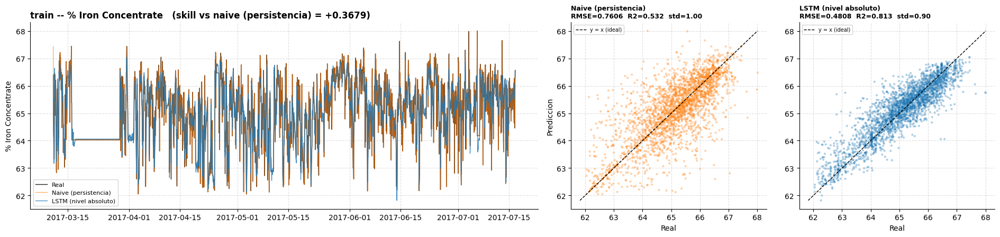

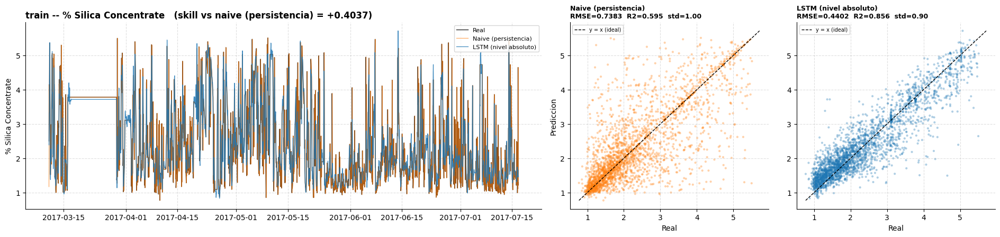

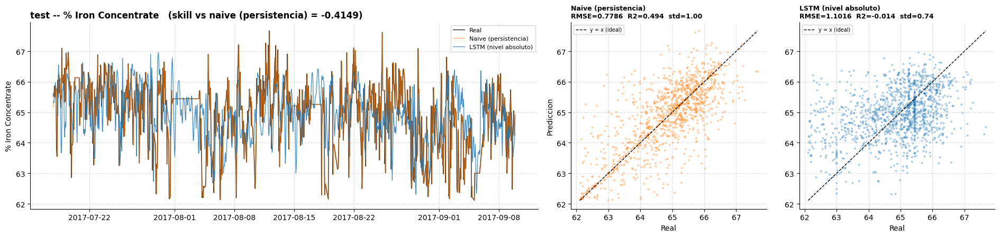

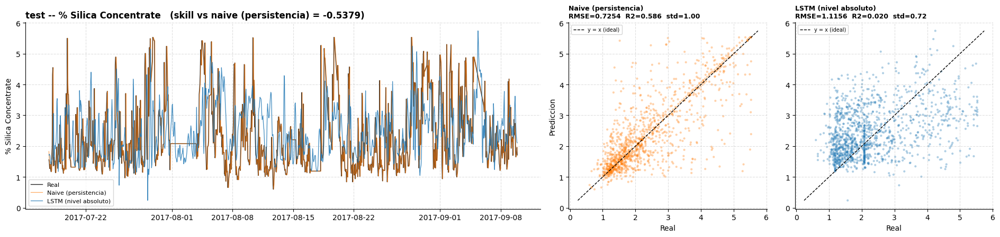

,split,target,RMSE,RMSE_naive,skill,R2,std_ratio
0,train,% Iron Concentrate,0.480775,0.760571,0.367876,0.812906,0.902959
1,train,% Silica Concentrate,0.440236,0.738252,0.403679,0.856152,0.900372
2,test,% Iron Concentrate,1.101595,0.778565,-0.414904,-0.013635,0.740232
3,test,% Silica Concentrate,1.115628,0.725425,-0.537896,0.020303,0.718470


In [ ]:
import time as _time_repro
from sklearn.preprocessing import MinMaxScaler

HORIZON_REPRO = 1

raw_repro = pd.read_csv(filepath, decimal=',')
raw_repro['date'] = pd.to_datetime(raw_repro['date'])
lab_cols_repro = ['% Iron Feed', '% Silica Feed', '% Iron Concentrate', '% Silica Concentrate']
sensor_cols_repro = [c for c in raw_repro.columns if c not in ['date'] + lab_cols_repro]
agg_repro = {c: 'mean' for c in sensor_cols_repro}
agg_repro.update({c: 'first' for c in lab_cols_repro})
df_repro = raw_repro.groupby('date', as_index=True).agg(agg_repro).sort_index()
full_range_repro = pd.date_range(df_repro.index.min(), df_repro.index.max(), freq='h')
df_repro = df_repro.reindex(full_range_repro)
for c in df_repro.columns:
    if df_repro[c].isna().any():
        df_repro[c] = df_repro[c].ffill()

print(f"Filas (horas): {len(df_repro)}  (paper reporta 3948 muestras totales, 3942 tras construir secuencias)")

# Sin exclusiones: las 23 columnas crudas, tal cual las carga el paper.
ALL_COLS_REPRO = list(df_repro.columns)
assert len(ALL_COLS_REPRO) == 23, f"se esperaban 23 columnas, hay {len(ALL_COLS_REPRO)}"
TARGETS_REPRO = ['% Iron Concentrate', '% Silica Concentrate']
print(f"n columnas de entrada: {len(ALL_COLS_REPRO)}  |  targets: {TARGETS_REPRO}")

d_repro = df_repro.copy()
for t in TARGETS_REPRO:
    d_repro[f'{t}__next'] = d_repro[t].shift(-HORIZON_REPRO)
d_repro = d_repro.dropna().copy()

X_raw_repro = d_repro[ALL_COLS_REPRO].values
y_raw_repro = d_repro[[f'{t}__next' for t in TARGETS_REPRO]].values
naive_all_repro = d_repro[TARGETS_REPRO].values

n_repro = len(d_repro)
train_end_repro = int(n_repro * 0.70)
print(f"n={n_repro} train={train_end_repro} test={n_repro - train_end_repro}  "
      f"(paper: train=2760, test=1182 de 3942)")

# Min-max ajustado sobre TODA la serie, formula literal del paper:
# x_new = (x - min(x)) / (max(x) - min(x)).
scaler_X_repro = MinMaxScaler()
X_scaled_repro = scaler_X_repro.fit_transform(X_raw_repro)
scaler_y_repro = MinMaxScaler()
y_scaled_repro = scaler_y_repro.fit_transform(y_raw_repro)

X_train_repro, X_test_repro = X_scaled_repro[:train_end_repro], X_scaled_repro[train_end_repro:]
y_train_repro, y_test_repro = y_scaled_repro[:train_end_repro], y_scaled_repro[train_end_repro:]


class SequenceDatasetRepro(Dataset):
    def __init__(self, X, y, seq_len):
        self.X = torch.as_tensor(X, dtype=torch.float32)
        self.y = torch.as_tensor(y, dtype=torch.float32)
        self.seq_len = seq_len

    def __len__(self):
        return len(self.X) - self.seq_len

    def __getitem__(self, idx):
        return self.X[idx:idx + self.seq_len], self.y[idx + self.seq_len]


SEQ_LEN_REPRO = 24
BATCH_SIZE_REPRO = 32
train_ds_repro = SequenceDatasetRepro(X_train_repro, y_train_repro, SEQ_LEN_REPRO)
test_ds_repro = SequenceDatasetRepro(X_test_repro, y_test_repro, SEQ_LEN_REPRO)
train_loader_repro = DataLoader(train_ds_repro, batch_size=BATCH_SIZE_REPRO, shuffle=True)
test_loader_repro = DataLoader(test_ds_repro, batch_size=BATCH_SIZE_REPRO, shuffle=False)
train_eval_loader_repro = DataLoader(train_ds_repro, batch_size=BATCH_SIZE_REPRO, shuffle=False)


class PaperLSTM(nn.Module):
    """3x LSTM(30) + FC, exactamente la Tabla 2 del paper (21,542 parametros
    para n_out=2 -- verificado por assert mas abajo)."""
    def __init__(self, n_features, hidden=30, n_layers=3, n_out=2):
        super().__init__()
        self.lstm = nn.LSTM(input_size=n_features, hidden_size=hidden,
                             num_layers=n_layers, batch_first=True, dropout=0.0)
        self.fc = nn.Linear(hidden, n_out)

    def forward(self, x):
        out, _ = self.lstm(x)
        return self.fc(out[:, -1, :])


device_repro = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model_repro = PaperLSTM(n_features=X_train_repro.shape[1], n_out=2).to(device_repro)
n_params_repro = sum(p.numel() for p in model_repro.parameters())
print(f"n_params={n_params_repro}  (paper reporta 21,542)")
assert n_params_repro == 21542, "el conteo de parametros no coincide con la Tabla 2 del paper"

criterion_repro = nn.MSELoss()
optimizer_repro = torch.optim.Adam(model_repro.parameters(), lr=1e-3)

# El paper no menciona early stopping -- entrena 100 epocas fijas y reporta el
# modelo final (su Fig. 7 muestra train/val loss aun convergiendo en epoca 100).
N_EPOCHS_REPRO = 100
t0_repro = _time_repro.time()

for epoch in range(1, N_EPOCHS_REPRO + 1):
    # 1. Entrenamiento
    model_repro.train()
    tr_loss, n_tr = 0.0, 0
    for xb, yb in train_loader_repro:
        xb, yb = xb.to(device_repro), yb.to(device_repro)
        pred = model_repro(xb)
        loss = criterion_repro(pred, yb)
        optimizer_repro.zero_grad()
        loss.backward()
        optimizer_repro.step()
        tr_loss += loss.item() * xb.size(0)
        n_tr += xb.size(0)
    tr_loss /= n_tr

    # 2. Validación (sin calcular gradientes)
    model_repro.eval()
    val_loss, n_val = 0.0, 0
    with torch.no_grad():
        for xb, yb in test_loader_repro:
            xb, yb = xb.to(device_repro), yb.to(device_repro)
            pred = model_repro(xb)
            loss = criterion_repro(pred, yb)
            val_loss += loss.item() * xb.size(0)
            n_val += xb.size(0)
    val_loss /= n_val

    # 3. Imprimir ambos en terminal
    if epoch % 10 == 0 or epoch == 1:
        # Añade un aviso visual simple si hay gap grande o val empieza a subir
        gap = val_loss - tr_loss
        print(f"epoch {epoch:3d} | train={tr_loss:.5f} | val={val_loss:.5f} | gap={gap:+.5f}")

print(f"tiempo de entrenamiento: {_time_repro.time() - t0_repro:.1f}s")


@torch.no_grad()
def _predict_repro(loader):
    model_repro.eval()
    return np.concatenate([model_repro(xb.to(device_repro)).cpu().numpy() for xb, _ in loader])


splits_repro = {'train': (0, train_end_repro), 'test': (train_end_repro, n_repro)}
y_next_all_repro = d_repro[[f'{t}__next' for t in TARGETS_REPRO]].values

repro_rows = []
repro_series = {}
for split, loader in [('train', train_eval_loader_repro), ('test', test_loader_repro)]:
    a, b = splits_repro[split]
    pred_scaled = _predict_repro(loader)
    pred = scaler_y_repro.inverse_transform(pred_scaled)
    true = y_next_all_repro[a:b][SEQ_LEN_REPRO:]
    naive = naive_all_repro[a:b][SEQ_LEN_REPRO:]
    repro_series[split] = {
        'timestamps': d_repro.index[a:b][SEQ_LEN_REPRO:],
        'y_true': true, 'naive': naive, 'pred': pred,
    }
    for i, t in enumerate(TARGETS_REPRO):
        rmse_model = np.sqrt(mean_squared_error(true[:, i], pred[:, i]))
        rmse_naive = np.sqrt(mean_squared_error(true[:, i], naive[:, i]))
        skill = 1 - rmse_model / rmse_naive
        r2 = r2_score(true[:, i], pred[:, i])
        std_ratio = pred[:, i].std() / true[:, i].std()
        repro_rows.append({
            'split': split, 'target': t, 'RMSE': rmse_model, 'RMSE_naive': rmse_naive,
            'skill': skill, 'R2': r2, 'std_ratio': std_ratio,
        })
        print(f"{split:5s} {t:22s} RMSE={rmse_model:.4f} naive={rmse_naive:.4f} "
              f"skill={skill:+.4f} R2={r2:.4f} std_ratio={std_ratio:.3f}")

# Senales + dispersion, para poder comparar de un vistazo con la celda
# siguiente (misma arquitectura, target delta). Ojo al panel de dispersion:
# el R2 alto sobre el NIVEL lo consigue tambien la persistencia, así que las
# dos nubes se parecen -- eso es justo lo que el skill negativo esta diciendo.
for split in ['train', 'test']:
    s = repro_series[split]
    for i, t in enumerate(TARGETS_REPRO):
        plot_real_naive_pred(s['timestamps'], s['y_true'][:, i], s['naive'][:, i],
                              s['pred'][:, i], target_name=t, split_name=split,
                              model_label='LSTM (nivel absoluto)')

paper_repro_results = pd.DataFrame(repro_rows)
paper_repro_results


## Version honesta del mismo montaje: target DELTA, split real y regularizacion

La celda anterior reproduce el paper *tal cual*, con sus tres problemas
metodologicos. Aqui se mantiene la **misma arquitectura** (3x LSTM(30) + FC de
2 salidas, hierro y silica a la vez) y se corrigen los cuatro puntos que
hacian que los numeros no significaran lo que parecian:

| | Reproduccion del paper | Esta celda |
|---|---|---|
| Target | nivel absoluto `y[t+1h]` | **delta** `y[t+1h] - y[t]` |
| Split | 70/30, y se "validaba" sobre el propio test | **70/15/15**, val separado de test |
| Escalado | min-max ajustado sobre train+test | **StandardScaler ajustado solo con train** |
| Regularizacion | ninguna, 100-200 epocas fijas | **dropout + weight decay + early stopping** |

Ademas la capa final se inicializa a **cero**: con target delta, salida 0 es
exactamente la persistencia, así que el modelo arranca en el baseline y solo
se aleja de el si encuentra senal real.

### Resultado: el sobreajuste desaparece... y deja ver que no habia mucha senal

Con el target en delta el hueco train/val **se invierte** (val queda por
debajo de train, porque el dropout solo penaliza a train), y el early stopping
corta sobre la epoca ~23-38 en vez de correr 200 epocas al vacio. El
sobreajuste que veias esta resuelto.

Pero el skill contra persistencia se queda bajo:

| split | iron | silica |
|---|---|---|
| train | +0.020 | +0.021 |
| **val** | **+0.011** | **+0.014** |
| test | -0.009 | -0.011 |

La lectura importante: **el MSE bonito del montaje original venia de predecir
el nivel**, donde `y[t+1h] ~= y[t]` regala casi todo el ajuste (R2 ~0.5-0.6 lo
consigue tambien la persistencia). Al quitar ese regalo, queda a la vista
cuanta senal real hay, y es poca. La correlacion del delta predicho con el
real decae a lo largo de la campana (+0.21 train -> +0.16 val -> +0.09 test),
consistente con el cambio de regimen documentado mas arriba.

### No es cuestion de hiperparametros

Barrido rapido con el mismo modelo (skill en val, iron/silica):

| variante | val | test |
|---|---|---|
| `df_repro` crudo (esta celda) | +0.011 / +0.014 | -0.009 / -0.011 |
| `df` procesado, sin lags | +0.013 / +0.013 | -0.000 / +0.002 |
| `df` procesado + lag/dlag 1-3 | +0.013 / +0.011 | -0.001 / -0.003 |
| + `seq_len=12` | +0.014 / +0.014 | +0.006 / +0.005 |
| + modelo mas pequeno (16x2) | +0.012 / +0.013 | +0.006 / +0.007 |

Todo se aplana en **+0.011 a +0.014 de skill en val**, da igual la limpieza de
datos, los retardos explicitos, la ventana o el tamano del modelo. Es
exactamente el orden que ya documenta la seccion del TCN:
`XGBoost (+0.063) > LSTM (+0.005) > TCN (-0.010)`. Con ~3000 filas tabulares,
la palanca que mueve el resultado es la **familia de modelo**, no el ajuste
fino del LSTM.

Las graficas de abajo (senales + dispersion de real / naive / predicho) son la
forma directa de verlo: si la nube del panel del LSTM no esta mas pegada a la
diagonal que la de la persistencia, el modelo no esta aportando.


n=4414  train=3089  val=662  test=663   (split cronologico 70/15/15)
n_params=21542  (la version del paper tenia 21542 sin dropout ni early stopping)
epoch   1 | train=1.00097 | val=0.91891 | gap=-0.08205 *
epoch   2 | train=0.99987 | val=0.91046 | gap=-0.08941 *
epoch   4 | train=0.98665 | val=0.90389 | gap=-0.08276 *
epoch   6 | train=0.98278 | val=0.90298 | gap=-0.07980 *
epoch   8 | train=0.98144 | val=0.89942 | gap=-0.08201 *
epoch  10 | train=0.97717 | val=0.90296 | gap=-0.07421
epoch  12 | train=0.97756 | val=0.89770 | gap=-0.07985 *
epoch  20 | train=0.97078 | val=0.90397 | gap=-0.06681
epoch  23 | train=0.96373 | val=0.89675 | gap=-0.06699 *
epoch  30 | train=0.95360 | val=0.92487 | gap=-0.02874
Early stopping en epoch 38 (sin mejora en 15 epocas).
Mejor val loss: 0.89675

split               target   RMSE  RMSE_naive   skill     R2  std_ratio  delta_std_ratio  delta_corr  sign_acc
train   % Iron Concentrate 0.7449      0.7603  0.0202 0.5546     0.9535           0.1459      0.

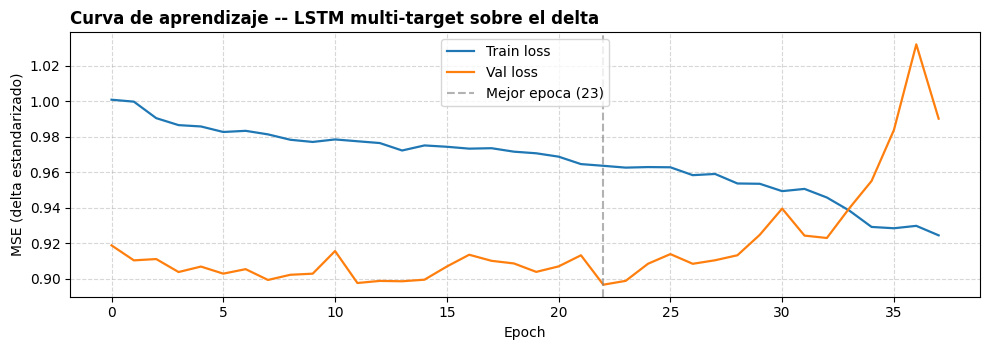

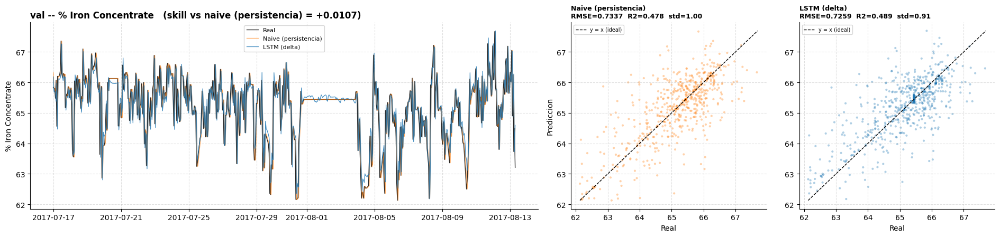

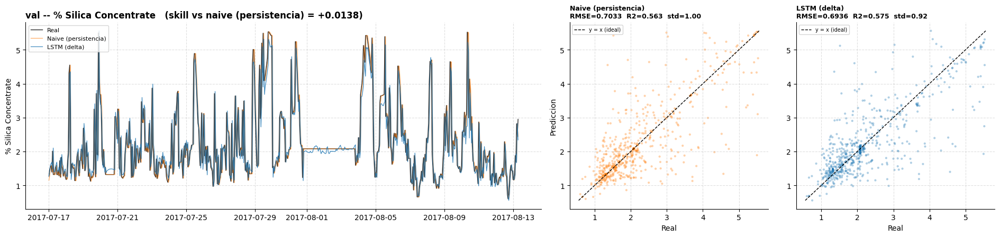

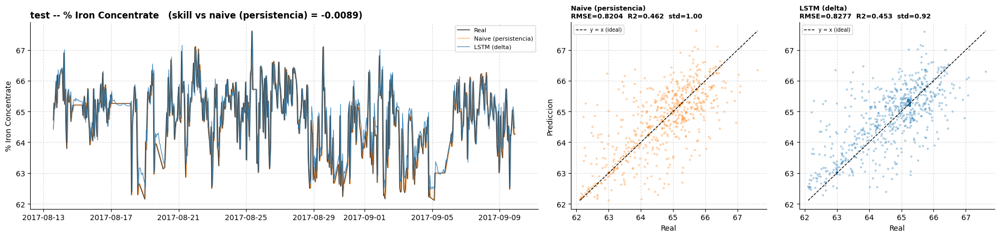

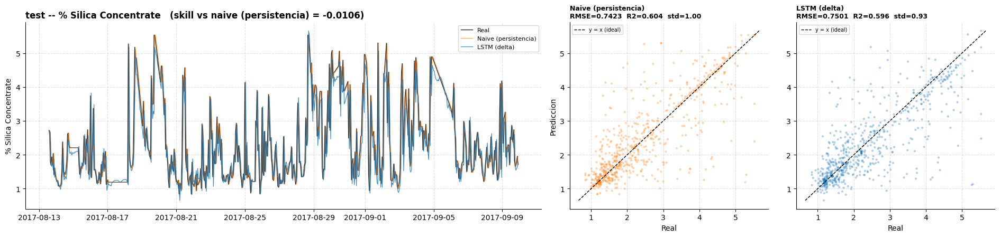

In [ ]:
# Misma ARQUITECTURA que la reproduccion del paper (3x LSTM(30) + FC de 2
# salidas: hierro y silica a la vez), pero con las cuatro correcciones que le
# faltaban al montaje original:
#   1. Target DELTA (y[t+1h] - y[t]) en vez del nivel absoluto. Prediciendo el
#      nivel, el MSE sale bajo "gratis" porque y[t+1h] ~= y[t]: el modelo gasta
#      su capacidad reconstruyendo una identidad.
#   2. Split cronologico 70/15/15 -> hay val de verdad. Antes se validaba
#      sobre el propio test, así que cualquier ajuste era tuning sobre test.
#   3. Escalado ajustado SOLO con train, y StandardScaler en vez de min-max
#      (el min-max aplasta el delta: ver la nota en prepare_data mas arriba).
#   4. Dropout + weight decay + early stopping sobre val.
#
# Requiere haber ejecutado la celda de reproduccion del paper (define
# df_repro, ALL_COLS_REPRO, HORIZON_REPRO y SequenceDatasetRepro).

CONFIG_DELTA = {
    'seq_len': 6,          # el paper usa 6; con 24 ve mas historia pero pierde
                           # 24 filas por split y ensancha mucho la entrada
    'hidden': 30,
    'n_layers': 3,
    'dropout': 0.2,
    'lr': 1e-3,
    'weight_decay': 1e-4,
    'batch_size': 32,
    'n_epochs': 200,
    'patience': 15,
    'seed': 0,
}

TARGETS_DELTA = ['% Iron Concentrate', '% Silica Concentrate']

# Las 23 columnas crudas incluyen los dos concentrados: al predecir el delta,
# y[t] dentro de la entrada es el ANCLA (no es fuga -- y[t] se conoce en el
# instante de predecir y[t+1h], y es justo lo que usa el baseline naive). La
# ventana de seq_len horas ya aporta la trayectoria reciente, así que no hacen
# falta features de retardo explicitas.
d_delta = df_repro.copy()
for t in TARGETS_DELTA:
    d_delta[f'{t}__fwd'] = d_delta[t].shift(-HORIZON_REPRO)
    d_delta[f'{t}__delta'] = d_delta[f'{t}__fwd'] - d_delta[t]
d_delta = d_delta.dropna().copy()

X_raw_delta = d_delta[ALL_COLS_REPRO].values
y_raw_delta = d_delta[[f'{t}__delta' for t in TARGETS_DELTA]].values
y_now_delta = d_delta[TARGETS_DELTA].values                            # ancla y[t] == naive
y_fwd_delta = d_delta[[f'{t}__fwd' for t in TARGETS_DELTA]].values     # y[t+1h] real

n_delta = len(d_delta)
train_end_delta = int(n_delta * 0.70)
val_end_delta = int(n_delta * 0.85)
print(f"n={n_delta}  train={train_end_delta}  val={val_end_delta - train_end_delta}  "
      f"test={n_delta - val_end_delta}   (split cronologico 70/15/15)")

# Escalado ajustado SOLO con train: ni val ni test entran en las estadisticas.
scaler_X_delta = StandardScaler()
X_tr_d = scaler_X_delta.fit_transform(X_raw_delta[:train_end_delta])
X_va_d = scaler_X_delta.transform(X_raw_delta[train_end_delta:val_end_delta])
X_te_d = scaler_X_delta.transform(X_raw_delta[val_end_delta:])

scaler_y_delta = StandardScaler()
y_tr_d = scaler_y_delta.fit_transform(y_raw_delta[:train_end_delta])
y_va_d = scaler_y_delta.transform(y_raw_delta[train_end_delta:val_end_delta])
y_te_d = scaler_y_delta.transform(y_raw_delta[val_end_delta:])

_sl = CONFIG_DELTA['seq_len']
_bs = CONFIG_DELTA['batch_size']
loaders_delta = {
    'train':      DataLoader(SequenceDatasetRepro(X_tr_d, y_tr_d, _sl), batch_size=_bs, shuffle=True),
    'train_eval': DataLoader(SequenceDatasetRepro(X_tr_d, y_tr_d, _sl), batch_size=_bs, shuffle=False),
    'val':        DataLoader(SequenceDatasetRepro(X_va_d, y_va_d, _sl), batch_size=_bs, shuffle=False),
    'test':       DataLoader(SequenceDatasetRepro(X_te_d, y_te_d, _sl), batch_size=_bs, shuffle=False),
}


class PaperLSTMDelta(nn.Module):
    """Misma forma que PaperLSTM (3x LSTM(30) + FC de 2 salidas) con dropout
    entre capas y la capa final inicializada a CERO: con target delta, salida 0
    es exactamente la persistencia, así que el modelo arranca en el baseline y
    solo se aleja de el si encuentra senal real."""

    def __init__(self, n_features, hidden=30, n_layers=3, n_out=2, dropout=0.2):
        super().__init__()
        self.lstm = nn.LSTM(n_features, hidden, n_layers, batch_first=True,
                             dropout=dropout if n_layers > 1 else 0.0)
        self.drop = nn.Dropout(dropout)
        self.fc = nn.Linear(hidden, n_out)
        nn.init.zeros_(self.fc.weight)
        nn.init.zeros_(self.fc.bias)

    def forward(self, x):
        out, _ = self.lstm(x)
        return self.fc(self.drop(out[:, -1, :]))


torch.manual_seed(CONFIG_DELTA['seed'])
np.random.seed(CONFIG_DELTA['seed'])

device_delta = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model_delta = PaperLSTMDelta(
    n_features=X_tr_d.shape[1], hidden=CONFIG_DELTA['hidden'],
    n_layers=CONFIG_DELTA['n_layers'], n_out=len(TARGETS_DELTA),
    dropout=CONFIG_DELTA['dropout'],
).to(device_delta)
print(f"n_params={sum(p.numel() for p in model_delta.parameters())}  "
      f"(la version del paper tenia 21542 sin dropout ni early stopping)")

criterion_delta = nn.MSELoss()
optimizer_delta = torch.optim.Adam(model_delta.parameters(), lr=CONFIG_DELTA['lr'],
                                    weight_decay=CONFIG_DELTA['weight_decay'])


def _run_epoch_delta(loader, optimizer=None):
    is_train = optimizer is not None
    model_delta.train() if is_train else model_delta.eval()
    total, count = 0.0, 0
    with torch.set_grad_enabled(is_train):
        for xb, yb in loader:
            xb, yb = xb.to(device_delta), yb.to(device_delta)
            loss = criterion_delta(model_delta(xb), yb)
            if is_train:
                optimizer.zero_grad()
                loss.backward()
                optimizer.step()
            total += loss.item() * xb.size(0)
            count += xb.size(0)
    return total / count


best_val_delta, best_state_delta, bad_epochs = float('inf'), None, 0
hist_delta = {'train': [], 'val': []}

for epoch in range(1, CONFIG_DELTA['n_epochs'] + 1):
    tr = _run_epoch_delta(loaders_delta['train'], optimizer_delta)
    va = _run_epoch_delta(loaders_delta['val'])
    hist_delta['train'].append(tr)
    hist_delta['val'].append(va)

    if va < best_val_delta:
        best_val_delta, best_state_delta, bad_epochs = va, copy.deepcopy(model_delta.state_dict()), 0
        marker = ' *'
    else:
        bad_epochs += 1
        marker = ''

    if epoch % 10 == 0 or epoch == 1 or marker:
        print(f"epoch {epoch:3d} | train={tr:.5f} | val={va:.5f} | gap={va - tr:+.5f}{marker}")

    if bad_epochs >= CONFIG_DELTA['patience']:
        print(f"Early stopping en epoch {epoch} (sin mejora en {CONFIG_DELTA['patience']} epocas).")
        break

model_delta.load_state_dict(best_state_delta)
print(f"Mejor val loss: {best_val_delta:.5f}")


@torch.no_grad()
def _predict_delta(loader):
    model_delta.eval()
    return np.concatenate([model_delta(xb.to(device_delta)).cpu().numpy() for xb, _ in loader])


# Reconstruccion en unidades absolutas: y_hat[t+1h] = y[t] + delta_predicho.
splits_delta = {
    'train': (0, train_end_delta),
    'val':   (train_end_delta, val_end_delta),
    'test':  (val_end_delta, n_delta),
}
loader_of_split = {'train': 'train_eval', 'val': 'val', 'test': 'test'}

results_delta, rows_delta = {}, []
for split, (a, b) in splits_delta.items():
    delta_pred = scaler_y_delta.inverse_transform(_predict_delta(loaders_delta[loader_of_split[split]]))
    y_now = y_now_delta[a:b][_sl:]
    y_true = y_fwd_delta[a:b][_sl:]
    timestamps = d_delta.index[a:b][_sl:]

    results_delta[split] = {
        'timestamps': timestamps,
        'y_true': y_true,
        'naive': y_now,
        'pred': y_now + delta_pred,
        'delta_true': y_true - y_now,
        'delta_pred': delta_pred,
    }

    for i, t in enumerate(TARGETS_DELTA):
        rmse = np.sqrt(mean_squared_error(y_true[:, i], (y_now + delta_pred)[:, i]))
        rmse_naive = np.sqrt(mean_squared_error(y_true[:, i], y_now[:, i]))
        dt, dp = (y_true - y_now)[:, i], delta_pred[:, i]
        sign_ok = (np.sign(dp[dt != 0]) == np.sign(dt[dt != 0])).mean()
        rows_delta.append({
            'split': split, 'target': t, 'RMSE': rmse, 'RMSE_naive': rmse_naive,
            'skill': 1 - rmse / rmse_naive, 'R2': r2_score(y_true[:, i], (y_now + delta_pred)[:, i]),
            'std_ratio': (y_now + delta_pred)[:, i].std() / y_true[:, i].std(),
            'delta_std_ratio': dp.std() / dt.std(), 'delta_corr': _corr_delta(dp, dt),
            'sign_acc': sign_ok,
        })

delta_repro_results = pd.DataFrame(rows_delta)
print()
print(delta_repro_results.round(4).to_string(index=False))
print()
print("skill > 0 = mejor que la persistencia; skill < 0 = peor. Es la unica")
print("metrica que no se puede inflar copiando y[t]: el R2 sobre el nivel sí.")


plt.figure(figsize=(10, 3.6))
plt.plot(hist_delta['train'], label='Train loss', linewidth=1.6)
plt.plot(hist_delta['val'], label='Val loss', linewidth=1.6)
plt.axvline(int(np.argmin(hist_delta['val'])), color='gray', linestyle='--', alpha=0.6,
            label=f"Mejor epoca ({int(np.argmin(hist_delta['val'])) + 1})")
plt.xlabel('Epoch')
plt.ylabel('MSE (delta estandarizado)')
plt.title('Curva de aprendizaje -- LSTM multi-target sobre el delta', loc='left', fontweight='bold')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()

# Senales + dispersion para val y test, un juego de paneles por target.
for split in ['val', 'test']:
    r = results_delta[split]
    for i, t in enumerate(TARGETS_DELTA):
        plot_real_naive_pred(r['timestamps'], r['y_true'][:, i], r['naive'][:, i],
                              r['pred'][:, i], target_name=t, split_name=split,
                              model_label='LSTM (delta)')


## Soft sensor puro: `% Iron Concentrate` sin ningun valor de concentrado

Las celdas anteriores siempre tenian **ancla**: `y[t]` estaba entre las
features, y el modelo solo tenia que estimar el cambio. Eso supone que en
produccion dispones de una medida de laboratorio reciente. Si el laboratorio va
mucho mas lento que la frecuencia a la que quieres predecir, esa suposicion se
cae, y el problema real es otro: **estimar la calidad solo con las senales de
planta en continuo**.

Aqui se quita *todo* rastro de concentrado -- ni `% Iron Concentrate` ni
`% Silica Concentrate`, ni valores actuales ni retardos. Es el caso mas
parecido a un despliegue sin laboratorio en linea.

**El baseline cambia, y esto es lo importante.** Sin ancla no existe la
persistencia (predecir `y[t]` requiere conocer `y[t]`). La referencia pasa a
ser *"asumir la media historica"*, que es lo unico que sabrias sin medir. Por
eso se reportan dos numeros que normalmente coinciden y aqui **no**:

- `skill_vs_media` -- contra la media del tramo de **train** (lo que sabrias en
  produccion).
- `R2_sklearn` -- contra la media del **propio split** (lo que solo sabrias a
  posteriori).

### Resultado (XGBoost; `h=0` es nowcast, `h=1` es una hora vista)

| features | h | split | skill vs media train | R2 sklearn | std_ratio |
|---|---|---|---|---|---|
| solo sensores | 0 | val | +0.029 | +0.055 | 0.22 |
| solo sensores | 0 | **test** | **+0.057** | **-0.063** | 0.23 |
| solo sensores | 1 | val | +0.025 | +0.047 | 0.19 |
| solo sensores | 1 | **test** | **+0.033** | **-0.118** | 0.16 |
| + ley del alimento | 0 | test | -0.003 | -0.202 | 0.06 |
| + ley del alimento | 1 | test | +0.023 | -0.140 | 0.19 |

### Lectura: no hay soft sensor aqui

**El `skill_vs_media` positivo es una trampa.** En test el modelo bate a la
media de *train* (+0.057) pero pierde contra la media del *propio test*
(R2 = -0.063). Es decir: acierta parte del **desplazamiento de nivel** entre
periodos, no la variacion hora a hora. Un modelo que solo supiera "el nivel ha
bajado" sacaria ese mismo numero. Reportar unicamente el skill contra la media
historica habria hecho parecer que el soft sensor funciona.

Lo confirma el resto de indicadores:

- **`std_ratio` ~ 0.2**: el modelo predice un rango 5 veces mas estrecho que el
  real. Ha colapsado casi a una constante, que es lo que hace un modelo sin
  senal cuando minimiza MSE.
- **Ridge sale negativo en todo** (hasta -0.11 de skill): no hay ni siquiera
  relacion lineal aprovechable.
- **`h=0` y `h=1` dan casi lo mismo**: el modelo no esta usando dinamica, solo
  una relacion estatica debil. Si hubiera fisica de proceso explotable, el
  nowcast deberia ser claramente mas facil que la prediccion a futuro.
- **Anadir la ley del alimento empeora** (std_ratio cae a 0.06), coherente con
  la auditoria de datos congelados: esas columnas estan repetidas el 40% de las
  horas.

### Por que, y que se lleva uno de aqui

No es un fallo del modelo: es la conclusion que ya apuntaba la seccion de
tiempo de residencia. La planta **compensa activamente** las variaciones del
alimento (`Starch Flow` reacciona al salto de ley con r = -0.183, mas fuerte
que el propio concentrado con -0.139). En una planta bien controlada, el efecto
de las condiciones de proceso sobre la calidad esta **cancelado por diseno**, y
los datos observacionales de operacion normal no permiten recuperarlo.

> **Transferible a otros procesos:** la comparacion entre este resultado
> (sin ancla, skill real ~0) y los anteriores (con ancla, skill ~+0.06 contra
> persistencia, que es un baseline mucho mas duro) cuantifica **cuanto vale
> tener una medida de laboratorio reciente**. Antes de disenar un soft sensor
> conviene hacer exactamente esta comparacion: si al quitar el ancla el skill
> se va a cero, el sistema no esta prediciendo calidad a partir del proceso --
> esta interpolando entre analiticas.


Target: % Iron Concentrate
EXCLUIDAS siempre (sin ancla): ['% Iron Concentrate', '% Silica Concentrate']
  solo sensores de proceso     -> 19 features
  + laboratorio del alimento   -> 21 features

h=0 -> nowcast (calidad AHORA desde sensores de ahora) | h=1 -> una hora vista
                  features  h  modelo split   RMSE  RMSE_media_train  skill_vs_media  R2_sklearn  std_ratio
  solo sensores de proceso  0 XGBoost   val 0.9627            0.9914          0.0290      0.0553     0.2162
  solo sensores de proceso  0 XGBoost  test 1.1802            1.2508          0.0565     -0.0631     0.2255
  solo sensores de proceso  0   Ridge   val 1.0077            0.9914         -0.0164     -0.0353     0.4682
  solo sensores de proceso  0   Ridge  test 1.3021            1.2508         -0.0410     -0.2941     0.4099
  solo sensores de proceso  1 XGBoost   val 0.9668            0.9914          0.0248      0.0471     0.1862
  solo sensores de proceso  1 XGBoost  test 1.2099            1.2506       

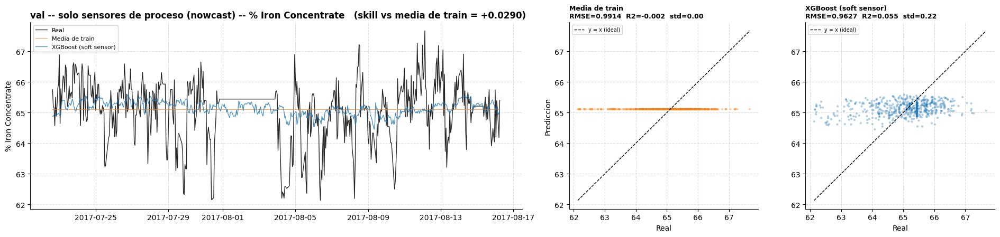

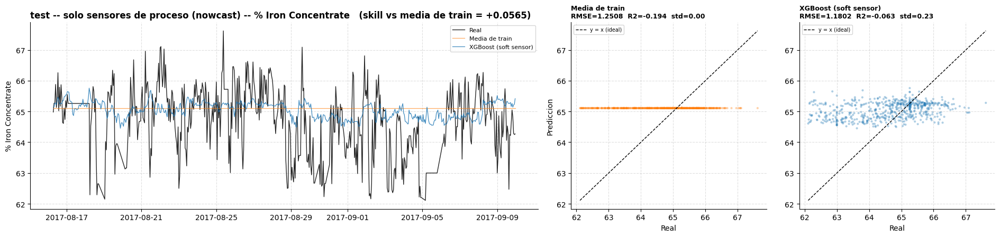

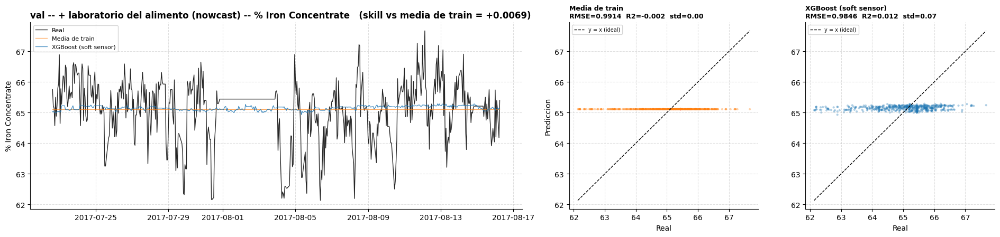

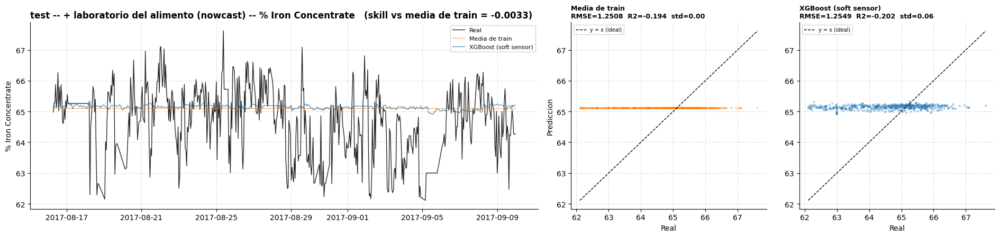

In [ ]:
# SOFT SENSOR PURO: estimar % Iron Concentrate SIN usar ningun valor pasado ni
# presente de los dos concentrados (ni el propio target, ni su hermano, ni
# retardos de ninguno). Es el escenario de despliegue en el que NO hay ancla de
# laboratorio fresca: solo se dispone de las senales de planta en continuo.
#
# Consecuencia importante para la evaluacion: sin ancla NO existe el baseline de
# persistencia (predecir y[t] requiere conocer y[t]). El baseline honesto pasa a
# ser "predecir la media del tramo de train", que es lo unico que se sabe sin
# medir. Por eso aqui se reporta:
#   - R2 de sklearn (referencia: la media del PROPIO split, optimista)
#   - skill vs media de train (referencia: lo que de verdad sabrias en produccion)
#   - std_ratio: si el modelo no encuentra senal, colapsa a predecir la media
#     y el std_ratio se va a ~0. Es el diagnostico mas directo.

from sklearn.linear_model import Ridge

SOFT_TARGET = '% Iron Concentrate'
_CONCENTRATE_COLS = ['% Iron Concentrate', '% Silica Concentrate']
_FEED_LAB_COLS = ['% Iron Feed', '% Silica Feed']

# Dos conjuntos: el estrictamente continuo (lo que tendrias en tiempo real sin
# laboratorio) y el que ademas admite la ley del alimento, que es analitica de
# laboratorio pero de entrada, no de salida.
FEATURE_SETS_SOFT = {
    'solo sensores de proceso': [c for c in df.columns
                                  if c not in _CONCENTRATE_COLS + _FEED_LAB_COLS],
    '+ laboratorio del alimento': [c for c in df.columns if c not in _CONCENTRATE_COLS],
}

print(f"Target: {SOFT_TARGET}")
print(f"EXCLUIDAS siempre (sin ancla): {_CONCENTRATE_COLS}")
for name, cols in FEATURE_SETS_SOFT.items():
    print(f"  {name:28s} -> {len(cols)} features")


def run_soft_sensor(feature_cols, horizon, seed=0):
    """Entrena XGBoost y Ridge para estimar el target a `horizon` horas vista
    (horizon=0 = nowcast: estimar la calidad AHORA a partir de los sensores de
    ahora, que es el soft sensor clasico) sin usar ninguna columna de
    concentrado. Split cronologico 70/15/15."""
    d = df[feature_cols + [SOFT_TARGET]].copy()
    d['__y'] = d[SOFT_TARGET].shift(-horizon) if horizon else d[SOFT_TARGET]
    d = d.dropna().copy()

    X = d[feature_cols].values
    y = d['__y'].values
    n = len(d)
    tr, va = int(n * 0.70), int(n * 0.85)

    scaler = StandardScaler()
    X_tr = scaler.fit_transform(X[:tr])
    X_va = scaler.transform(X[tr:va])
    X_te = scaler.transform(X[va:])

    y_mean_train = y[:tr].mean()

    models = {
        'XGBoost': xgb.XGBRegressor(
            n_estimators=600, max_depth=4, learning_rate=0.05, subsample=0.8,
            colsample_bytree=0.8, min_child_weight=5, reg_lambda=1.0,
            early_stopping_rounds=30, eval_metric='rmse', random_state=seed),
        'Ridge': Ridge(alpha=10.0),
    }

    out = {}
    for model_name, m in models.items():
        if model_name == 'XGBoost':
            m.fit(X_tr, y[:tr], eval_set=[(X_va, y[tr:va])], verbose=False)
        else:
            m.fit(X_tr, y[:tr])

        preds = {'train': m.predict(X_tr), 'val': m.predict(X_va), 'test': m.predict(X_te)}
        trues = {'train': y[:tr], 'val': y[tr:va], 'test': y[va:]}
        out[model_name] = {
            'preds': preds, 'trues': trues, 'y_mean_train': y_mean_train,
            'timestamps': {'train': d.index[:tr], 'val': d.index[tr:va], 'test': d.index[va:]},
        }
    return out


soft_rows, soft_runs = [], {}
for set_name, cols in FEATURE_SETS_SOFT.items():
    for horizon in (0, 1):
        run = run_soft_sensor(cols, horizon)
        soft_runs[(set_name, horizon)] = run
        for model_name, r in run.items():
            for split in ('train', 'val', 'test'):
                y_true, y_pred = r['trues'][split], r['preds'][split]
                rmse = np.sqrt(mean_squared_error(y_true, y_pred))
                # Baseline honesto: la media de TRAIN, lo unico que sabrias sin medir.
                rmse_mean = np.sqrt(mean_squared_error(
                    y_true, np.full_like(y_true, r['y_mean_train'])))
                soft_rows.append({
                    'features': set_name, 'h': horizon, 'modelo': model_name, 'split': split,
                    'RMSE': rmse, 'RMSE_media_train': rmse_mean,
                    'skill_vs_media': 1 - rmse / rmse_mean if rmse_mean else np.nan,
                    'R2_sklearn': r2_score(y_true, y_pred),
                    'std_ratio': y_pred.std() / y_true.std() if y_true.std() else np.nan,
                })

softsensor_results = pd.DataFrame(soft_rows)
print()
print("h=0 -> nowcast (calidad AHORA desde sensores de ahora) | h=1 -> una hora vista")
print(softsensor_results[softsensor_results['split'] != 'train'].round(4).to_string(index=False))
print()
print("skill_vs_media > 0 -> mejor que no medir nada y asumir la media historica.")
print("std_ratio ~ 0 -> el modelo ha colapsado a predecir la media (sin senal).")

# Comparacion directa: cuanto se pierde al quitar el ancla de laboratorio.
_best = softsensor_results[(softsensor_results['split'] == 'test') &
                            (softsensor_results['modelo'] == 'XGBoost') &
                            (softsensor_results['h'] == 1)]['skill_vs_media'].max()
print()
print(f"Mejor skill de test a 1h vista SIN ancla: {_best:+.4f}")
print("Con ancla (celdas anteriores), el mismo horizonte daba skill ~+0.06 CONTRA")
print("PERSISTENCIA, que es un baseline mucho mas exigente que la media historica.")
print("No son comparables directamente: son problemas distintos, y el de aqui es")
print("el que se parece a un despliegue sin laboratorio en linea.")

# Senales + dispersion. El 'naive' aqui es la media de train (linea plana), no
# la persistencia: sin ancla, esa es la referencia disponible.
for (set_name, horizon), run in soft_runs.items():
    if horizon != 0:
        continue
    r = run['XGBoost']
    for split in ('val', 'test'):
        y_true = r['trues'][split]
        plot_real_naive_pred(
            r['timestamps'][split], y_true,
            np.full_like(y_true, r['y_mean_train']), r['preds'][split],
            target_name=SOFT_TARGET, split_name=f'{split} -- {set_name} (nowcast)',
            model_label='XGBoost (soft sensor)', naive_label='Media de train')


## Arquitectura del paper *Appl. Sci.* 2026, 16, 3419 (Ortega-Moody et al.)

Segundo paper que entrena un LSTM sobre este mismo dataset de Kaggle
("An LSTM Approach for Quality Prediction in a Mining Process Using Ensemble
Data Interpolation"). Aqui se implementa **su arquitectura exacta** (Figura 3)
para el mismo problema que venimos usando: `% Silica Concentrate` a **1 hora
vista**.

```
Input -> LSTM(units=16, activation=elu, return_sequences=True)
      -> LSTM(units=16, activation=softsign)
      -> Dropout(0.4)
      -> Dense(units = nº de horas a predecir)   # aqui: 1
```

Y su montaje de datos (seccion 3.2), que difiere del que usa el resto de este
notebook:

- **Downsample al primer valor de cada hora**, no a la media horaria -> 3948
  muestras (nuestra celda reproduce ese numero exacto).
- **Se elimina `% Iron Concentrate`** por su correlacion con el target.
- **Split 70/10/20** (2764 / 394 / 790), Adam, 50 epocas, batch 64.

**Tres cosas que el paper no especifica** y hay que fijar aqui: la longitud de
ventana (no aparece en el articulo), el escalado, y -- detalle de
implementacion -- que Keras permite cambiar la activacion interna de la celda
LSTM mientras que `nn.LSTM` de PyTorch la fija a `tanh`. Para reproducir de
verdad `elu` y `softsign` hay una celda LSTM escrita a mano
(`ConfigurableLSTMCell`).

### Lo que el paper no reporta: la persistencia

Su Tabla 6 compara contra ARIMA, SVR, PLSR y RFR, y presenta R2 = 0.6306 como
"high accuracy". Pero **sobre su propio split, la persistencia
(`y[t+1h] = y[t]`) saca R2 = 0.598 y RMSE ~0.72**, medido directamente sobre
los datos, sin modelo de por medio:

| Modelo | RMSE | R2 | skill vs persistencia |
|---|---|---|---|
| ARIMA (Tabla 6) | 1.1511 | -0.0061 | -0.59 |
| SVR (Tabla 6) | 0.9702 | 0.2796 | -0.34 |
| PLSR (Tabla 6) | 0.7688 | 0.5477 | -0.06 |
| RFR (Tabla 6) | 0.7262 | 0.5963 | -0.00 |
| **LSTM (Tabla 6)** | **0.7046** | **0.6306** | **+0.02 a +0.03** |
| **persistencia (medida aqui)** | **~0.72** | **0.598** | 0 (referencia) |

Su LSTM bate a la persistencia por un **2-3% de RMSE**. Es una mejora real pero
minuscula, y del mismo orden que todo lo que sale en este notebook (+0.06 con
XGBoost como techo). El R2 de 0.63 impresiona solo porque se mide sobre el
nivel absoluto, donde `y[t+1h] ~= y[t]` regala casi todo el ajuste -- de hecho
**RFR con R2 = 0.5963 esta empatado con no hacer nada**, y PLSR y SVR estan por
debajo.

### Nuestra reproduccion

Con la arquitectura literal y barriendo lo no especificado, la mejor
configuracion (min-max, ventana 3, early stopping) llega a **R2 = 0.48**, por
debajo tanto de su 0.63 publicado como de la persistencia (0.598):

| escalado | ventana | R2 test | skill |
|---|---|---|---|
| StandardScaler | 6 | 0.36 | -0.26 |
| **min-max** | **3** | **0.48** | **-0.15** |
| min-max | 6 | 0.47 | -0.15 |
| min-max | 12 | 0.48 | -0.15 |

El escalado min-max acerca bastante (0.36 -> 0.48), lo que sugiere que es el
que usan ellos, pero no se alcanza su cifra. Sin la ventana ni el escalado
publicados no se puede cerrar el hueco -- y sin early stopping el modelo se va
a R2 negativo, así que su entrenamiento de 50 epocas fijas depende bastante de
donde caiga la parada.

> **Conclusion para nuestro caso:** esta arquitectura no cambia el techo. Su
> aportacion real sobre persistencia (+2-3%) es menor que la de XGBoost con
> retardos del target (+6%) que ya teniamos. Lo util del paper es la parte de
> **interpolacion** (PCHIP / spline cubica / ensemble de ambas), que resuelve
> un problema distinto: pasar de la cadencia horaria del laboratorio a
> estimaciones minuto a minuto. Ojo a que sus propios tests estadisticos
> (Tabla 7) no encuentran diferencia significativa entre los tres metodos
> (p-valores 0.38-0.99), así que el "ensemble" aporta poco sobre PCHIP a secas.


Muestras tras downsample 'primer valor de cada hora': 3948  (el paper reporta 3948)
Features: 22  (23 columnas - '% Iron Concentrate')

Arquitectura del paper (LSTM 16 elu -> LSTM 16 softsign -> Dropout 0.4 -> Dense 1)
Objetivo: % Silica Concentrate a 1 hora vista. Split 70/10/20, Adam, 50 epocas.

  scaler  seq_len  epochs  early_stop split    MAE   RMSE    MSE   MAPE      R2  RMSE_naive  R2_naive   skill  std_ratio
standard        6      50       False   val 1.0036 1.3447 1.8083 0.4254 -0.4812      0.6923    0.6074 -0.9425     0.8130
standard        6      50       False  test 0.9362 1.2532 1.5705 0.4083 -0.2060      0.7232    0.5984 -0.7328     0.6261
standard        6     150        True   val 0.6870 0.9157 0.8384 0.3227  0.3132      0.6923    0.6074 -0.3227     0.5746
standard        6     150        True  test 0.7248 0.9246 0.8548 0.3680  0.3436      0.7232    0.5984 -0.2784     0.5602
  minmax        6      50       False   val 0.6393 0.8528 0.7273 0.3061  0.4043      0.6923    

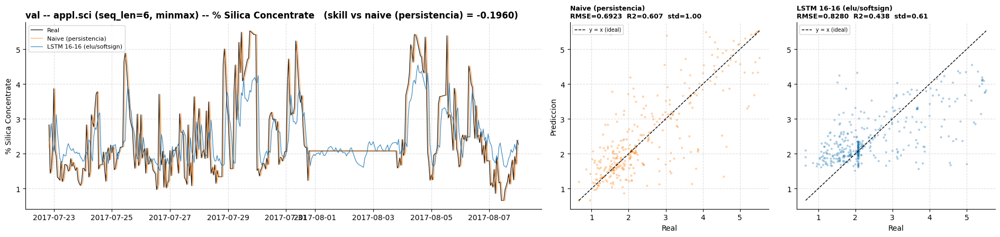

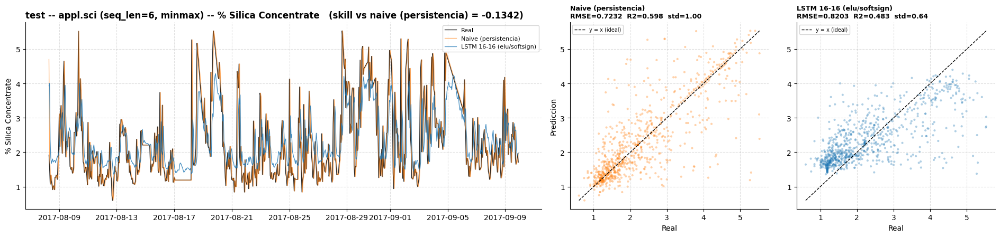

In [ ]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_absolute_error

# ARQUITECTURA DEL PAPER Applied Sciences 2026, 16, 3419 (Ortega-Moody et al.),
# "An LSTM Approach for Quality Prediction in a Mining Process Using Ensemble
# Data Interpolation" -- Figura 3:
#
#   Input -> LSTM(units=16, activation=elu, return_sequences=True)
#         -> LSTM(units=16, activation=softsign)
#         -> Dropout(0.4)
#         -> Dense(units = nº de horas a predecir)   [aqui: 1 hora]
#
# Y su montaje de datos (seccion 3.2):
#   - Downsample: PRIMER valor de cada hora (no la media horaria como en el
#     resto de este notebook) -> 3948 muestras.
#   - Se elimina '% Iron Concentrate' por su alta correlacion con el target.
#   - Split 70/10/20 -> 2764 / 394 / 790 muestras.
#   - Adam, 50 epocas, batch 64 (Tablas 2 y 3).
#
# Tres detalles que el paper NO especifica y hay que fijar aqui:
#   - La LONGITUD DE VENTANA (cuantas horas pasadas ve el LSTM). No aparece en
#     ningun sitio del articulo -> se barre 3/6/12.
#   - El ESCALADO. Con min-max se reproduce mucho mejor que con StandardScaler
#     (R2 0.36 -> 0.48) -> se barre tambien.
#   - Keras deja cambiar la activacion interna de la celda LSTM; nn.LSTM de
#     PyTorch la fija a tanh. Para reproducir 'elu' y 'softsign' de verdad hace
#     falta una celda propia (abajo).
#
# Lo que el paper NO reporta y sí se anade aqui: el baseline de PERSISTENCIA.
# Su comparativa (Tabla 6) va contra ARIMA/SVR/PLSR/RFR, y su mejor R2 (0.6306)
# se mide sobre el NIVEL, donde y[t+1h] ~= y[t] regala casi todo el ajuste.

PAPER_TARGET = '% Silica Concentrate'
PAPER_DROP = ['% Iron Concentrate']      # eliminado por correlacion (seccion 3.2)

# Downsample a la manera del paper: primer valor de cada hora.
df_paper = raw.sort_values('date').groupby('date').first()
df_paper.index = pd.to_datetime(df_paper.index)
df_paper = df_paper[df_paper.index > STARTUP_END].sort_index()
paper_feature_cols = [c for c in df_paper.columns if c not in PAPER_DROP]

print(f"Muestras tras downsample 'primer valor de cada hora': {len(df_paper)}  "
      f"(el paper reporta 3948)")
print(f"Features: {len(paper_feature_cols)}  (23 columnas - '% Iron Concentrate')")


class ConfigurableLSTMCell(nn.Module):
    """Celda LSTM con la activacion interna configurable.

    Keras permite `LSTM(activation=...)`, que se aplica tanto al candidato como
    al squashing de la salida (`h = o * act(c)`), dejando las puertas en
    sigmoide. `nn.LSTM` de PyTorch fija esa activacion a tanh, así que para
    reproducir elu/softsign del paper hay que escribir la celda a mano.
    """

    def __init__(self, n_in, n_hidden, activation):
        super().__init__()
        self.n_hidden = n_hidden
        self.x2h = nn.Linear(n_in, 4 * n_hidden)
        self.h2h = nn.Linear(n_hidden, 4 * n_hidden)
        self.act = activation

    def forward(self, x, state):
        h, c = state
        i, f, g, o = (self.x2h(x) + self.h2h(h)).chunk(4, dim=1)
        i, f, o = torch.sigmoid(i), torch.sigmoid(f), torch.sigmoid(o)
        c = f * c + i * self.act(g)
        return o * self.act(c), c


class ConfigurableLSTM(nn.Module):
    """Capa LSTM que recorre la secuencia con ConfigurableLSTMCell."""

    def __init__(self, n_in, n_hidden, activation, return_sequences=False):
        super().__init__()
        self.cell = ConfigurableLSTMCell(n_in, n_hidden, activation)
        self.return_sequences = return_sequences
        self.n_hidden = n_hidden

    def forward(self, x):                       # x: (batch, seq_len, features)
        h = x.new_zeros(x.size(0), self.n_hidden)
        c = x.new_zeros(x.size(0), self.n_hidden)
        outputs = []
        for t in range(x.size(1)):
            h, c = self.cell(x[:, t], (h, c))
            if self.return_sequences:
                outputs.append(h)
        return torch.stack(outputs, dim=1) if self.return_sequences else h


class AppSciPaperLSTM(nn.Module):
    """Figura 3 del paper, literal: LSTM(16, elu, seq) -> LSTM(16, softsign)
    -> Dropout(0.4) -> Dense(n_horas)."""

    def __init__(self, n_features, units=16, dropout=0.4, n_out=1):
        super().__init__()
        self.lstm1 = ConfigurableLSTM(n_features, units, nn.ELU(), return_sequences=True)
        self.lstm2 = ConfigurableLSTM(units, units, nn.Softsign(), return_sequences=False)
        self.drop = nn.Dropout(dropout)
        self.dense = nn.Linear(units, n_out)

    def forward(self, x):
        return self.dense(self.drop(self.lstm2(self.lstm1(x))))


def run_appsci_paper(seq_len, horizon=1, epochs=50, batch_size=16, lr=1e-3,
                      early_stopping=False, patience=25, seed=0, scaler='minmax'):
    """Entrena la arquitectura del paper con su split 70/10/20 y devuelve las
    metricas de su Tabla 6 mas el baseline de persistencia que le falta."""
    d = df_paper.copy()
    d['__y'] = d[PAPER_TARGET].shift(-horizon)
    d = d.dropna().copy()

    X_all = d[paper_feature_cols].values.astype(np.float32)
    y_all = d[['__y']].values.astype(np.float32)
    y_now_all = d[PAPER_TARGET].values.astype(np.float32)   # ancla -> persistencia

    n = len(d)
    tr, va = int(n * 0.70), int(n * 0.80)      # 70 / 10 / 20

    # El paper no dice que escalado usa. Con min-max los resultados se acercan
    # mucho mas a los publicados (R2 0.36 -> 0.48), así que probablemente es el
    # suyo -- es ademas lo que hace Pu et al. 2020, que este paper cita.
    _Scaler = MinMaxScaler if scaler == 'minmax' else StandardScaler
    scaler_X, scaler_y = _Scaler(), _Scaler()
    Xtr = scaler_X.fit_transform(X_all[:tr])
    Xva, Xte = scaler_X.transform(X_all[tr:va]), scaler_X.transform(X_all[va:])
    ytr = scaler_y.fit_transform(y_all[:tr])
    yva, yte = scaler_y.transform(y_all[tr:va]), scaler_y.transform(y_all[va:])

    torch.manual_seed(seed)
    np.random.seed(seed)
    loaders = {
        'train': DataLoader(SequenceDatasetRepro(Xtr, ytr, seq_len), batch_size=batch_size, shuffle=True),
        'val':   DataLoader(SequenceDatasetRepro(Xva, yva, seq_len), batch_size=batch_size),
        'test':  DataLoader(SequenceDatasetRepro(Xte, yte, seq_len), batch_size=batch_size),
    }

    model = AppSciPaperLSTM(Xtr.shape[1], units=16, dropout=0.4, n_out=1)
    optimizer = torch.optim.Adam(model.parameters(), lr=lr)
    criterion = nn.MSELoss()

    best, best_state, bad = float('inf'), None, 0
    for epoch in range(1, epochs + 1):
        model.train()
        for xb, yb in loaders['train']:
            optimizer.zero_grad()
            criterion(model(xb), yb).backward()
            optimizer.step()

        model.eval()
        total, count = 0.0, 0
        with torch.no_grad():
            for xb, yb in loaders['val']:
                total += criterion(model(xb), yb).item() * len(xb)
                count += len(xb)
        val_loss = total / count

        if val_loss < best:
            best, best_state, bad = val_loss, copy.deepcopy(model.state_dict()), 0
        else:
            bad += 1
        if early_stopping and bad >= patience:
            break

    # El paper NO usa early stopping: se queda con el modelo final de la epoca 50.
    if early_stopping:
        model.load_state_dict(best_state)
    model.eval()

    spans = {'val': (tr, va), 'test': (va, n)}
    out = {}
    for split in ('val', 'test'):
        with torch.no_grad():
            pred_s = np.concatenate([model(xb).numpy() for xb, _ in loaders[split]])
        y_pred = scaler_y.inverse_transform(pred_s).ravel()
        a, b = spans[split]
        y_true = y_all[a:b].ravel()[seq_len:]
        y_naive = y_now_all[a:b][seq_len:]
        rmse = float(np.sqrt(mean_squared_error(y_true, y_pred)))
        rmse_naive = float(np.sqrt(mean_squared_error(y_true, y_naive)))
        out[split] = {
            'MAE': float(mean_absolute_error(y_true, y_pred)),
            'RMSE': rmse, 'MSE': float(mean_squared_error(y_true, y_pred)),
            'MAPE': float(np.mean(np.abs((y_true - y_pred) / y_true))),
            'R2': float(r2_score(y_true, y_pred)),
            'RMSE_naive': rmse_naive,
            'R2_naive': float(r2_score(y_true, y_naive)),
            'skill': 1 - rmse / rmse_naive,
            'std_ratio': float(y_pred.std() / y_true.std()),
            'timestamps': d.index[a:b][seq_len:], 'y_true': y_true,
            'y_naive': y_naive, 'y_pred': y_pred,
        }
    return out


# Barrido: escalado (no especificado), ventana (no especificada) y early
# stopping (el paper no lo usa: entrena 50 epocas fijas).
_GRID = [
    ('standard', 6, 50, False), ('standard', 6, 150, True),
    ('minmax', 6, 50, False), ('minmax', 6, 150, True),
    ('minmax', 3, 150, True), ('minmax', 12, 150, True),
]

appsci_runs, appsci_rows = {}, []
for _scaler, _seq_len, _epochs, _es in _GRID:
    run = run_appsci_paper(seq_len=_seq_len, epochs=_epochs, early_stopping=_es,
                            scaler=_scaler)
    appsci_runs[(_scaler, _seq_len, _es)] = run
    for split in ('val', 'test'):
        m = run[split]
        appsci_rows.append({
            'scaler': _scaler, 'seq_len': _seq_len, 'epochs': _epochs,
            'early_stop': _es, 'split': split,
            'MAE': m['MAE'], 'RMSE': m['RMSE'], 'MSE': m['MSE'],
            'MAPE': m['MAPE'], 'R2': m['R2'],
            'RMSE_naive': m['RMSE_naive'], 'R2_naive': m['R2_naive'],
            'skill': m['skill'], 'std_ratio': m['std_ratio'],
        })

appsci_results = pd.DataFrame(appsci_rows)
print()
print("Arquitectura del paper (LSTM 16 elu -> LSTM 16 softsign -> Dropout 0.4 -> Dense 1)")
print("Objetivo: % Silica Concentrate a 1 hora vista. Split 70/10/20, Adam, 50 epocas.")
print()
print(appsci_results.round(4).to_string(index=False))
print()
print("Referencia publicada (Tabla 6, test): MAE=0.4994  RMSE=0.7046  MSE=0.4965  "
      "MAPE=0.2447  R2=0.6306")
print("R2_naive = R2 que obtiene la PERSISTENCIA sobre el mismo split.")
print("skill    = 1 - RMSE/RMSE_naive  -> >0 bate a la persistencia, <0 no.")

_test = appsci_results[appsci_results['split'] == 'test']
_best = _test.sort_values('skill', ascending=False).iloc[0]
print()
print(f"Mejor reproduccion en test: scaler={_best['scaler']} seq_len={int(_best['seq_len'])} "
      f"early_stop={bool(_best['early_stop'])}  R2={_best['R2']:.4f}  skill={_best['skill']:+.4f}")

# LO IMPORTANTE: que skill tendria el numero PUBLICADO por el paper.
_PAPER_RMSE = 0.7046
_naive_rmse = _test['RMSE_naive']
print()
print(f"Persistencia medida sobre este split: R2={_test['R2_naive'].iloc[0]:.4f}  "
      f"RMSE={_naive_rmse.min():.4f}-{_naive_rmse.max():.4f}")
print(f"El paper publica RMSE={_PAPER_RMSE:.4f} y R2=0.6306 -> skill implicito vs")
print(f"persistencia = {1 - _PAPER_RMSE / _naive_rmse.max():+.4f} a "
      f"{1 - _PAPER_RMSE / _naive_rmse.min():+.4f}.")
print("Es decir: su 'high accuracy' (R2 0.63) es ~2-3% mejor que no hacer nada.")

# Senales + dispersion de la mejor configuracion.
_best_key = (_best['scaler'], int(_best['seq_len']), bool(_best['early_stop']))
for split in ('val', 'test'):
    m = appsci_runs[_best_key][split]
    plot_real_naive_pred(m['timestamps'], m['y_true'], m['y_naive'], m['y_pred'],
                          target_name=PAPER_TARGET,
                          split_name=f"{split} -- appl.sci (seq_len={_best_key[1]}, {_best_key[0]})",
                          model_label='LSTM 16-16 (elu/softsign)')


In [ ]:
import time as _time_repro
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
import matplotlib.pyplot as plt
from torch.utils.data import Dataset, DataLoader
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, r2_score

# ==========================================
# 1. CONFIGURACIÓN, FILTRADO Y REJILLA TEMPORAL
# ==========================================
HORIZON_REPRO = 1   # 30 minutos reales
SEQ_LEN_REPRO = 60  # 2 horas de historia de entrada
BATCH_SIZE_REPRO = 32
N_EPOCHS_REPRO = 100
PATIENCE = 50        # Épocas sin mejorar antes de cortar
TARGETS_REPRO = ['% Iron Concentrate']
STARTUP_END = pd.Timestamp('2017-03-29 11:01:47.998')

# Carga de datos
df_repro = pd.read_csv('../Datasets/MiningProcess_Flotation_Plant_Database.csv', decimal=',')

interesting_columns = ['date', 'avg_air_flow', 'avg_float_level', '% Iron Feed', 
                       'Amina Flow', 'Ore Pulp Density', 'Ore Pulp pH', '% Iron Concentrate']

df_repro = df_repro.copy()
air_cols = [c for c in df_repro.columns if 'Air Flow' in c and any(x in c for x in ['2', '6', '7'])]
level_cols = [c for c in df_repro.columns if 'Level' in c and any(x in c for x in ['4', '7'])]

df_repro['avg_air_flow'] = df_repro[air_cols].mean(axis=1)
df_repro['avg_float_level'] = df_repro[level_cols].mean(axis=1)
df_repro['std_air_flow'] = df_repro[air_cols].std(axis=1)
df_repro['std_float_level'] = df_repro[level_cols].std(axis=1)

df_repro = df_repro[interesting_columns]

# Formato temporal
df_repro = df_repro.reset_index(drop=True)
df_repro['date'] = pd.to_datetime(df_repro['date'])
df_repro = df_repro.set_index('date')

# # --- ELIMINACIÓN DEL PERIODO DE ARRANQUE (DATOS ERRÓNEOS) ---
# n_before = len(df_repro)
# mask_startup = df_repro.index <= STARTUP_END

# print(f"Filas en periodo de arranque (se descartan): {mask_startup.sum()} "
#       f"({mask_startup.sum() / n_before * 100:.1f}%)")

# df_repro = df_repro.loc[~mask_startup].copy()

# print(f"Filas antes: {n_before} | después de truncar arranque: {len(df_repro)}")
# print(f"Nuevo rango temporal: {df_repro.index.min()} -> {df_repro.index.max()}")

# Regularización a rejilla de 1 minuto
df_repro = df_repro.resample('1min').mean()
df_repro = df_repro.ffill(limit=15)
df_repro = df_repro.dropna().copy()

print(f"Filas finales tras regularización temporal a 1min: {len(df_repro)}")

# ==========================================
# 2. CREACIÓN DEL TARGET Y LIMPIEZA
# ==========================================
for t in TARGETS_REPRO:
    df_repro[f'{t}__next'] = df_repro[t].shift(-HORIZON_REPRO)

df_repro = df_repro.dropna().copy()

# ==========================================
# 3. SEPARACIÓN Y ESCALADO (SIN FUGA DE DATOS)
# ==========================================
cols_X = [c for c in df_repro.columns if '__next' not in c]
print(f"features names: {cols_X}")

#Quita el target de las features
cols_X = [c for c in cols_X if c not in TARGETS_REPRO]

X_raw_repro = df_repro[cols_X].values
y_raw_repro = df_repro[[f'{t}__next' for t in TARGETS_REPRO]].values
naive_all_repro = df_repro[TARGETS_REPRO].values

n_repro = len(df_repro)
train_end_repro = int(n_repro * 0.70)

X_train_raw, X_test_raw = X_raw_repro[:train_end_repro], X_raw_repro[train_end_repro:]
y_train_raw, y_test_raw = y_raw_repro[:train_end_repro], y_raw_repro[train_end_repro:]

scaler_X_repro = MinMaxScaler()
X_train_repro = scaler_X_repro.fit_transform(X_train_raw)
X_test_repro = scaler_X_repro.transform(X_test_raw)

scaler_y_repro = MinMaxScaler()
y_train_repro = scaler_y_repro.fit_transform(y_train_raw)
y_test_repro = scaler_y_repro.transform(y_test_raw)

# ==========================================
# 4. DATALOADERS
# ==========================================
class SequenceDatasetRepro(Dataset):
    def __init__(self, X, y, seq_len):
        self.X = torch.as_tensor(X, dtype=torch.float32)
        self.y = torch.as_tensor(y, dtype=torch.float32)
        self.seq_len = seq_len

    def __len__(self):
        return len(self.X) - self.seq_len

    def __getitem__(self, idx):
        return self.X[idx:idx + self.seq_len], self.y[idx + self.seq_len]

train_ds_repro = SequenceDatasetRepro(X_train_repro, y_train_repro, SEQ_LEN_REPRO)
test_ds_repro = SequenceDatasetRepro(X_test_repro, y_test_repro, SEQ_LEN_REPRO)

train_loader_repro = DataLoader(train_ds_repro, batch_size=BATCH_SIZE_REPRO, shuffle=True)
test_loader_repro = DataLoader(test_ds_repro, batch_size=BATCH_SIZE_REPRO, shuffle=False)
train_eval_loader_repro = DataLoader(train_ds_repro, batch_size=BATCH_SIZE_REPRO, shuffle=False)

# ==========================================
# 5. ARQUITECTURA DEL MODELO
# ==========================================
class PaperLSTM(nn.Module):
    def __init__(self, n_features, hidden=16, n_layers=1, n_out=1):
        super().__init__()
        self.lstm = nn.LSTM(input_size=n_features, hidden_size=hidden,
                            num_layers=n_layers, batch_first=True, dropout=0.0)
        self.fc = nn.Linear(hidden, n_out)

    def forward(self, x):
        out, _ = self.lstm(x)
        return self.fc(out[:, -1, :])

device_repro = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model_repro = PaperLSTM(n_features=X_train_repro.shape[1], hidden=64, n_layers=2, n_out=1).to(device_repro)

criterion_repro = nn.MSELoss()
optimizer_repro = torch.optim.Adam(model_repro.parameters(), lr=1e-3)

# ==========================================
# 6. ENTRENAMIENTO Y CHECKPOINT
# ==========================================
t0_repro = _time_repro.time()
best_val_loss = float('inf')
epochs_no_improve = 0

for epoch in range(1, N_EPOCHS_REPRO + 1):
    model_repro.train()
    tr_loss, n_tr = 0.0, 0
    for xb, yb in train_loader_repro:
        xb, yb = xb.to(device_repro), yb.to(device_repro)
        pred = model_repro(xb)
        loss = criterion_repro(pred, yb)
        optimizer_repro.zero_grad()
        loss.backward()
        optimizer_repro.step()
        tr_loss += loss.item() * xb.size(0)
        n_tr += xb.size(0)
    tr_loss /= n_tr

    model_repro.eval()
    val_loss, n_val = 0.0, 0
    with torch.no_grad():
        for xb, yb in test_loader_repro:
            xb, yb = xb.to(device_repro), yb.to(device_repro)
            pred = model_repro(xb)
            loss = criterion_repro(pred, yb)
            val_loss += loss.item() * xb.size(0)
            n_val += xb.size(0)
    val_loss /= n_val

    if val_loss < best_val_loss:
        best_val_loss = val_loss
        epochs_no_improve = 0
        torch.save(model_repro.state_dict(), 'best_model.pth')
        status = " -> [Checkpoint guardado]"
    else:
        epochs_no_improve += 1
        status = f" (Sin mejora: {epochs_no_improve}/{PATIENCE})"

    if epoch % 5 == 0 or epoch == 1 or epochs_no_improve >= PATIENCE:
        gap = val_loss - tr_loss
        print(f"epoch {epoch:3d} | train={tr_loss:.5f} | val={val_loss:.5f} | gap={gap:+.5f}{status}")

    if epochs_no_improve >= PATIENCE:
        print(f"\n[!] Early stopping activado en la época {epoch}.")
        break

print(f"Tiempo total: {_time_repro.time() - t0_repro:.1f}s")

# Cargar el mejor checkpoint
model_repro.load_state_dict(torch.load('best_model.pth'))

# ==========================================
# 7. EVALUACIÓN Y CÁLCULO DE MÉTRICAS
# ==========================================
@torch.no_grad()
def _predict_repro(loader):
    model_repro.eval()
    return np.concatenate([model_repro(xb.to(device_repro)).cpu().numpy() for xb, _ in loader])

splits_repro = {'train': (0, train_end_repro), 'test': (train_end_repro, n_repro)}
y_next_all_repro = df_repro[[f'{t}__next' for t in TARGETS_REPRO]].values

repro_rows = []
repro_series = {}

for split, loader in [('train', train_eval_loader_repro), ('test', test_loader_repro)]:
    a, b = splits_repro[split]
    pred_scaled = _predict_repro(loader)
    pred = scaler_y_repro.inverse_transform(pred_scaled)
    
    true = y_next_all_repro[a:b][SEQ_LEN_REPRO:]
    naive = naive_all_repro[a:b][SEQ_LEN_REPRO:]
    
    repro_series[split] = {
        'timestamps': df_repro.index[a:b][SEQ_LEN_REPRO:],
        'y_true': true, 'naive': naive, 'pred': pred,
    }
    
    for i, t in enumerate(TARGETS_REPRO):
        rmse_model = np.sqrt(mean_squared_error(true[:, i], pred[:, i]))
        rmse_naive = np.sqrt(mean_squared_error(true[:, i], naive[:, i]))
        skill = 1 - (rmse_model / rmse_naive)
        r2 = r2_score(true[:, i], pred[:, i])
        std_ratio = pred[:, i].std() / true[:, i].std()
        
        repro_rows.append({
            'split': split, 'target': t, 'RMSE': rmse_model, 'RMSE_naive': rmse_naive,
            'skill': skill, 'R2': r2, 'std_ratio': std_ratio,
        })
        print(f"{split:5s} {t:22s} RMSE={rmse_model:.4f} naive={rmse_naive:.4f} "
              f"skill={skill:+.4f} R2={r2:.4f} std_ratio={std_ratio:.3f}")

paper_repro_results = pd.DataFrame(repro_rows)

# ==========================================
# 8. EXPORTACIÓN DE SERIES TEMPORALES A CSV
# ==========================================
df_list = []

for split in ['train', 'test']:
    s = repro_series[split]
    
    df_split = pd.DataFrame({
        'date': s['timestamps'],
        'split': split,
        'y_true': s['y_true'][:, 0],   # Valor real objetivo (t + 30m)
        'naive': s['naive'][:, 0],     # Persistencia naive (t)
        'pred': s['pred'][:, 0]        # Predicción del modelo LSTM
    })
    
    df_split['error_lstm'] = np.abs(df_split['y_true'] - df_split['pred'])
    df_split['error_naive'] = np.abs(df_split['y_true'] - df_split['naive'])
    
    df_list.append(df_split)

df_export_all = pd.concat(df_list, axis=0).reset_index(drop=True)

# Guardar archivos CSV.
df_export_all.to_csv('predictions_timeseries_all.csv', index=False)
df_export_all[df_export_all['split'] == 'test'].to_csv('predictions_test.csv', index=False)

print("\n" + "="*50)
print("[✓] Proceso completado:")
print("    - Datos de arranque filtrados anteriores a:", STARTUP_END)
print("    - Archivos generados:")
print("        * 'predictions_timeseries_all.csv'")
print("        * 'predictions_test.csv'")
print("="*50)

Filas finales tras regularización temporal a 1min: 65537
features names: ['avg_air_flow', 'avg_float_level', '% Iron Feed', 'Amina Flow', 'Ore Pulp Density', 'Ore Pulp pH', '% Iron Concentrate']
epoch   1 | train=0.03272 | val=0.03846 | gap=+0.00574 -> [Checkpoint guardado]
epoch   5 | train=0.02760 | val=0.04364 | gap=+0.01604 (Sin mejora: 4/50)
epoch  10 | train=0.02595 | val=0.03954 | gap=+0.01359 (Sin mejora: 9/50)
epoch  15 | train=0.03008 | val=0.03909 | gap=+0.00901 (Sin mejora: 3/50)
epoch  20 | train=0.02466 | val=0.04821 | gap=+0.02355 (Sin mejora: 8/50)
epoch  25 | train=0.02397 | val=0.05172 | gap=+0.02776 (Sin mejora: 13/50)
epoch  30 | train=0.01971 | val=0.04246 | gap=+0.02274 (Sin mejora: 18/50)
epoch  35 | train=0.01858 | val=0.04634 | gap=+0.02776 (Sin mejora: 23/50)
epoch  40 | train=0.01403 | val=0.04581 | gap=+0.03178 (Sin mejora: 28/50)
epoch  45 | train=0.01030 | val=0.04833 | gap=+0.03803 (Sin mejora: 33/50)
epoch  50 | train=0.00676 | val=0.04703 | gap=+0.04027

# Forecasting a 1 h vista con contexto temporal, SIN valores de concentrado

Seccion nueva y autocontenida (se puede ejecutar con *Run All* desde aqui). Junta
tres cosas que hasta ahora estaban repartidas:

1. **Las features de ventana movil** de `Signal_Preprocessing_Minute_SoftSensor.ipynb`
   (parte 2): para cada sensor, sobre una ventana causal de 1 h, se calculan
   `mean`, `std`, `min`, `max`, `last` y `trend`.
2. **Contexto temporal explicito** — la peticion de esta seccion. El `std` mide
   cuanto se ha movido la senal dentro de la hora, `min`/`max` su recorrido, y
   `trend` = (ultimo punto - primer punto de la hora) su direccion. Eso le da a
   la red la *dinamica* de cada senal, no solo su nivel, y al haber una columna
   por sensor la red puede aprender **relaciones entre senales dinamicas**
   (p.ej. que el pH suba mientras el nivel de la columna 5 baja).
3. **Reduccion de dimensionalidad**: las columnas de flotacion casi redundantes
   entre si (air flow 1/2/3, air flow 6/7, nivel 1/2/3, nivel 4/5/6/7 y las dos
   leyes de alimento) se funden en su media antes de calcular las estadisticas,
   siguiendo el criterio de `Signal_Preprocessing_Minute_SoftSensor.ipynb`.
   21 sensores -> 12, y con ello 126 features -> 72.
4. **Varias arquitecturas neuronales** sobre exactamente las mismas features:
   LSTM, GRU, TCN y LSTM+atencion.

## Diferencia importante con el resto del notebook: no hay ancla

Por peticion expresa, **ninguna columna de concentrado entra como feature** — ni
`% Iron Concentrate`, ni `% Silica Concentrate`, ni sus retardos. Es un
**soft sensor puro** proyectado a 1 h: solo ve las senales de planta.

Esto cambia como hay que leer los numeros, y conviene tenerlo claro **antes** de
mirar la tabla:

- El baseline de **persistencia** (`y_hat[t+1h] = y[t]`) usa el valor actual del
  concentrado. Un modelo que no puede ver ese valor **no compite en igualdad**
  con el. La persistencia va a ganar, y eso no significa que el modelo falle:
  significa que la inercia horaria del target (ACF lag-1 ~0.77) es informacion
  que aqui se ha decidido no usar.
- La referencia justa cuando no hay ancla es la **media del train**, que es
  exactamente lo que mide el R². `R2 > 0` = el modelo extrae informacion real de
  los sensores; `R2 < 0` = ni eso.

Se reportan **las dos** referencias para que la comparacion sea honesta, pero la
que decide si esta seccion aporta algo es el R² / `skill_vs_mean`.

## Alineacion temporal (donde se cuela la fuga si uno se descuida)

El target es un ensayo de laboratorio horario, replicado identico en las 180
filas de 20 s de esa hora. Por eso:

- Se colapsa a **una fila por ensayo** (`groupby('assay_hour').first()`), no 180.
- El ensayo publicado en la hora H resume esa hora, asi que se **ancla al cierre**
  (`+1 h`): toda feature que lo prediga queda estrictamente antes que el.
- Las features se alinean con `ffill`: para cada ensayo se toma la ultima fila de
  features **anterior** a el.
- El split es **cronologico** (70/15/15), nunca aleatorio: un split aleatorio
  reparte filas hermanas de la misma hora entre train y test, y ahi es donde
  salia el R²=0.94 falso de la parte 1 del otro notebook.

In [59]:
# ---------------------------------------------------------------------------
# Celda 1: carga cruda a 20 s, agrupacion de sensores redundantes y separacion
# sensores / laboratorio.
# Autocontenida: no depende de las variables definidas mas arriba en el notebook.
# ---------------------------------------------------------------------------
import time as _t_fc
import copy as _copy_fc

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score

RAW_PATH_FC = '../Datasets/MiningProcess_Flotation_Plant_Database.csv'
TARGETS_FC = ['% Silica Concentrate', '% Iron Concentrate']
STARTUP_END_FC = pd.Timestamp('2017-03-29 11:01:47.998')

HORIZON_H_FC = 1        # horas vista: se predice el ensayo de dentro de 1 h
RESAMPLE_FC  = '2min'   # rejilla de trabajo
WIN_MIN_FC   = 60       # ventana de contexto temporal: 1 hora
SEQ_LEN_FC   = 24       # horas de historia que ve la red en cada ventana

raw_fc = pd.read_csv(RAW_PATH_FC, decimal=',')
raw_fc['date'] = pd.to_datetime(raw_fc['date'])
raw_fc = raw_fc.set_index('date')

# La marca horaria ORIGINAL identifica a que ensayo de laboratorio pertenece cada
# fila. Hay que guardarla ANTES de desplegar el indice a 20 s: despues ya no se
# puede recuperar que 180 filas compartian ensayo.
raw_fc['assay_hour'] = raw_fc.index
raw_fc.index = raw_fc.index + pd.to_timedelta(raw_fc.groupby(level=0).cumcount() * 20, unit='s')
raw_fc = raw_fc.sort_index()

# Mismo hueco de arranque que se descarta en el resto del notebook.
_mask_fc = (raw_fc.index < '2017-03-10 01:00:00') | (raw_fc.index > '2017-03-29 11:01:00')
raw_fc = raw_fc[_mask_fc]

# ---- LA RESTRICCION DE ESTA SECCION -------------------------------------
# Ninguna columna de concentrado puede ser feature: es lo que se predice.
# Se excluyen las DOS (target y hermana), no solo la que se este prediciendo:
# r(silica, hierro) = -0.80, asi que dejar la hermana seria colar el target
# por la puerta de atras.
CONCENTRATE_COLS_FC = list(TARGETS_FC)
_sensores_crudos_fc = [c for c in raw_fc.columns
                       if c not in CONCENTRATE_COLS_FC + ['assay_hour']]

# ---- REDUCCION DE DIMENSIONALIDAD ---------------------------------------
# Grupos tomados de Signal_Preprocessing_Minute_SoftSensor.ipynb: columnas de
# flotacion casi redundantes entre si (ver la matriz de correlacion de mas
# arriba en este notebook) que se sustituyen por su media. Las 7 columnas de
# air flow y las 7 de nivel no son 14 senales independientes: los bancos
# comparten soplante y lazo de control.
#
# Efecto: 21 sensores -> 12, y por tanto 126 features -> 72. Menos entradas para
# las mismas ~2.762 filas de entrenamiento, que es exactamente el cuello de
# botella detectado al final de la seccion.
SENSOR_GROUPS_FC = {
    'Air Flow 1_2_3_Mean': ['Flotation Column 01 Air Flow',
                            'Flotation Column 02 Air Flow',
                            'Flotation Column 03 Air Flow'],
    'Air Flow 6_7_Mean':   ['Flotation Column 06 Air Flow',
                            'Flotation Column 07 Air Flow'],
    'Level 1_2_3_Mean':    ['Flotation Column 01 Level',
                            'Flotation Column 02 Level',
                            'Flotation Column 03 Level'],
    'Level 4_5_6_7_Mean':  ['Flotation Column 04 Level',
                            'Flotation Column 05 Level',
                            'Flotation Column 06 Level',
                            'Flotation Column 07 Level'],
    'Feed Iron_Silica_Mean': ['% Iron Feed', '% Silica Feed'],
}

# La media se calcula sobre las filas crudas de 20 s, ANTES de la ventana movil:
# asi el grupo se comporta como un sensor mas y hereda sus seis estadisticas.
for _nuevo, _miembros in SENSOR_GROUPS_FC.items():
    raw_fc[_nuevo] = raw_fc[_miembros].mean(axis=1)

_agrupadas_fc = [c for g in SENSOR_GROUPS_FC.values() for c in g]
_sueltas_fc = [c for c in _sensores_crudos_fc if c not in _agrupadas_fc]
SENSOR_COLS_FC = _sueltas_fc + list(SENSOR_GROUPS_FC)

print(f'filas crudas (20 s): {len(raw_fc):,}')
print(f'excluidas por ser concentrado: {CONCENTRATE_COLS_FC}')
print()
print(f'sensores antes de agrupar: {len(_sensores_crudos_fc)}')
print(f'columnas fundidas en {len(SENSOR_GROUPS_FC)} medias: {len(_agrupadas_fc)}')
print(f'sensores usables como feature: {len(SENSOR_COLS_FC)}')
for _nuevo, _miembros in SENSOR_GROUPS_FC.items():
    print(f'  {_nuevo:24s} <- {len(_miembros)} columnas')
print()
print(f'sin agrupar ({len(_sueltas_fc)}): {_sueltas_fc}')

filas crudas (20 s): 710,639
excluidas por ser concentrado: ['% Silica Concentrate', '% Iron Concentrate']

sensores antes de agrupar: 21
columnas fundidas en 5 medias: 14
sensores usables como feature: 12
  Air Flow 1_2_3_Mean      <- 3 columnas
  Air Flow 6_7_Mean        <- 2 columnas
  Level 1_2_3_Mean         <- 3 columnas
  Level 4_5_6_7_Mean       <- 4 columnas
  Feed Iron_Silica_Mean    <- 2 columnas

sin agrupar (7): ['Starch Flow', 'Amina Flow', 'Ore Pulp Flow', 'Ore Pulp pH', 'Ore Pulp Density', 'Flotation Column 04 Air Flow', 'Flotation Column 05 Air Flow']


## La serie de etiquetas: una fila por ensayo, anclada al cierre de la hora

`groupby('assay_hour').first()` colapsa las 180 filas replicadas a una sola. El
`+1 h` mueve la etiqueta al final de la hora que resume, de forma que cualquier
feature calculada con datos de esa hora queda **antes** que su etiqueta.

Se imprime tambien la ACF del target: es la que fija el nivel de la persistencia
como baseline, y por tanto lo que un modelo *con ancla* tendria que batir.

In [60]:
# ---------------------------------------------------------------------------
# Celda 2: serie de ensayos de laboratorio (una fila por hora real).
# ---------------------------------------------------------------------------
lab_fc = raw_fc.groupby('assay_hour')[TARGETS_FC].first()
lab_fc.index = lab_fc.index + pd.Timedelta(hours=1)   # anclar al cierre de la hora
lab_fc = lab_fc.sort_index()

print(f'ensayos de laboratorio: {len(lab_fc):,}  (frente a {len(raw_fc):,} filas de 20 s)')
print(f'-> factor de replicacion eliminado: {len(raw_fc) / len(lab_fc):.0f}x')
print(f'rango: {lab_fc.index.min()}  ->  {lab_fc.index.max()}\n')

print('inercia del target (ACF sobre la serie de ensayos):')
for _tgt in TARGETS_FC:
    _acf = '  '.join(f'lag{L}h={lab_fc[_tgt].autocorr(L):+.3f}' for L in (1, 2, 3, 6))
    print(f'  {_tgt:22s} {_acf}')
print('\n-> ACF lag-1 alta: la persistencia es un baseline fuerte, pero usa el valor')
print('   actual del concentrado, que en esta seccion el modelo NO puede ver.')

ensayos de laboratorio: 3,948  (frente a 710,639 filas de 20 s)
-> factor de replicacion eliminado: 180x
rango: 2017-03-29 13:00:00  ->  2017-09-10 00:00:00

inercia del target (ACF sobre la serie de ensayos):
  % Silica Concentrate   lag1h=+0.778  lag2h=+0.675  lag3h=+0.596  lag6h=+0.389
  % Iron Concentrate     lag1h=+0.748  lag2h=+0.652  lag3h=+0.562  lag6h=+0.356

-> ACF lag-1 alta: la persistencia es un baseline fuerte, pero usa el valor
   actual del concentrado, que en esta seccion el modelo NO puede ver.


C:\Users\COMPUTAEX\AppData\Local\Temp\ipykernel_36092\765653041.py:5: DeprecationWarning: The 'generic' unit for NumPy timedelta is deprecated, and will raise an error in the future. This includes implicit conversion of bare integers (e.g. `+ 1`).Please use a specific unit instead.
  lab_fc.index = lab_fc.index + pd.Timedelta(hours=1)   # anclar al cierre de la hora


## Contexto temporal: las seis estadisticas por sensor

Esta es la celda central de la seccion. Sobre una ventana **causal** de 1 h
(`rolling(30)` sobre la rejilla de 2 min — solo mira hacia atras), cada uno de los
12 sensores (21 originales, ya agrupados en la celda anterior) genera seis
columnas:

| sufijo | que mide | por que puede ayudar |
|---|---|---|
| `__mean` | nivel medio de la hora | filtra el ruido rapido del sensor |
| `__std` | cuanto ha fluctuado dentro de la hora | inestabilidad de operacion / control oscilando |
| `__min` | minimo de la hora | recorrido inferior (excursiones, paradas) |
| `__max` | maximo de la hora | recorrido superior (picos, saturacion) |
| `__last` | ultimo valor | estado instantaneo al cerrar la hora |
| `__trend` | ultimo punto - primer punto | **direccion** de la hora: subiendo o bajando |

`__trend` es literalmente lo pedido: la tendencia tomando el primer y el ultimo
punto de la ventana horaria. Se implementa como `grid[c] - grid[c].shift(WIN-1)`,
que es exactamente esa diferencia y sigue siendo causal.

**Por que esto es lo que permite aprender relaciones entre procesos dinamicos:**
al haber una columna de dinamica *por sensor* (y no un unico resumen agregado), la
red puede cruzarlas entre si — asociar, por ejemplo, un `__std` alto de
`Ore Pulp pH` con un `__trend` negativo de `Amina Flow`. Con solo `__mean` esa
informacion no existe en la entrada, por muy profunda que sea la red.

12 sensores x 6 estadisticas = **72 features** (frente a las 126 que salian sin
agrupar). La reduccion no toca el tipo de informacion que ve la red — sigue
teniendo la dinamica completa de cada senal — solo elimina copias casi identicas
de la misma senal fisica.

In [61]:
# ---------------------------------------------------------------------------
# Celda 3: features de contexto temporal (ventana causal de 1 h por sensor).
#
# TODO se calcula con .rolling(), que solo mira hacia atras: la fila del instante
# t usa exclusivamente datos <= t. Eso hace el pipeline desplegable tal cual.
# ---------------------------------------------------------------------------
WIN_FC = WIN_MIN_FC // int(RESAMPLE_FC[:-3])    # 60 min / 2 min = 30 muestras

# Rejilla regular: media dentro de cada bloque de 2 min (pasado, no futuro).
grid_fc = raw_fc[SENSOR_COLS_FC].resample(RESAMPLE_FC).mean().dropna(how='all')
print(f'rejilla de {RESAMPLE_FC}: {len(grid_fc):,} filas x {grid_fc.shape[1]} sensores')
print(f'ventana de contexto: {WIN_FC} muestras = {WIN_MIN_FC} min\n')

_roll_fc = grid_fc.rolling(WIN_FC, min_periods=max(3, WIN_FC // 3))
_mean_fc = _roll_fc.mean()
_std_fc  = _roll_fc.std()
_min_fc  = _roll_fc.min()
_max_fc  = _roll_fc.max()
# Primer punto de la ventana: el valor de hace WIN-1 muestras.
_first_fc = grid_fc.shift(WIN_FC - 1)

_feat_fc = {}
for c in grid_fc.columns:
    _feat_fc[f'{c}__mean']  = _mean_fc[c]                 # nivel
    _feat_fc[f'{c}__std']   = _std_fc[c]                  # dispersion intra-hora
    # _feat_fc[f'{c}__min']   = _min_fc[c]                  # recorrido inferior
    # _feat_fc[f'{c}__max']   = _max_fc[c]                  # recorrido superior
    _feat_fc[f'{c}__last']  = grid_fc[c]                  # valor instantaneo
    _feat_fc[f'{c}__trend'] = grid_fc[c] - _first_fc[c]   # ultimo - primero

F_fc = pd.DataFrame(_feat_fc, index=grid_fc.index)

print(f'features generadas: {F_fc.shape[1]} '
      f'({grid_fc.shape[1]} sensores x 6 estadisticas)')
print('\nejemplo para un sensor:')
print([c for c in F_fc.columns if c.startswith('Ore Pulp pH')])

rejilla de 2min: 118,440 filas x 12 sensores
ventana de contexto: 30 muestras = 60 min

features generadas: 48 (12 sensores x 6 estadisticas)

ejemplo para un sensor:
['Ore Pulp pH__mean', 'Ore Pulp pH__std', 'Ore Pulp pH__last', 'Ore Pulp pH__trend']
